# Credit Card Fraud Detection

__Goal:__

Predict the probability of an online credit card transaction being fraudulent, based on different properties of the transactions.


## 1. Setup Environment

The goal of this section is to:
- Import all the packages
- Set the options for data visualizations

In [1]:
# Data Manipulation
import numpy as np
import pandas as pd

# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

# Time
import time
import datetime

# Machine Learning
from   sklearn.preprocessing import LabelEncoder, minmax_scale
from   sklearn.ensemble import RandomForestClassifier
from   sklearn.decomposition import PCA
from   sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay
from   sklearn.calibration import calibration_curve
from   sklearn.calibration import CalibratedClassifierCV

from   xgboost import XGBClassifier
from   lightgbm import LGBMClassifier

from   imblearn.over_sampling import RandomOverSampler
from   scipy.stats import chi2_contingency,  f_oneway

import gc
import warnings
from   tqdm import tqdm


# Set Options
pd.set_option('display.max_rows', 800)
pd.set_option('display.max_columns', 500)
%matplotlib inline
warnings.filterwarnings("ignore")

## 2. Data Overview

Purpose is to:

1. Load the datasets
2. Explore the features

The data is broken into two files **identity** and **transaction**, which are joined by “TransactionID”.

**Note:** Not all transactions have corresponding identity information.

Load the transaction and identity datasets using pd.read_csv()

In [2]:
%%time
# Load Data
df_id   = pd.read_csv('/content/train_identity.csv')
df_tran = pd.read_csv('/content/train_transaction.csv')

CPU times: user 633 ms, sys: 97.9 ms, total: 731 ms
Wall time: 1.47 s


In [3]:
# Identitiy Data
df_id.sample(6)

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
20321,3045952,-5.0,155741.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,52.0,-300.0,Found,Found,166.0,15.0,542.0,533.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Windows 7,chrome 62.0,24.0,1920x1080,match_status:2,T,F,T,F,desktop,Windows
21840,3049508,-5.0,96101.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,-300.0,Found,NotFound,166.0,NaN,542.0,533.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,NotFound,Windows 10,chrome 63.0,24.0,1920x1080,match_status:2,T,F,T,T,desktop,Windows
25139,3056429,-5.0,362288.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-360.0,New,NotFound,166.0,13.0,215.0,333.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 9.3.5,mobile safari 9.0,32.0,1024x768,match_status:1,T,F,F,T,mobile,iOS Device
34534,3074470,0.0,32039.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,Found,41.0,-300.0,Found,Found,166.0,NaN,418.0,161.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1920x1080,match_status:2,T,F,T,T,desktop,MacOS
28643,3063350,-5.0,73311.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,-480.0,New,NotFound,166.0,15.0,312.0,222.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Windows 10,edge 16.0,24.0,NaN,match_status:2,T,F,T,T,desktop,Windows
4616,3006036,0.0,41381.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-300.0,New,NotFound,166.0,NaN,410.0,549.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Windows 7,ie 11.0 for desktop,24.0,1920x1080,match_status:2,T,T,T,T,desktop,Trident/7.0


### Identity Data Description

Variables in this table are identity information – network connection information (IP, ISP, Proxy, etc) and digital signature (UA/browser/os/version, etc) associated with transactions.
They're collected by Vesta’s fraud protection system and digital security partners.
(The field names are masked and pairwise dictionary will not be provided for privacy protection and contract agreement)

Categorical Features:
- DeviceType
- DeviceInfo
- id_12 - id_38

In [4]:
# Transaction Data
df_tran.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,

### Transaction Data Description
- __TransactionDT__: timedelta from a given reference datetime (not an actual timestamp)
- __TransactionAMT__: transaction payment amount in USD
- __ProductCD__: product code, the product for each transaction
- __card1 - card6__: payment card information, such as card type, card category, issue bank, country, etc.
- __addr__: address
- __dist__: distance
- **P_ and (R__) emaildomain**: purchaser and recipient email domain
- __C1-C14__: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.
- __D1-D15__: timedelta, such as days between previous transaction, etc.
- __M1-M9__: match, such as names on card and address, etc.
- __Vxxx__: Vesta engineered rich features, including ranking, counting, and other entity relations.

## 3. Optimize Memory Used by Data

#### Memory occupied by the dataframe (in mb)

In [5]:
df_id.memory_usage(deep=True).sum() / 1024**2

np.float64(42.98527908325195)

In [6]:
df_tran.memory_usage(deep=True).sum() / 1024**2

np.float64(24.320239067077637)

In [7]:
df_tran.dtypes

,0
TransactionID,int64
isFraud,int64
TransactionDT,int64
TransactionAmt,float64
ProductCD,object
card1,int64
card2,float64
card3,float64
card4,object
card5,float64


Certain features occupy more memory than what is needed to store them. Reducing the memory usage by changing data type will speed up the computations.

Let's create a function for that:

- int8 / uint8 : consumes 1 byte of memory, range between -128/127 or 0/255
- bool : consumes 1 byte, true or false
- float16 / int16 / uint16: consumes 2 bytes of memory, range between -32768 and 32767 or 0/65535
- float32 / int32 / uint32 : consumes 4 bytes of memory, range between -2147483648 and 2147483647
- float64 / int64 / uint64: consumes 8 bytes of memory

In [8]:
print('int64 min: ', np.iinfo(np.int64).min)
print('int64 max: ', np.iinfo(np.int64).max)

int64 min:  -9223372036854775808
int64 max:  9223372036854775807


In [9]:
print('int8 min: ', np.iinfo(np.int8).min)
print('int8 max: ', np.iinfo(np.int8).max)

int8 min:  -128
int8 max:  127


In [10]:
# Reduce memory usage
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage(deep=True).sum() / 1024**2
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    end_mem = df.memory_usage(deep=True).sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

Use the defined function to reduce the memory usage

In [11]:
# Reduce the memory size of the dataframe
df_id   = reduce_mem_usage(df_id)
df_tran = reduce_mem_usage(df_tran)

Mem. usage decreased to 37.82 Mb (12.0% reduction)
Mem. usage decreased to  9.38 Mb (61.4% reduction)


## 4. Basic Data Stats

Before attempting to solve the problem, it's very important to have a good understanding of data.

The goal of this section is to:
- Get the dimensions of data
- Get the summary of data
- Get various statistics of data

#### Shape of dataframe

In [12]:
# Dimensions of identity dataset
print(df_id.shape)

(38694, 41)


The dataset has 38694 rows and 41 columns

In [13]:
# Dimensions of transaction dataset
print(df_tran.shape)

(6888, 394)


The dataset has 6888 rows and 394 columns

__Check how many transactions has ID info__

In [14]:
# How many had ID info?
df_tran.TransactionID.isin(df_id.TransactionID).sum()

np.int64(1410)

#### Summary of dataframe

In [15]:
df_id.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,52.0,NaN,Found,Found,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,NaN,New,NotFound,225.0,NaN,176.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,NaN,-300.0,Found,Found,166.0,15.0,529.0,575.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [16]:
!pip install pandas-summary


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 5.6 MB/s eta 0:00:00


In [17]:
from pandas_summary import DataFrameSummary
df_id_numeric = df_id.select_dtypes(include=np.number).apply(pd.to_numeric, errors='coerce')
df_id_summary = DataFrameSummary(df_id_numeric)
df_id_summary.summary()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_13,id_14,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
count,38694.0,38694.0,37608.0,17329.0,17329.0,36477.0,36477.0,1504.0,1504.0,20262.0,20262.0,37719.0,31523.0,28260.0,37227.0,12159.0,37218.0,37213.0,1501.0,1505.0,1390.0,1493.0,1504.0,27791.0
mean,3041378.440508,-inf,136353.015625,0.094177,-0.065125,inf,-inf,13.742188,-40.1875,0.143555,-0.369629,inf,inf,-inf,inf,inf,inf,inf,inf,15.5625,13.210938,inf,inf,inf
std,26073.339985,13.453125,121557.640625,0.632812,0.739258,5.480469,16.53125,11.09375,27.796875,1.070312,2.794922,1.249023,10.265625,87.1875,25.703125,1.479492,146.375,155.25,208.5,6.136719,2.164062,105.875,31.109375,3.65625
min,2987004.0,-100.0,1120.0,-11.0,-28.0,-34.0,-100.0,-23.0,-100.0,-23.0,-100.0,90.0,10.0,-600.0,100.0,11.0,100.0,100.0,100.0,12.0,11.0,100.0,100.0,0.0
25%,3020535.5,-5.0,58783.75,0.0,0.0,0.0,-5.0,5.0,-50.0,0.0,0.0,100.0,49.0,-360.0,166.0,13.0,266.0,222.0,252.0,14.0,11.0,258.0,121.0,24.0
50%,3043911.5,-5.0,102159.5,0.0,0.0,0.0,0.0,14.0,-34.0,0.0,0.0,100.0,52.0,-300.0,166.0,13.0,352.0,391.0,252.0,14.0,15.0,321.0,149.0,24.0
75%,3064131.5,-5.0,172267.75,0.0,0.0,1.0,0.0,22.0,-22.0,0.0,0.0,100.0,52.0,-300.0,166.0,15.0,492.0,533.0,576.0,14.0,15.0,385.0,169.25,32.0
max,3081826.0,0.0,999595.0,10.0,0.0,52.0,0.0,61.0,0.0,16.0,0.0,100.0,63.0,720.0,229.0,29.0,671.0,660.0,853.0,41.0,25.0,548.0,216.0,32.0
counts,38694,38694,37608,17329,17329,36477,36477,1504,1504,20262,20262,37719,31523,28260,37227,12159,37218,37213,1501,1505,1390,1493,1504,27791
uniques,38694,52,35022,20,15,81,95,65,88,33,46,140,42,23,68,13,437,221,266,9,7,208,61,4


By looking at the summary of datasets, it's clear there is a lot of missing values in the dataset.

Let's get missing value stats and various other stats of columns in dataframe.

#### Stats on Transaction Dataset


In [18]:
from pandas_summary import DataFrameSummary
df_tran_numeric = df_tran.select_dtypes(include=np.number)
df_tran_summary = DataFrameSummary(df_tran_numeric)
df_tran_summary.summary()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,6888.0,6888.0,6888.0,6888.0,6888.0,6799.0,6888.0,6877.0,6277.0,6277.0,2383.0,272.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,3815.0,4040.0,2824.0,2071.0,364.0,165.0,738.0,738.0,6068.0,1697.0,302.0,224.0,330.0,3800.0,1697.0,1697.0,1697.0,1697.0,1697.0,1697.0,1697.0,1697.0,1697.0,1697.0,1697.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,6067.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,2824.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,6032.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,3800.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,6888.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,884.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1034.0,1041.0,1041.0,1041.0,1049.0,1049.0,1049.0,1041.0,1040.0,1040.0,1040.0,1048.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1048.0,1040.0,1040.0,1040.0,1048.0,1048.0,1040.0,1040.0,1040.0,1040.0,1040.0,1048.0,1040.0,1040.0,1040.0,1040.0,1048.0,1048.0,1040.0,1040.0,1040.0,1048.0,1048.0,1040.0,1040.0,1048.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1048.0,1048.0,1048.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,6887.0,6887.0

__Check class imbalance__

In [19]:
df_tran.loc[:, 'isFraud'].value_counts()

,count
isFraud,
0,6719
1,169


<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>


Lot of interesting things can be observed here:

- Rows in identity dataset are less than transaction dataset, that means only a subset of transactions in transactions dataset has identity data
- Both datasets have the common and unique key as TransactionID, both can be joined at this unique key
- id_24, id_25, dist2, D7 and many more columns have 90%+ missing values, which means that these columns are probably useless so need to drop it for now
- Columns from V1 to V339 in transaction dataset are numeric whereas columns from id_01 to id_39 are of mixed datatype
- TransactionDT column is a timedelta from a given reference datetime (not an actual timestamp). But reference datetime is not known, so need to assume it and convert it to date format
- Target class is imbalanced. So no need to drop the columns where one category contains the majority of rows

## 5. Data Preprocessing for EDA

The goal of this section is to:
- Merge two datasets
- Drop the columns based on the inferences from previous section
- Create date features from transaction date

Let's start with the first task to merge datasets to form one.

#### Merge the datasets

In [20]:
# Merge transaction dataset and identity dataset
df = df_tran.merge(df_id, how='left', on='TransactionID')

del df_tran, df_id

gc.collect()

0

Get dimensions of training dataset

In [21]:
# Dimentions of data
df.shape

(6888, 434)

Since left join was performed on transaction dataset, number of rows are same as transaction dataset.

#### Add missing flag

In [22]:
# Add flag column for missing values
for col in df.columns:
    df[col+"_missing_flag"] = df[col].isnull()

df.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,...,V130_missing_flag,V131_missing_flag,V132_missing_flag,V133_missing_flag,V134_missing_flag,V135_missing_flag,V136_missing_flag,V137_missing_flag,V138_missing_flag,V139_missing_flag,V140_missing_flag,V141_missing_flag,V142_missing_flag,V143_missing_flag,V144_missing_flag,V145_missing_flag,V146_missing_flag,V147_missing_flag,V148_missing_flag,V149_missing_flag,V150_missing_flag,V151_missing_flag,V152_missing_flag,V153_missing_flag,V154_missing_flag,V155_missing_flag,V156_missing_flag,V157_missing_flag,V158_missing_flag,V159_missing_flag,V160_missing_flag,V161_missing_flag,V162_missing_flag,V163_missing_flag,V164_missing_flag,V165_missing_flag,V166_missing_flag,V167_missing_flag,V168_missing_flag,V169_missing_flag,V170_missing_flag,V171_missing_flag,V172_missing_flag,V173_missing_flag,V174_missing_flag,V175_missing_flag,V176_missing_flag,V177_missing_flag,V178_missing_flag,V179_missing_flag,V180_missing_flag,V181_missing_flag,V182_missing_flag,V183_missing_flag,V184_missing_flag,V185_missing_flag,V186_missing_flag,V187_missing_flag,V188_missing_flag,V189_missing_flag,V190_missing_flag,V191_missing_flag,V192_missing_flag,V193_missing_flag,V194_missing_flag,V195_missing_flag,V196_missing_flag,V197_missing_flag,V198_missing_flag,V199_missing_flag,V200_missing_flag,V201_missing_flag,V202_missing_flag,V203_missing_flag,V204_missing_flag,V205_missing_flag,V206_missing_flag,V207_missing_flag,V208_missing_flag,V209_missing_flag,V210_missing_flag,V211_missing_flag,V212_missing_flag,V213_missing_flag,V214_missing_flag,V215_missing_flag,V216_missing_flag,V217_missing_flag,V218_missing_flag,V219_missing_flag,V220_missing_flag,V221_missing_flag,V222_missing_flag,V223_missing_flag,V224_missing_flag,V225_missing_flag,V226_missing_flag,V227_missing_flag,V228_missing_flag,V229_missing_flag,V230_missing_flag,V231_missing_flag,V232_missing_flag,V233_missing_flag,V234_missing_flag,V235_missing_flag,V236_missing_flag,V237_missing_flag,V238_missing_flag,V239_missing_flag,V240_missing_flag,V241_missing_flag,V242_missing_flag,V243_missing_flag,V244_missing_flag,V245_missing_flag,V246_missing_flag,V247_missing_flag,V248_missing_flag,V249_missing_flag,V250_missing_flag,V251_missing_flag,V252_missing_flag,V253_missing_flag,V254_missing_flag,V255_missing_flag,V256_missing_flag,V257_missing_flag,V258_missing_flag,V259_missing_flag,V260_missing_flag,V261_missing_flag,V262_missing_flag,V263_missing_flag,V264_missing_flag,V265_missing_flag,V266_missing_flag,V267_missing_flag,V268_missing_flag,V269_missing_flag,V270_missing_flag,V271_missing_flag,V272_missing_flag,V273_missing_flag,V274_missing_flag,V275_missing_flag,V276_missing_flag,V277_missing_flag,V278_missing_flag,V279_missing_flag,V280_missing_flag,V281_missing_flag,V282_missing_flag,V283_missing_flag,V284_missing_flag,V285_missing_flag,V286_missing_flag,V287_missing_flag,V288_missi

#### Clean Data

Let's drop the columns which may not be useful for our analysis

Create a missing value flag column for the columns we are dropping which have more than 90% missing values, there might be some specific pattern associated with missing values and transaction being fraud

In [23]:
# Drop the columns where one category contains more than 90% values
drop_cols = []

for col in df.columns:
    missing_share = df[col].isnull().sum()/df.shape[0]
    if missing_share > 0.9:
        drop_cols.append(col)
        print(col)
        # df[col + "_missing_flag"] = df[col].isnull()

good_cols = [col for col in df.columns if col not in drop_cols]

dist2
D6
D7
D12
D13
D14
id_03
id_04
id_07
id_08
id_18
id_21
id_22
id_23
id_24
id_25
id_26
id_27


Remove the columns which doesn't having any variance

In [24]:
# Drop the columns which have only one unique value
drop_cols = []
for col in good_cols:
    unique_value = df[col].nunique()
    if unique_value == 1:
        drop_cols.append(col)
        print(col)
good_cols = [col for col in good_cols if col not in drop_cols]

M1
V107
V241
V305
TransactionID_missing_flag
isFraud_missing_flag
TransactionDT_missing_flag
TransactionAmt_missing_flag
ProductCD_missing_flag
card1_missing_flag
card3_missing_flag
card4_missing_flag
card6_missing_flag
C1_missing_flag
C2_missing_flag
C3_missing_flag
C4_missing_flag
C5_missing_flag
C6_missing_flag
C7_missing_flag
C8_missing_flag
C9_missing_flag
C10_missing_flag
C11_missing_flag
C12_missing_flag
C13_missing_flag
C14_missing_flag
D1_missing_flag
V95_missing_flag
V96_missing_flag
V97_missing_flag
V98_missing_flag
V99_missing_flag
V100_missing_flag
V101_missing_flag
V102_missing_flag
V103_missing_flag
V104_missing_flag
V105_missing_flag
V106_missing_flag
V107_missing_flag
V108_missing_flag
V109_missing_flag
V110_missing_flag
V111_missing_flag
V112_missing_flag
V113_missing_flag
V114_missing_flag
V115_missing_flag
V116_missing_flag
V117_missing_flag
V118_missing_flag
V119_missing_flag
V120_missing_flag
V121_missing_flag
V122_missing_flag
V123_missing_flag
V124_missing_flag


Filter the dataset with only good columns

In [25]:
# Filter the data for relevant columns only
df = df[good_cols]

Get dimentions of training dataset

In [26]:
# Dimentions of data
df.shape

(6888, 779)

#### Create date features

Let's create date features from TransactionDT features

In [27]:
# Date features
START_DATE         = '2017-12-01'
startdate          = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")
df["Date"]         = df['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))

df['_Weekdays']    = df['Date'].dt.dayofweek
df['_Hours']       = df['Date'].dt.hour
df['_Days']        = df['Date'].dt.day

In [28]:
df = reduce_mem_usage(df)

Mem. usage decreased to 15.35 Mb (0.4% reduction)


## 6. Exploratory Data Analysis

Exploratory data analysis is an approach to analyze or investigate data sets to find out patterns and see if any of the variables can be useful to explain / predict the y variables.

Visual methods are often used to summarise the data. Primarily EDA is for seeing what the data can tell us beyond the formal modeling or hypothesis testing tasks.

The goal of this section is to:
- Check if the target variable is balanced or is there a need to balance the target variable
- Analyze the transaction amount
- Get insights or relationships from the data which would be useful from business perspective.

### Check distribution of target variable

In [29]:
# Get count of target class
df['isFraud'].value_counts()

,count
isFraud,
0,6719
1,169


Let's check the distribution of target class using a bar plot and check the proportion of transactions amounts being fraud

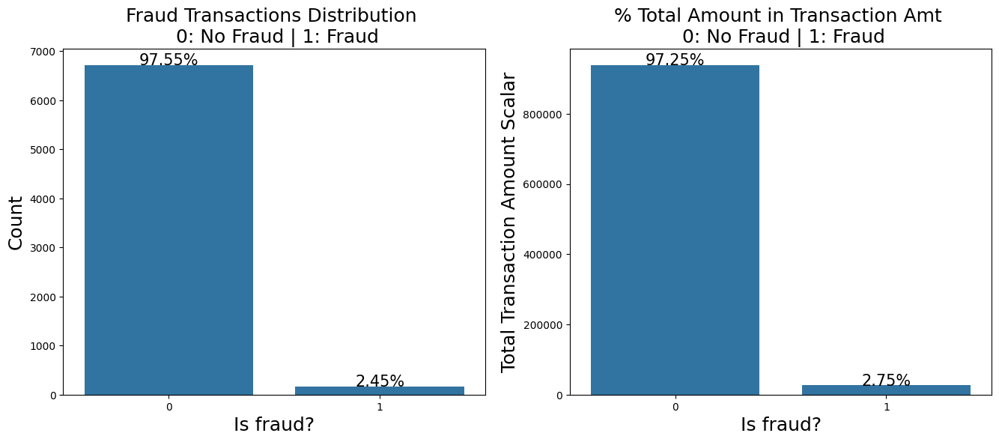

In [30]:
# Draw a countplot to check the distribution of target variable
df['TransactionAmt'] = df['TransactionAmt'].astype(float)
total = len(df)
total_amt = df.groupby(['isFraud'])['TransactionAmt'].sum().sum()
plt.figure(figsize=(16,6))

plt.subplot(121)
g = sns.countplot(x='isFraud', data=df )
g.set_title("Fraud Transactions Distribution \n 0: No Fraud | 1: Fraud", fontsize=18)
g.set_xlabel("Is fraud?", fontsize=18)
g.set_ylabel('Count', fontsize=18)
for p in g.patches:
    height = p.get_height()
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=15)

perc_amt = (df.groupby(['isFraud'])['TransactionAmt'].sum())
perc_amt = perc_amt.reset_index()

plt.subplot(122)
g1 = sns.barplot(x='isFraud', y='TransactionAmt',  dodge=True, data=perc_amt)
g1.set_title("% Total Amount in Transaction Amt \n 0: No Fraud | 1: Fraud", fontsize=18)
g1.set_xlabel("Is fraud?", fontsize=18)
g1.set_ylabel('Total Transaction Amount Scalar', fontsize=18)
for p in g1.patches:
    height = p.get_height()
    g1.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total_amt * 100),
            ha="center", fontsize=15)

plt.show()

In [31]:
# Average transaction amount by Y
df.groupby('isFraud')['TransactionAmt'].mean()

,TransactionAmt
isFraud,
0,139.726248
1,157.289062


<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- The target variable is **imbalanced**. 3.25% transactions are Fraud
- Around same % of transaction amounts are fraud


Let's explore the Transaction amount further

### Check distribution of Transaction Amount

Text(0, 0.5, 'Probability')

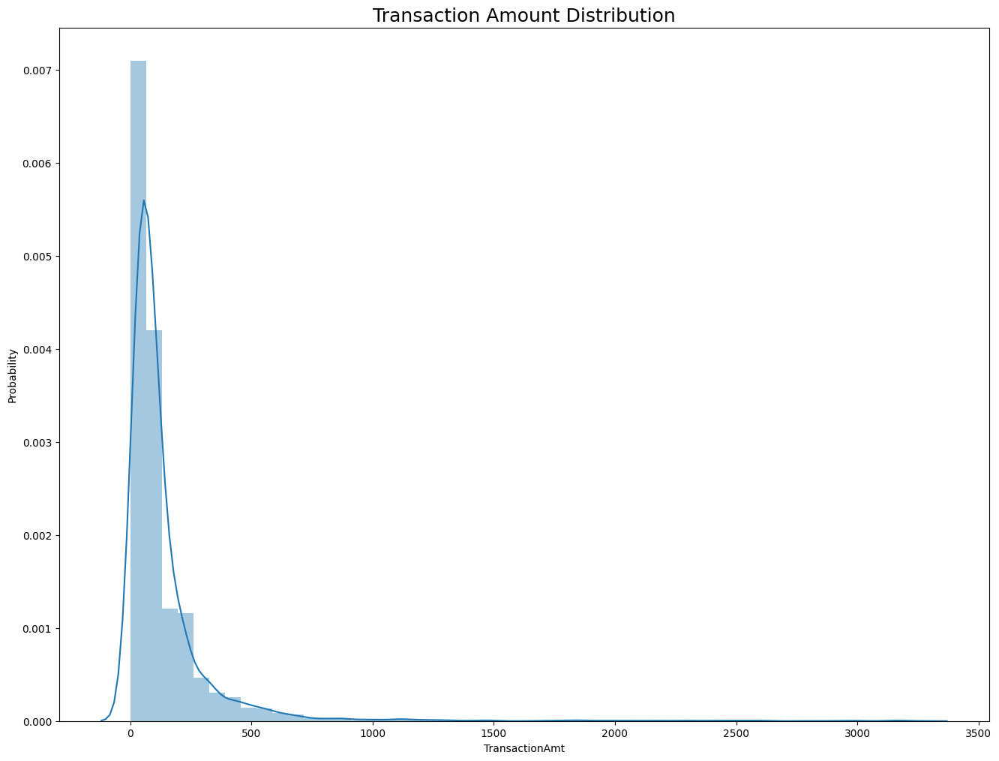

In [32]:
# Distribution plot of Transaction Amount
plt.figure(figsize=(16,12))

sns.distplot(df['TransactionAmt'])
plt.title("Transaction Amount Distribution",fontsize=18)
plt.ylabel("Probability")

There are certain transactions which are of very high amount, let's remove those to check the distribution

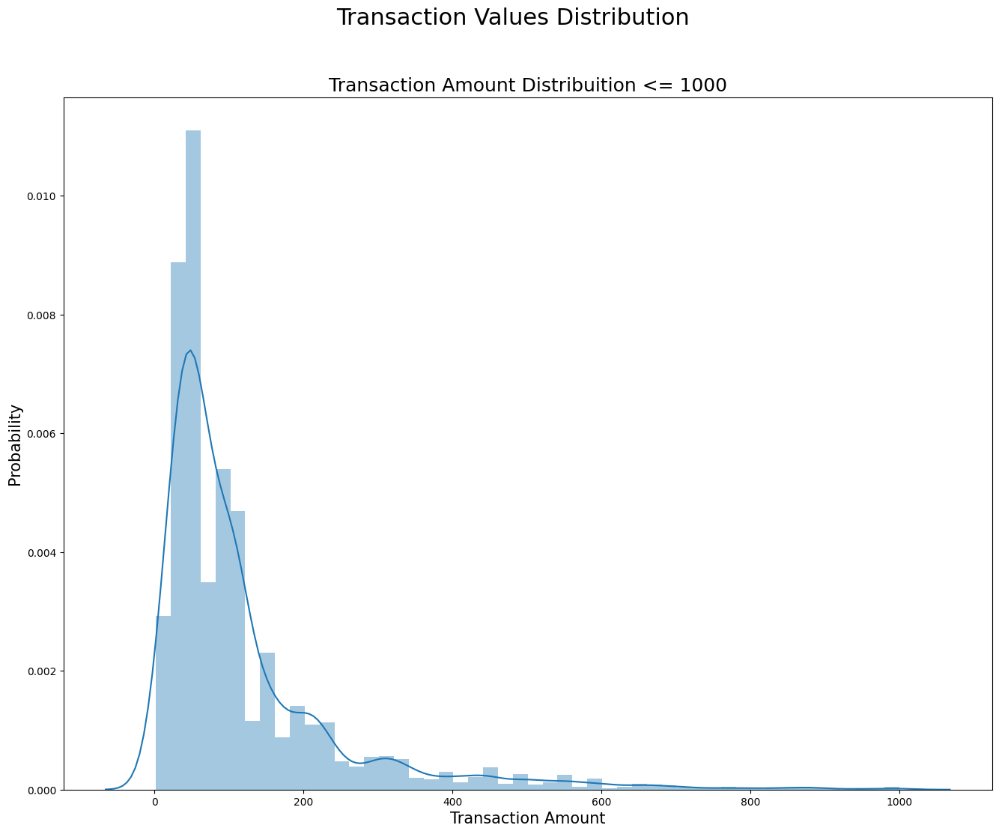

In [33]:
# Distribution plot of Transaction Amount less than 1000
plt.figure(figsize=(16,12))

plt.suptitle('Transaction Values Distribution', fontsize=22)
sns.distplot(df[df['TransactionAmt'] <= 1000]['TransactionAmt'])
plt.title("Transaction Amount Distribuition <= 1000", fontsize=18)
plt.xlabel("Transaction Amount", fontsize=15)
plt.ylabel("Probability", fontsize=15)

plt.show()

Most transactions lie in < $200 range

Transaction amount is right skewed.

Let's look at the log of transaction amount

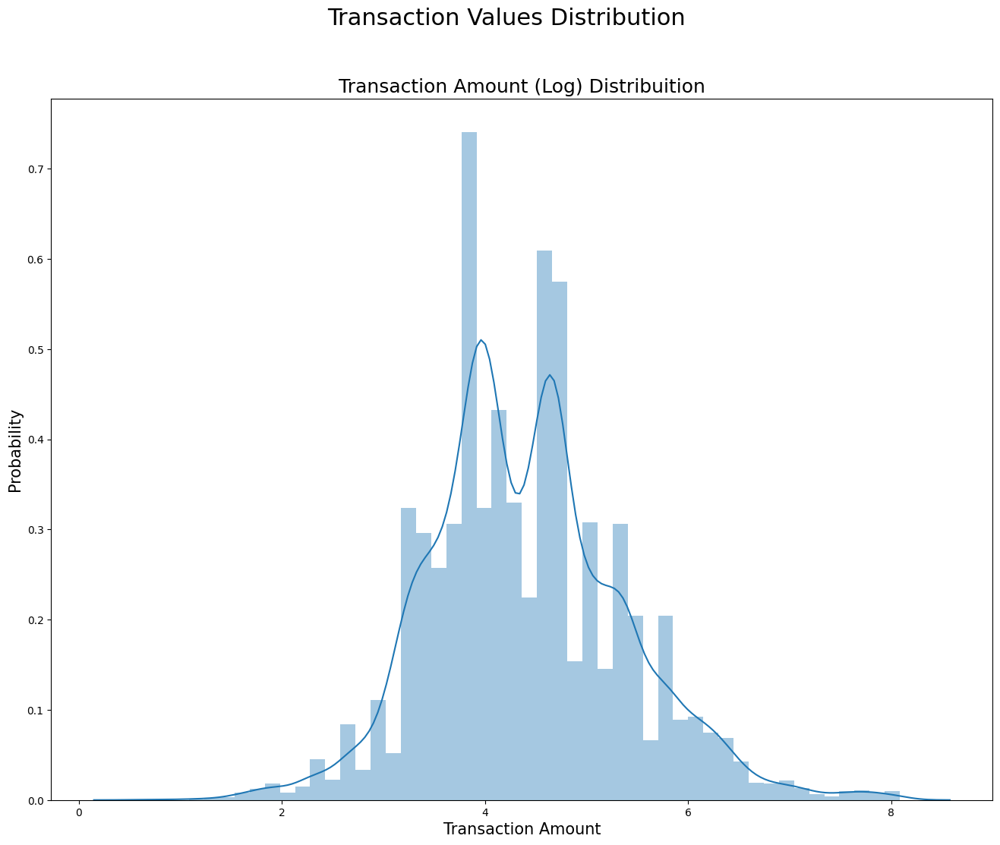

In [34]:
# Distribution plot of Transaction Amount less than 1000
plt.figure(figsize=(16,12))

plt.suptitle('Transaction Values Distribution', fontsize=22)
sns.distplot(np.log(df['TransactionAmt']))
plt.title("Transaction Amount (Log) Distribuition", fontsize=18)
plt.xlabel("Transaction Amount", fontsize=15)
plt.ylabel("Probability", fontsize=15)

plt.show()

<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- Transaction Amount is right skewed.
- Log of transaction amount is almost normally distributed, so use log of transaction amount while building the model

### Product Features

- Distribution of ProductCD
- Distribution of Frauds by Product

In [35]:
def plot_cat_feat_dist(df, col):
    tmp = pd.crosstab(df[col], df['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

    plt.figure(figsize=(16,12))
    plt.suptitle(f'{col} Distributions', fontsize=22)

    plt.subplot(221)
    g = sns.countplot(x=col, data=df, order=tmp[col].values)

    g.set_title(f"{col} Distribution", fontsize=16)
    g.set_xlabel(f"{col} Name", fontsize=17)
    g.set_ylabel("Count", fontsize=17)
    for p in g.patches:
        height = p.get_height()
        g.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/total*100),
                ha="center", fontsize=14)

    plt.subplot(222)
    g1 = sns.countplot(x=col, hue='isFraud', data=df, order=tmp[col].values)
    plt.legend(title='Fraud', loc='best', labels=['No', 'Yes'])
    gt = g1.twinx()
    gt = sns.pointplot(x=col, y='Fraud', data=tmp, color='black', order=tmp[col].values, legend=False)
    gt.set_ylabel("% of Fraud Transactions", fontsize=16)

    g1.set_title(f"{col} Distribution by Target Variable (isFraud) ", fontsize=16)
    g1.set_xlabel(f"{col} Name", fontsize=17)
    g1.set_ylabel("Count", fontsize=17)


    plt.subplots_adjust(hspace = 0.4, top = 0.85)

    plt.show()

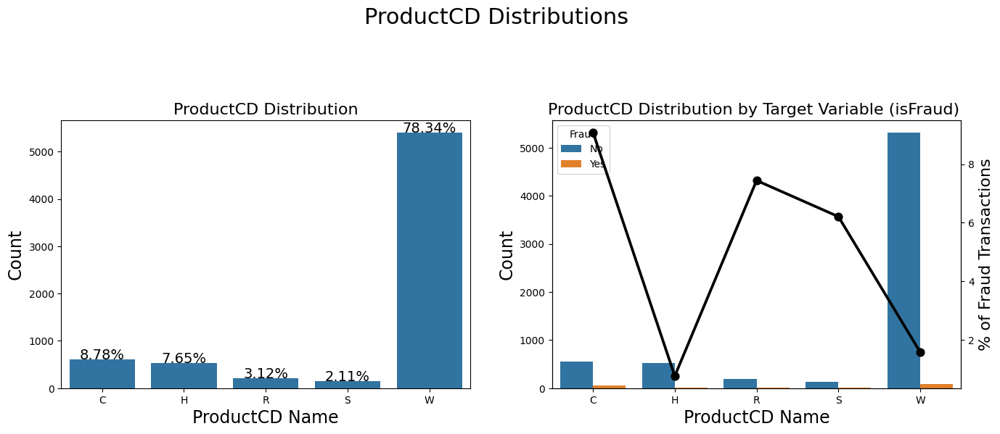

In [36]:
plot_cat_feat_dist(df, "ProductCD")

In [37]:
# Average fraud per transaction by ProductCD
df.groupby('ProductCD')['isFraud'].mean()

,isFraud
ProductCD,
C,0.090909
H,0.007590
R,0.074419
S,0.062069
W,0.015752


<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- 78.34% of the transactions are for Product Catergory W
- 8.78% of the transactions are for Product Category C
- Fraud Transaction rate is maximum for Product Category C and minimum for Product Category W

### Card Features

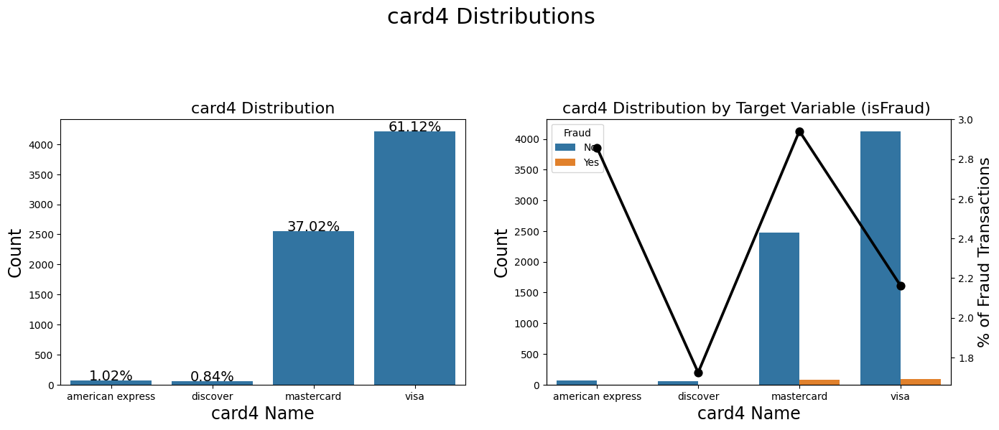

In [38]:
# Card 4
plot_cat_feat_dist(df, "card4")

In [39]:
# Average fraud per transaction by Card4
df.groupby('card4')['isFraud'].mean()

,isFraud
card4,
american express,0.028571
discover,0.017241
mastercard,0.029412
visa,0.021615


<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- 97% of transactions are from Mastercard(32%) and Visa(65%
- Fraud transaction rate is highest for discover cards(~8%) against ~3.5% of Mastercard and Visa and 2.87% in American Express

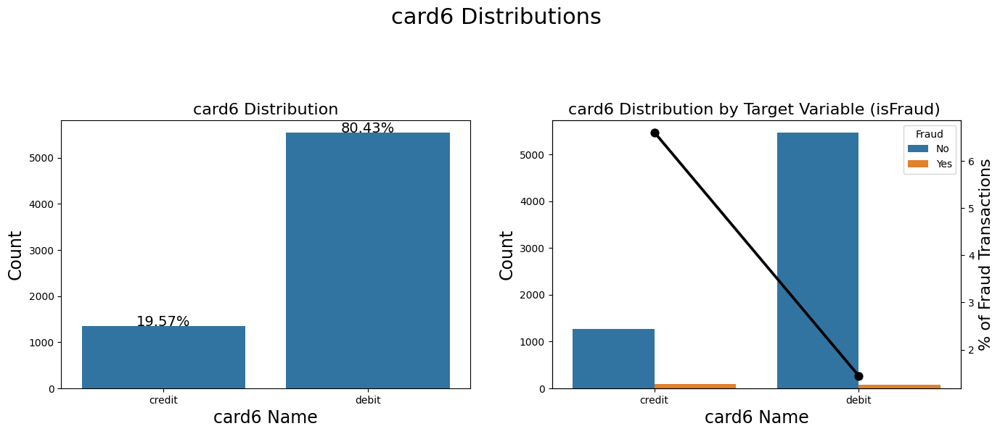

In [40]:
# Card 6
plot_cat_feat_dist(df, "card6")

In [41]:
# Average fraud per transaction by Card6
df.groupby('card6')['isFraud'].mean()

,isFraud
card6,
credit,0.066024
debit,0.014440


<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- Almost all the transactions are from Credit and Debit cards.
- Debit card transactions are almost 3 times as compared to credit card transactions.
- Fraud transaction rate is high for Credit cards as compared to Debit cards.


### P emaildomain

- It has multiple domains, let's group them by the respective enterprises
- Set all values with less than 500 entries as "Others"

In [42]:
df.loc[df['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'

df.loc[df['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo Mail'
df.loc[df['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx',
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
df.loc[df.P_emaildomain.isin(df.P_emaildomain\
                                         .value_counts()[df.P_emaildomain.value_counts() <= 500 ]\
                                         .index), 'P_emaildomain'] = "Others"
df.P_emaildomain.fillna("NoInf", inplace=True)

In [43]:
def plot_cat_with_amt(df, col, lim=2000):
    tmp = pd.crosstab(df[col], df['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

    plt.figure(figsize=(16,14))
    plt.suptitle(f'{col} Distributions ', fontsize=24)

    plt.subplot(211)
    g = sns.countplot( x=col,  data=df, order=list(tmp[col].values))
    gt = g.twinx()
    gt = sns.pointplot(x=col, y='Fraud', data=tmp, order=list(tmp[col].values),
                       color='black', legend=False, )
    gt.set_ylim(0,tmp['Fraud'].max()*1.1)
    gt.set_ylabel("%Fraud Transactions", fontsize=16)
    g.set_title(f"Share of {col} categories and % of Fraud Transactions", fontsize=18)
    g.set_xlabel(f"{col} Category Names", fontsize=16)
    g.set_ylabel("Count", fontsize=17)
    g.set_xticklabels(g.get_xticklabels(),rotation=45)
    sizes = []
    for p in g.patches:
        height = p.get_height()
        sizes.append(height)
        g.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/total*100),
                ha="center",fontsize=12)

    g.set_ylim(0,max(sizes)*1.15)

    #########################################################################
    perc_amt = (df.groupby(['isFraud',col])['TransactionAmt'].sum() \
                / df.groupby([col])['TransactionAmt'].sum() * 100).unstack('isFraud')
    perc_amt = perc_amt.reset_index()
    perc_amt.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)
    amt = df.groupby([col])['TransactionAmt'].sum().reset_index()
    perc_amt = perc_amt.fillna(0)
    plt.subplot(212)
    g1 = sns.barplot(x=col, y='TransactionAmt',
                       data=amt,
                       order=list(tmp[col].values))
    g1t = g1.twinx()
    g1t = sns.pointplot(x=col, y='Fraud', data=perc_amt,
                        order=list(tmp[col].values),
                       color='black', legend=False, )
    g1t.set_ylim(0,perc_amt['Fraud'].max()*1.1)
    g1t.set_ylabel("%Fraud Total Amount", fontsize=16)
    g.set_xticklabels(g.get_xticklabels(),rotation=45)
    g1.set_title(f"Transactions amount by {col} categories and % of Fraud Transactions (Amounts)", fontsize=18)
    g1.set_xlabel(f"{col} Category Names", fontsize=16)
    g1.set_ylabel("Transaction Total Amount(U$)", fontsize=16)
    g1.set_xticklabels(g.get_xticklabels(),rotation=45)

    for p in g1.patches:
        height = p.get_height()
        g1.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/total_amt*100),
                ha="center",fontsize=12)

    plt.subplots_adjust(hspace=.4, top = 0.9)
    plt.show()


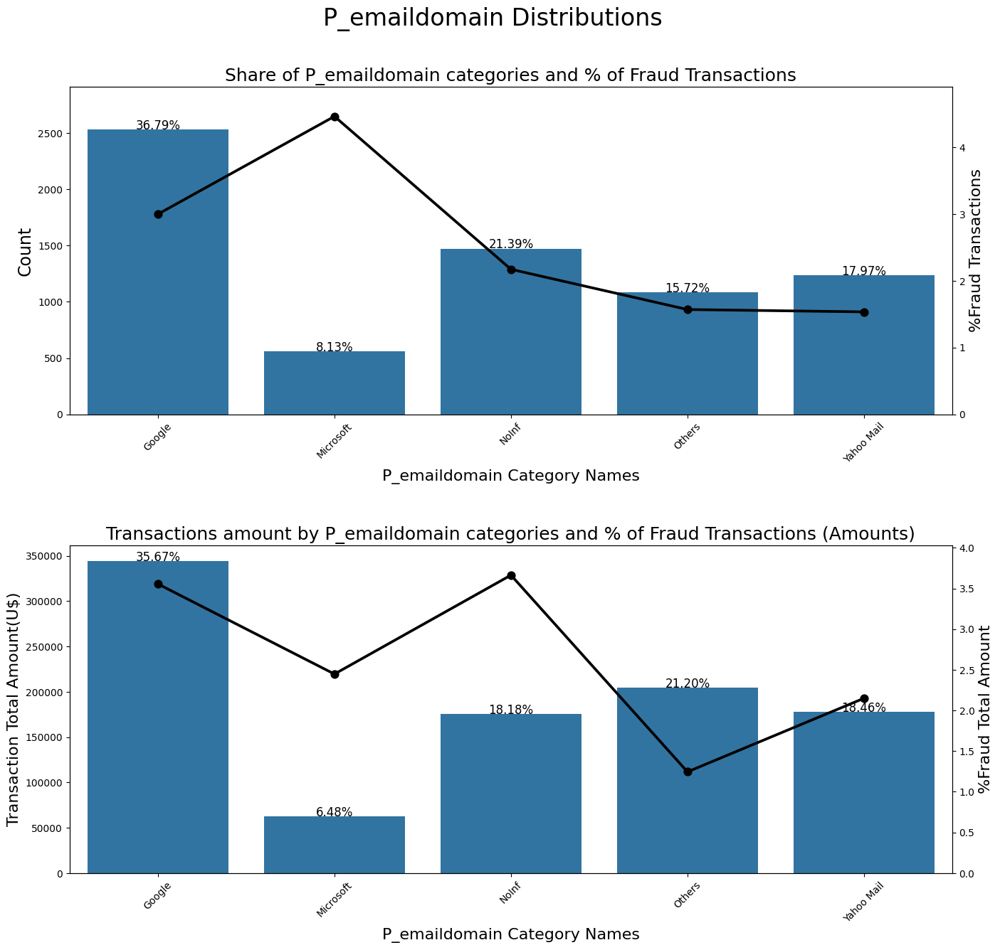

In [44]:
plot_cat_with_amt(df, 'P_emaildomain')

In [45]:
# Average fraud per transaction by Card6
df.groupby('P_emaildomain')['isFraud'].mean()

,isFraud
P_emaildomain,
Google,0.029992
Microsoft,0.044643
NoInf,0.021724
Others,0.015697
Yahoo Mail,0.015347


<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- Majority of transactions are with P_emaildomain as Google, Microsoft and Yahoo Mail
- There isn't any information about P_emaildomain of around 16% transactions in terms of count and 14.11% in terms of amount
- Fraud transaction rate for Microsoft is high as compared to Google and Yahoo mail
- Fraud transaction rate (amount) for Google is high as comapred to Microsoft and Yahoo mail

### R-Email Domain

- It has multiple domains, let's group them by the respective enterprises
- Set all values with less than 500 entries as "Others"

In [46]:
df.loc[df['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

df.loc[df['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                             'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                             'yahoo.es']), 'R_emaildomain'] = 'Yahoo Mail'
df.loc[df['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx',
                                             'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                             'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
df.loc[df.R_emaildomain.isin(df.R_emaildomain\
                                         .value_counts()[df.R_emaildomain.value_counts() <= 300 ]\
                                         .index), 'R_emaildomain'] = "Others"
df.R_emaildomain.fillna("NoInf", inplace=True)

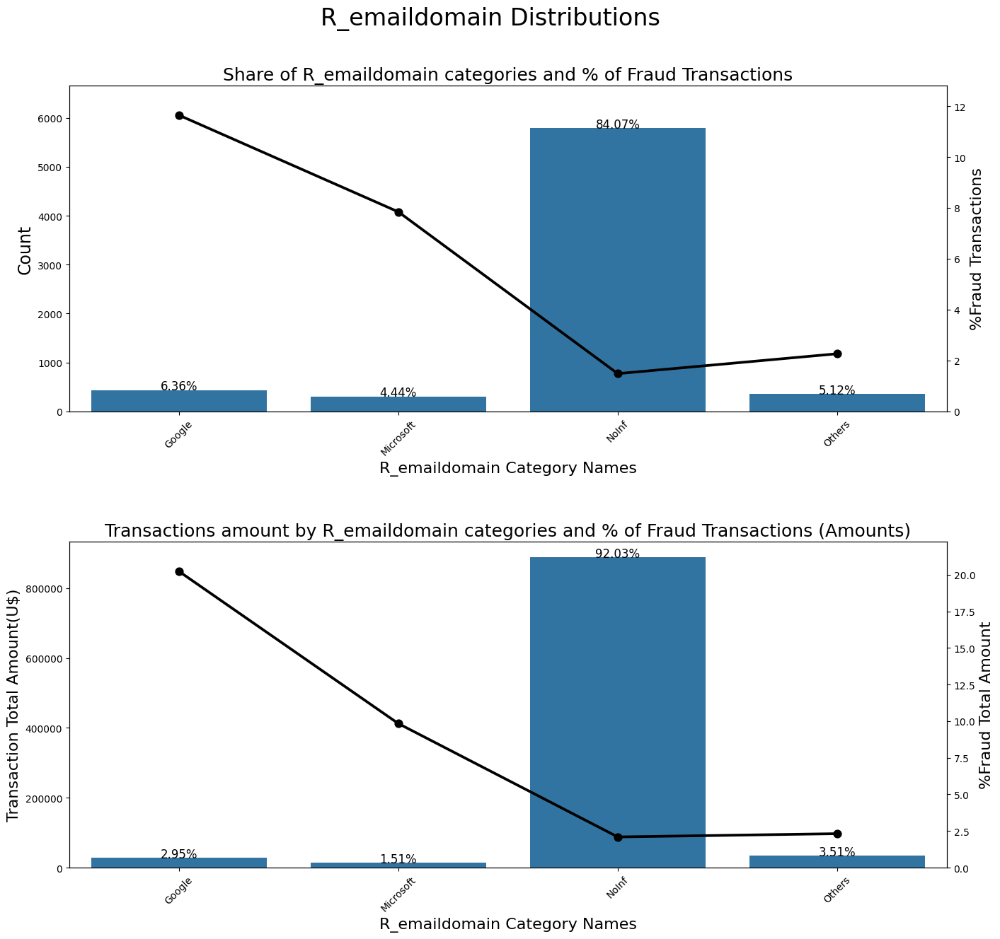

In [47]:
plot_cat_with_amt(df, 'R_emaildomain')

In [48]:
# Average fraud per transaction by Card6
df.groupby('R_emaildomain')['isFraud'].mean()

,isFraud
R_emaildomain,
Google,0.116438
Microsoft,0.078431
NoInf,0.014851
Others,0.022663


<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- There isn't any information about R_emaildomain for Majority of transactions (78.84% count , 85.62% amount)
- Fraud transaction rate for Google is high as compared to Yahoo, anaonymous.com and Microsoft

###  Days of the Month

Reference date is not known, it has been assumed. So can't say concretely if the day number is correct

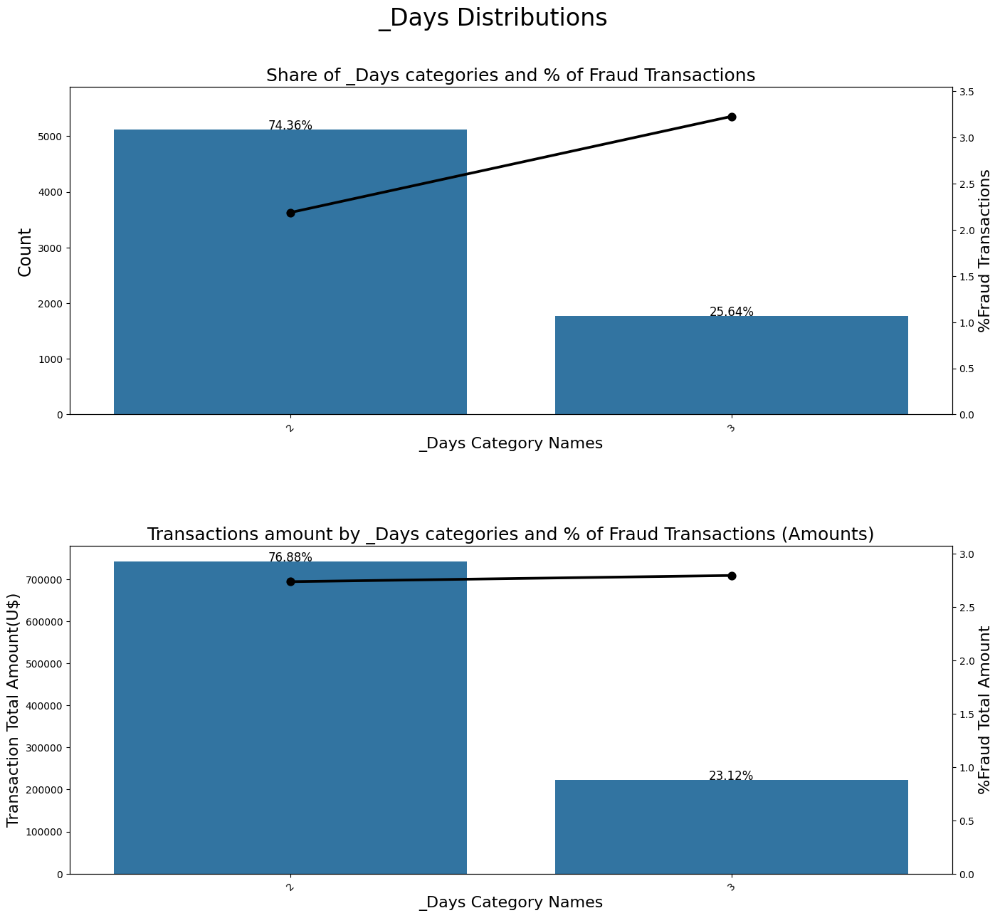

In [49]:
plot_cat_with_amt(df, '_Days')

<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- The perc of fraud transactions is highest towards the beginning and the end of the month. Might be accelerated at the time of receiving pay-checks.

- Incidentally, fraud transaction rate is high on the days when number of transactions are less

- Day 29,30 and 31 are having less transactions, looks like people are cautious with spending in those times.

### Days of the week

Reference date is not known, it has been assumed. So can't say concretely if the day number is correct

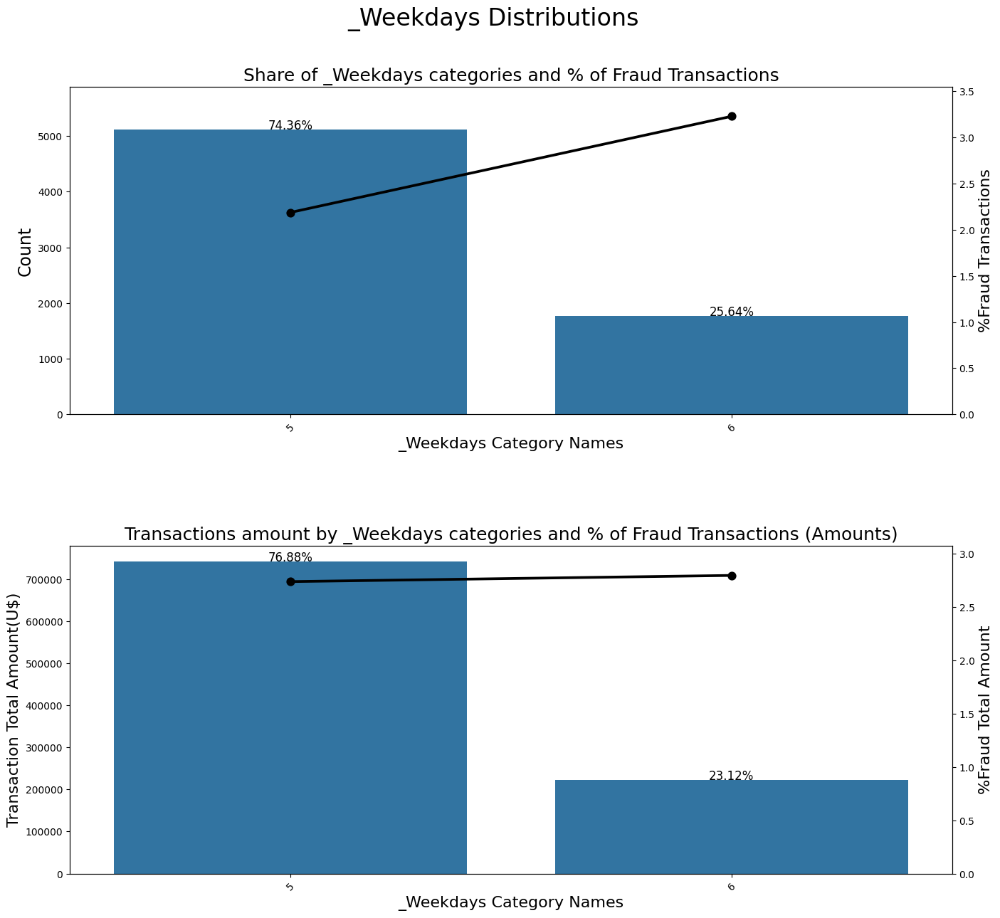

In [50]:
plot_cat_with_amt(df, '_Weekdays')

<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- Surprisingly fraud transaction rate is high on the days when number of transactions and transaction amounts are less. Day 0 and 6
- Day 0 and 6 have less transactions, these might be weekend days

### Hour of the Day

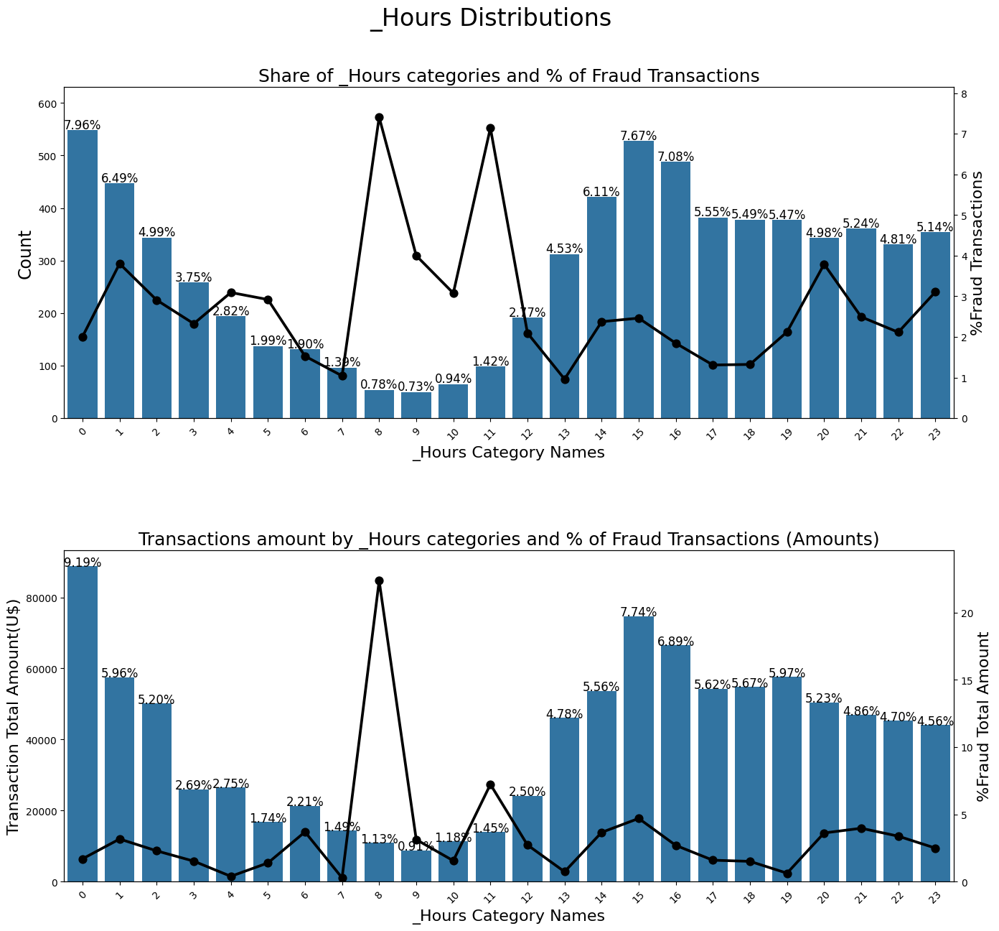

In [51]:
plot_cat_with_amt(df, '_Hours')

<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- Transactions start decreasing mid night but the fraud rate starts increasing
- Transactions from 3 AM to 12 PM needs to monitored very closely

### Device Type

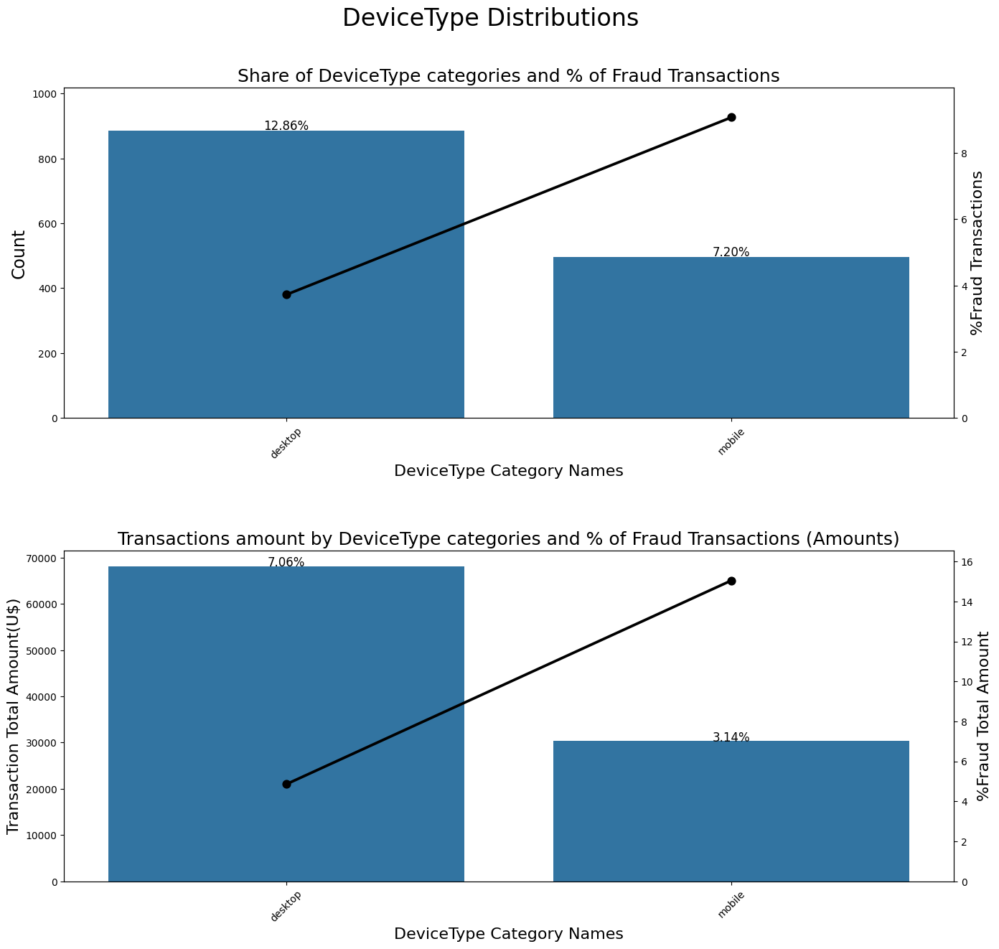

In [52]:
plot_cat_with_amt(df, "DeviceType")

<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- Device type is known for only 19.52% of the transactions
- Due to lack of data points, we can't infer from this analysis

### Columns from identity data

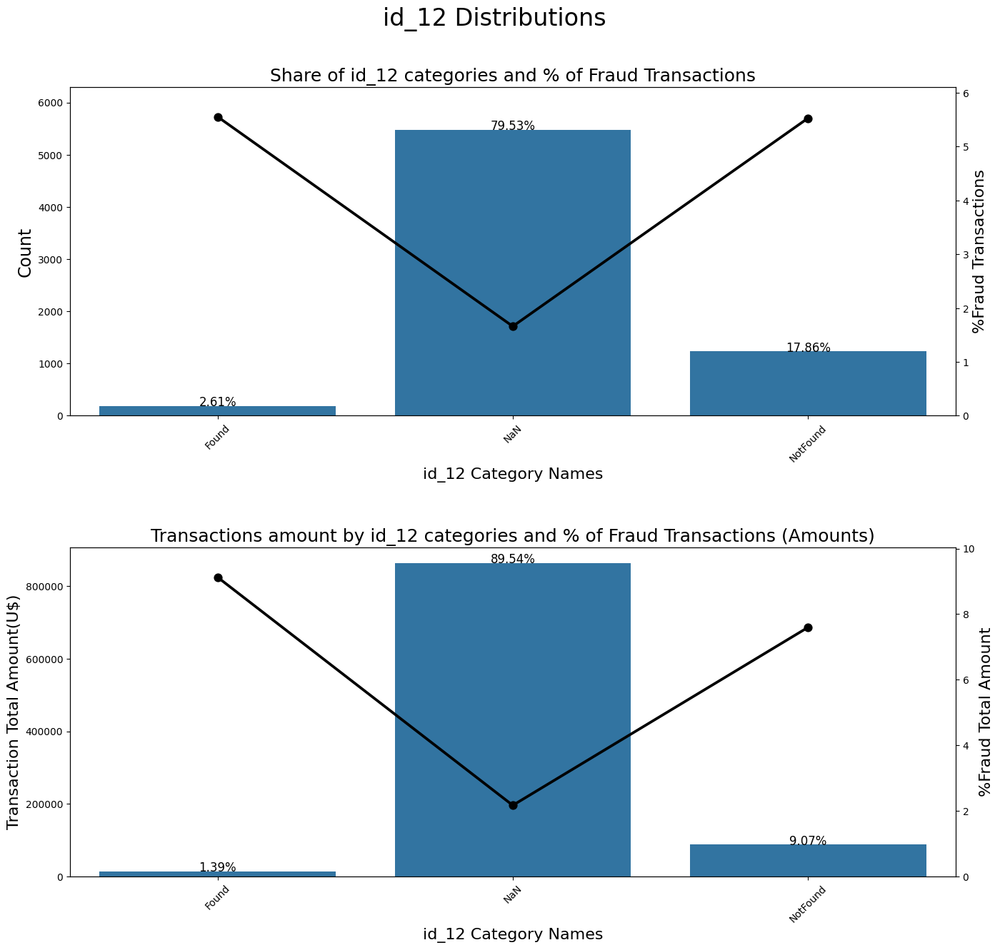

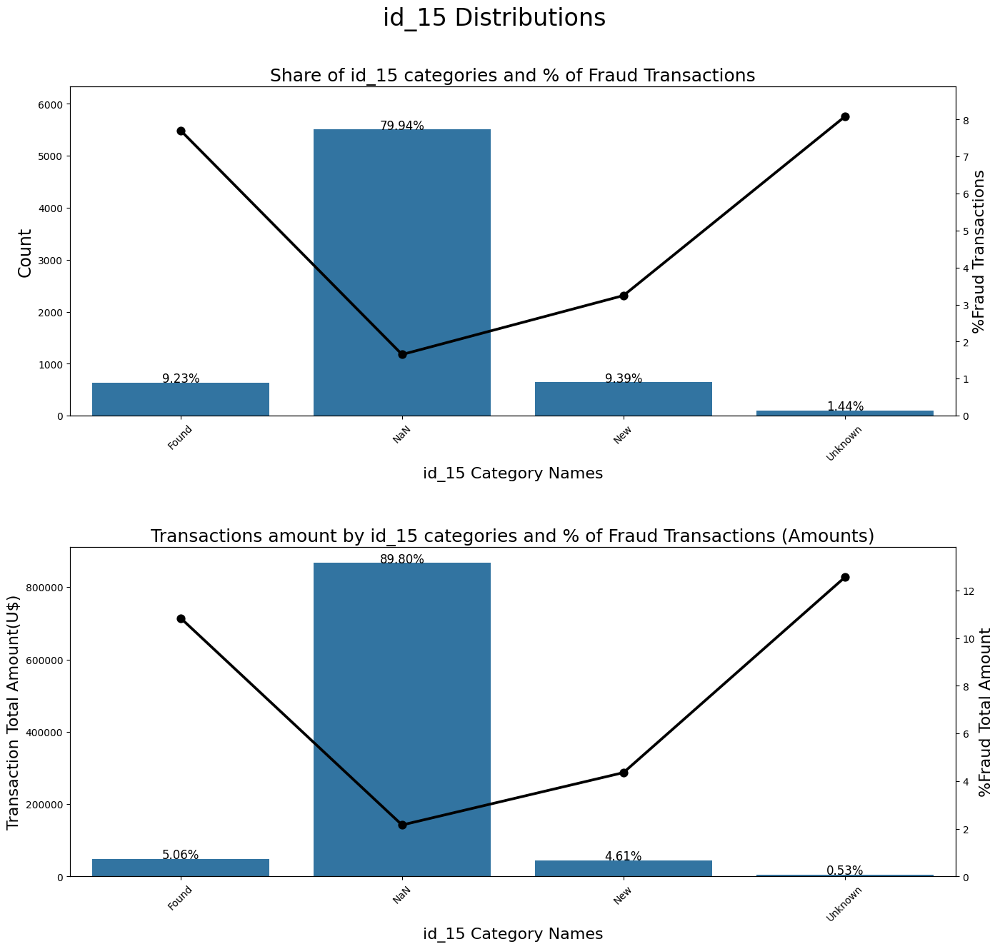

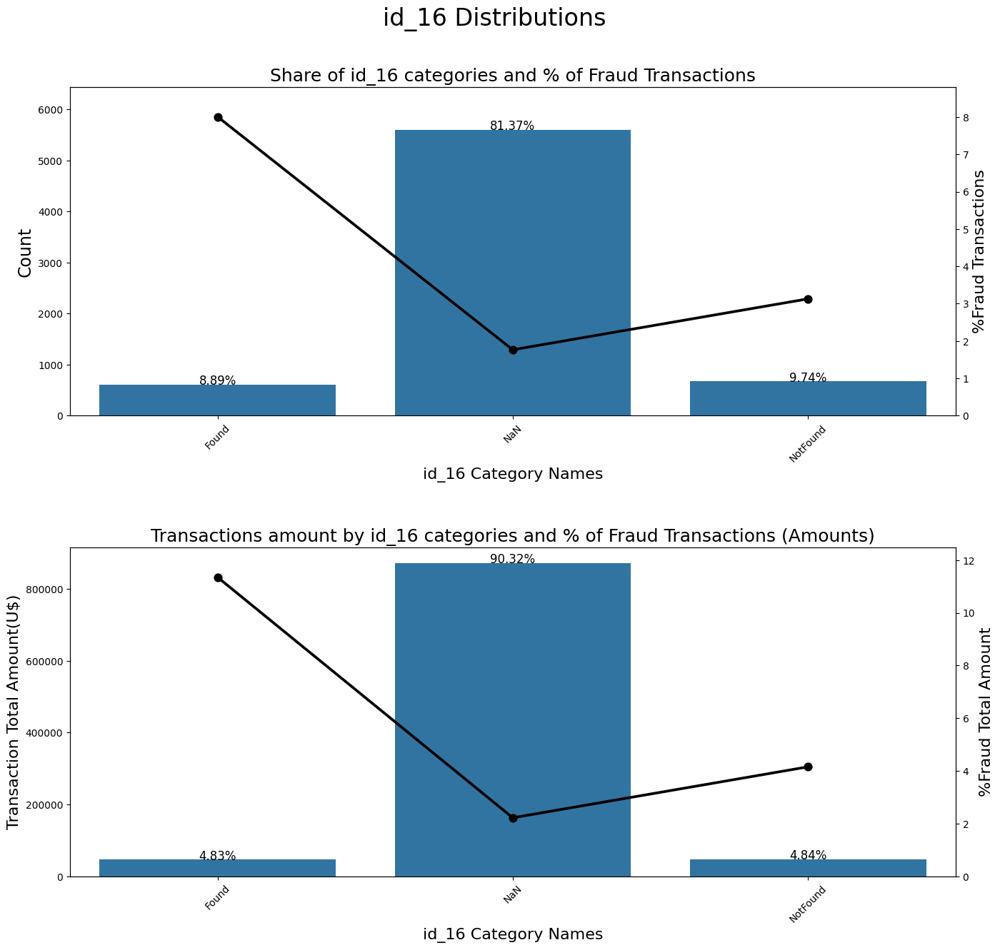

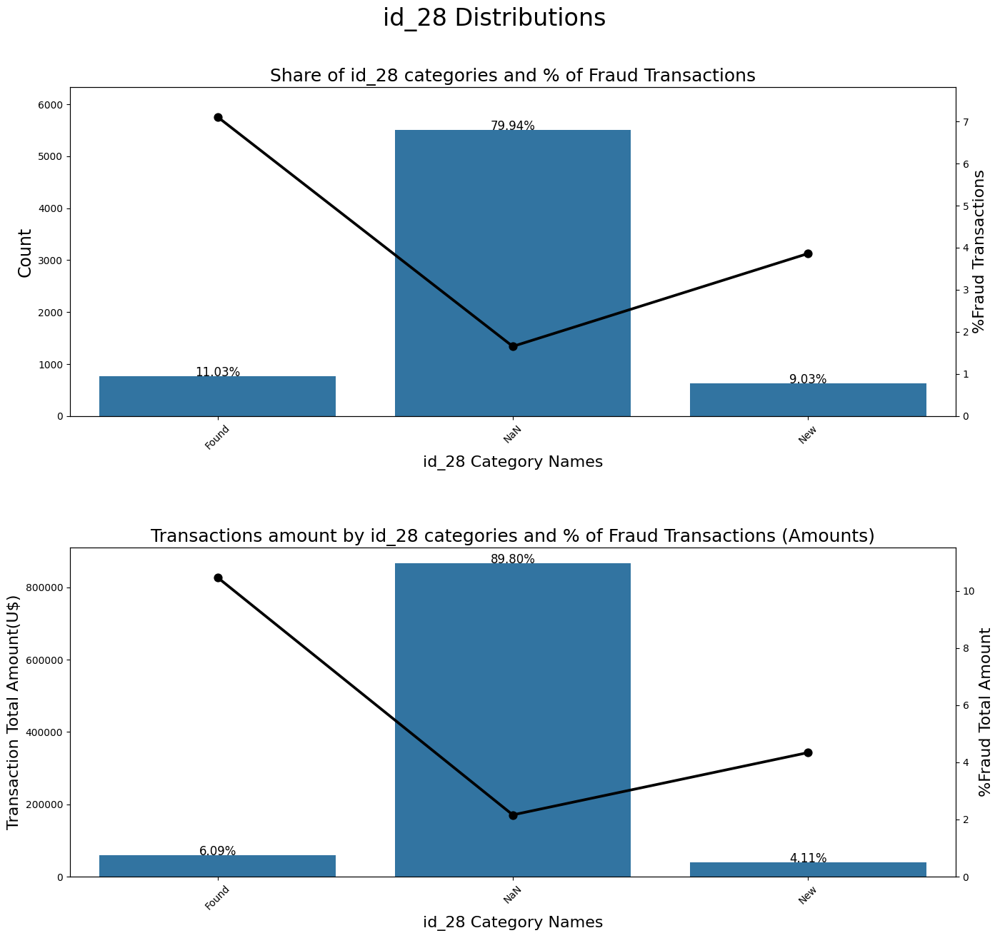

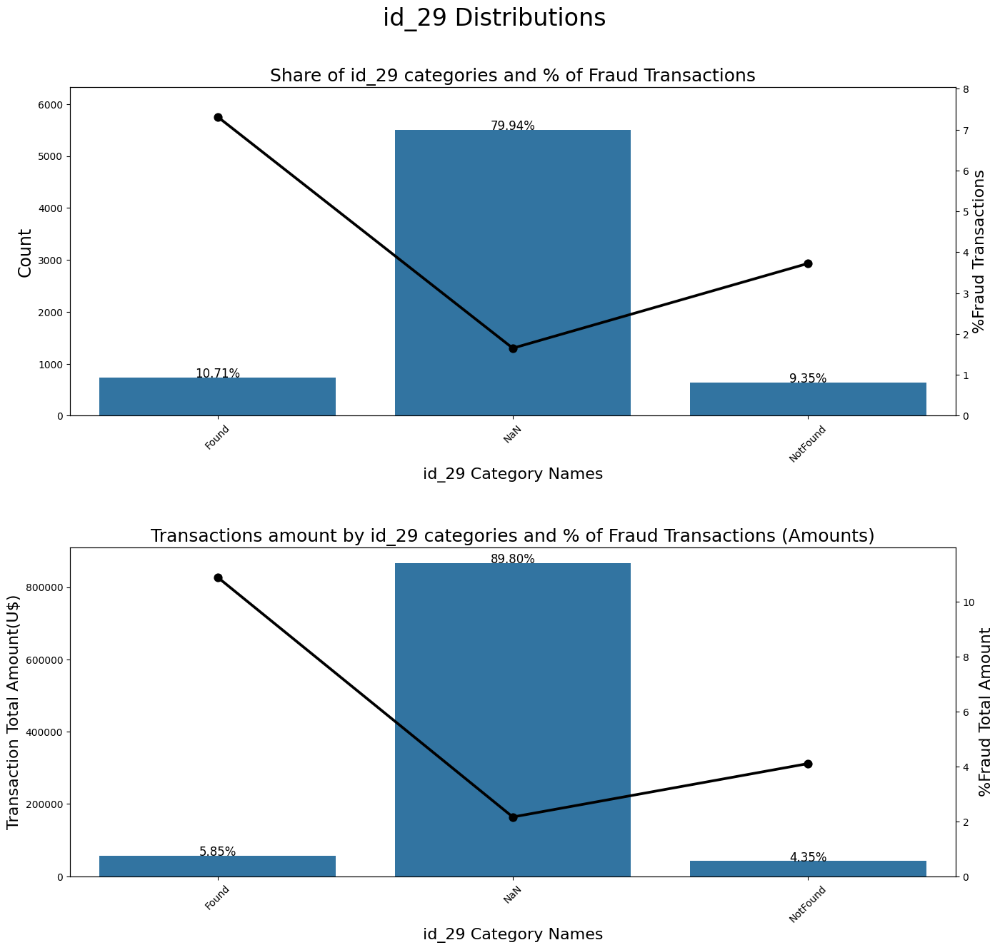

In [53]:
for col in ['id_12', 'id_15', 'id_16', 'id_28', 'id_29']:
    df[col] = df[col].fillna('NaN')
    plot_cat_with_amt(df, col)

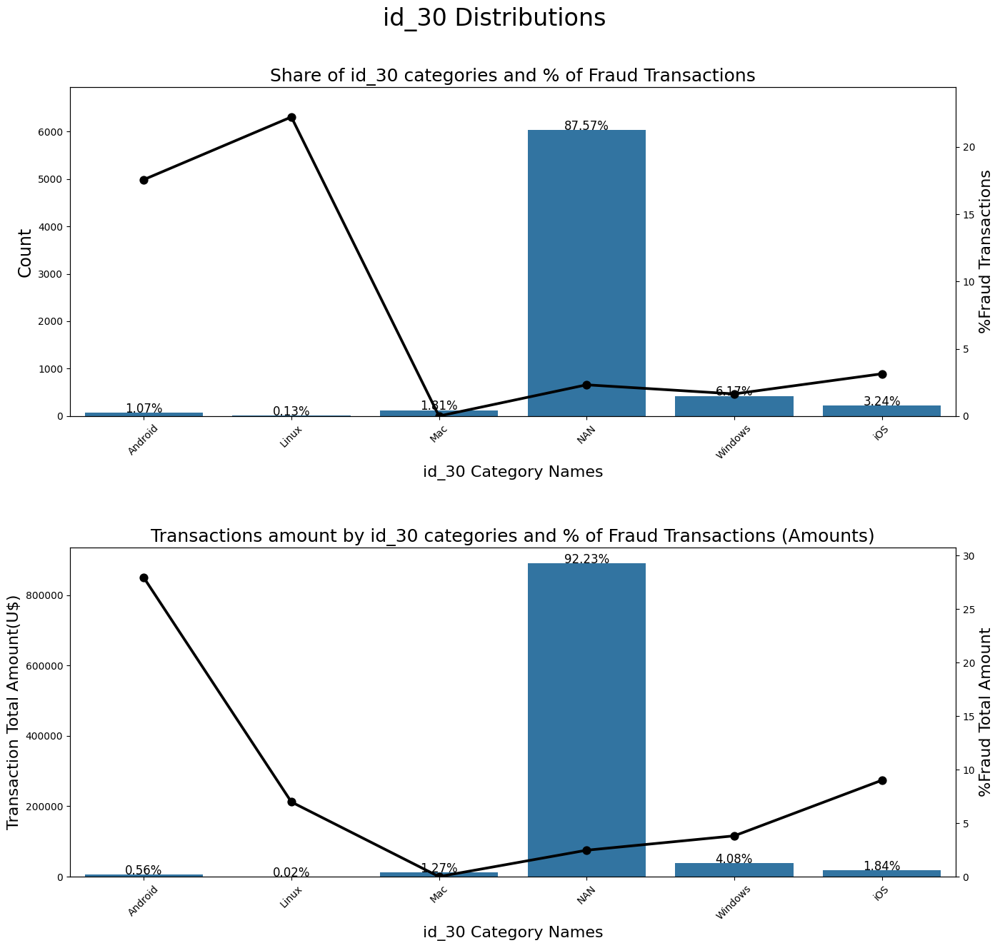

In [54]:
df.loc[df['id_30'].str.contains('Windows', na=False), 'id_30'] = 'Windows'
df.loc[df['id_30'].str.contains('iOS', na=False), 'id_30'] = 'iOS'
df.loc[df['id_30'].str.contains('Mac OS', na=False), 'id_30'] = 'Mac'
df.loc[df['id_30'].str.contains('Android', na=False), 'id_30'] = 'Android'
df['id_30'].fillna("NAN", inplace=True)

plot_cat_with_amt(df, "id_30")

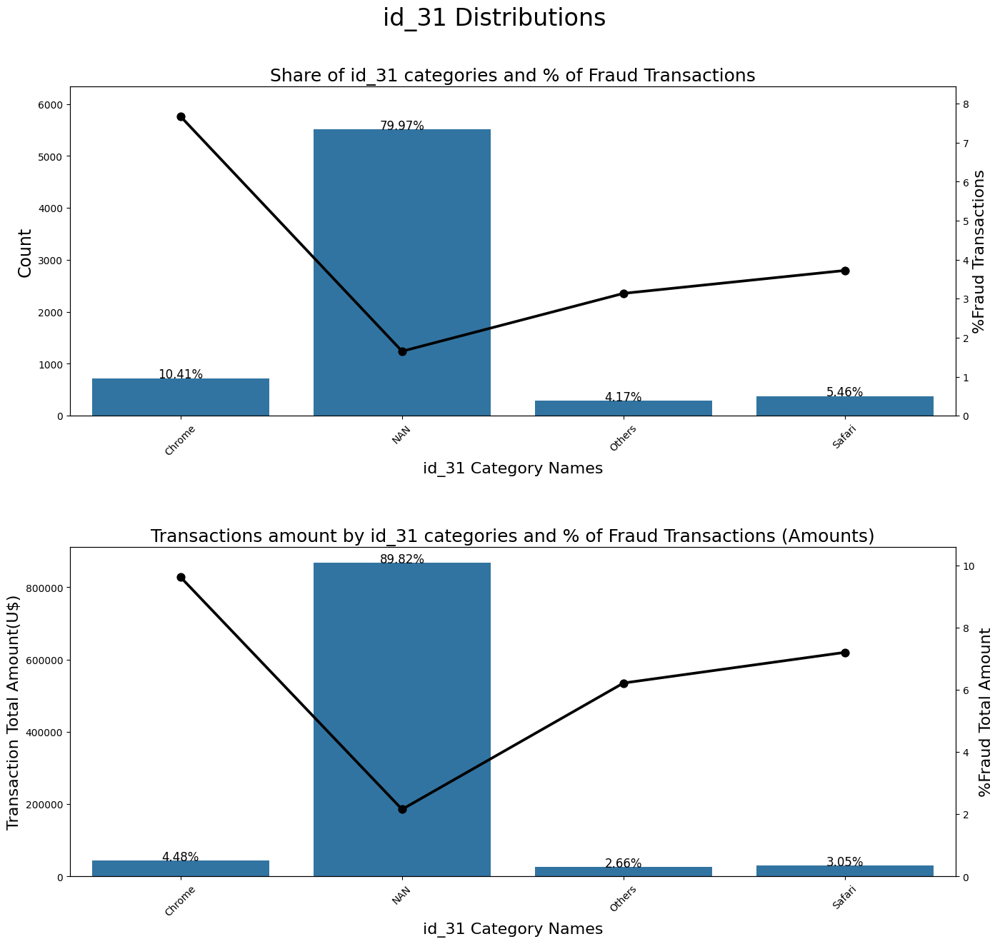

In [55]:
df.loc[df['id_31'].str.contains('chrome', na=False), 'id_31'] = 'Chrome'
df.loc[df['id_31'].str.contains('firefox', na=False), 'id_31'] = 'Firefox'
df.loc[df['id_31'].str.contains('safari', na=False), 'id_31'] = 'Safari'
df.loc[df['id_31'].str.contains('edge', na=False), 'id_31'] = 'Edge'
df.loc[df['id_31'].str.contains('ie', na=False), 'id_31'] = 'IE'
df.loc[df['id_31'].str.contains('samsung', na=False), 'id_31'] = 'Samsung'
df.loc[df['id_31'].str.contains('opera', na=False), 'id_31'] = 'Opera'
df['id_31'].fillna("NAN", inplace=True)
df.loc[df.id_31.isin(df.id_31.value_counts()[df.id_31.value_counts() < 200].index), 'id_31'] = "Others"
plot_cat_with_amt(df, "id_31")


### Get column names

In [56]:
cat_columns = df.select_dtypes(include=['object']).columns
len(cat_columns)

28

In [57]:
binary_columns = [col for col in df.columns if df[col].nunique() == 2]
len(binary_columns)

417

In [58]:
num_columns = [col for col in df.columns if (col not in cat_columns) & (col not in binary_columns)]
len(num_columns)

351

In [59]:
cat_columns = cat_columns.to_list() + binary_columns

## 7. Statistical Significance test

### Chi square test for categorical columns

In [60]:
from   scipy.stats import chi2_contingency

In [61]:
# significance value
alpha = 0.05

significant_categorical_variables = []

for col in cat_columns:
    print(f"Processing column: {col}, dtype: {df[col].dtype}")
    # Convert float16 columns to a supported dtype
    if df[col].dtype == 'float16':
        df[col] = df[col].astype('float64')

    # Create a crosstab table
    temp = pd.crosstab(df[col],df['isFraud'].astype('category'))

    # Get chi-square value , p-value, degrees of freedom, expected frequencies using the function chi2_contingency
    stat, p, dof, expected = chi2_contingency(temp)

    # Determine whether to reject or keep your null hypothesis
    print(col.ljust(40), ',  chisquared=%.5f,   p-value=%.5f' % (stat, p))
    if p <= alpha:
        significant_categorical_variables.append(col)
    else:
        ""

Processing column: ProductCD, dtype: object
ProductCD                                ,  chisquared=165.96643,   p-value=0.00000
Processing column: card4, dtype: object
card4                                    ,  chisquared=4.21015,   p-value=0.23965
Processing column: card6, dtype: object
card6                                    ,  chisquared=118.39119,   p-value=0.00000
Processing column: P_emaildomain, dtype: object
P_emaildomain                            ,  chisquared=21.00056,   p-value=0.00032
Processing column: R_emaildomain, dtype: object
R_emaildomain                            ,  chisquared=214.45644,   p-value=0.00000
Processing column: M2, dtype: object
M2                                       ,  chisquared=0.86422,   p-value=0.35256
Processing column: M3, dtype: object
M3                                       ,  chisquared=5.82360,   p-value=0.01581
Processing column: M4, dtype: object
M4                                       ,  chisquared=90.88369,   p-value=0.00000
Proce

In [62]:
print(significant_categorical_variables)

['ProductCD', 'card6', 'P_emaildomain', 'R_emaildomain', 'M3', 'M4', 'id_12', 'id_15', 'id_16', 'id_28', 'id_29', 'id_30', 'id_31', 'id_33', 'id_35', 'id_36', 'id_38', 'DeviceType', 'DeviceInfo', 'isFraud', 'card6', 'M3', 'V14', 'V15', 'V16', 'V31', 'V32', 'V33', 'V34', 'V50', 'V94', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'id_32', 'id_35', 'id_36', 'id_38', 'DeviceType', 'card5_missing_flag', 'addr1_missing_flag', 'addr2_missing_flag', 'dist1_missing_flag', 'R_emaildomain_missing_flag', 'D2_missing_flag', 'D3_missing_flag', 'D4_missing_flag', 'D6_missing_flag', 'D7_missing_flag', 'D8_missing_flag', 'D9_missing_flag', 'D11_missing_flag', 'D12_missing_flag', 'D13_missing_flag', 'D14_missing_flag', 'D15_missing_flag', 'M1_missing_flag', 'M2_missing_flag', 'M3_missing_flag', 'M4_missing_flag', 'M6_missing_flag', 'M7_missing_flag', 'M8_missing_flag', 'M9_missing_flag', 'V1_missing_flag', 'V2_missing_flag', 'V3_missing_flag', 'V4_missi

### Calculate odds

Chi-Square test tells if the entire variable is useful or not.

In [63]:
ctab = pd.crosstab(df['ProductCD'], df['isFraud'].astype('category'))
ctab

isFraud,0,1
ProductCD,,
C,550,55
H,523,4
R,199,16
S,136,9
W,5311,85


#### Odds

In [64]:
ctab.columns = ctab.columns.add_categories('odds')
ctab['odds'] = ctab[1]/ctab[0]
ctab

isFraud,0,1,odds
ProductCD,,,
C,550,55,0.100000
H,523,4,0.007648
R,199,16,0.080402
S,136,9,0.066176
W,5311,85,0.016005


#### Odds Ratio

In [65]:
if 'odds_ratio' not in ctab.columns.categories:
    ctab.columns = ctab.columns.add_categories('odds_ratio')
ctab['odds_ratio'] = ctab['odds'] / (ctab[1].sum()/ctab[0].sum())
ctab

isFraud,0,1,odds,odds_ratio
ProductCD,,,,
C,550,55,0.100000,3.975740
H,523,4,0.007648,0.304072
R,199,16,0.080402,3.196575
S,136,9,0.066176,2.631004
W,5311,85,0.016005,0.636298


Highers odds ratio implies more chance of fraud in that category.

Farther away it is from 1.0 (both directions) more important the variable is.

## 8. ANOVA Test

In [66]:
from scipy.stats import f_oneway

In [67]:
# significance value
alpha = 0.05

significant_numerical_variables = []
# Exclude the 'Date' column from the list of numerical columns
num_columns_to_test = [col for col in num_columns if col != 'Date']

for col in num_columns_to_test[2:]:
    # Determine whether to reject or keep your null hypothesis
    if df.loc[:, col].nunique() > 50:
        group1 = df[df.isFraud == 1][col].dropna()
        group2 = df[df.isFraud == 0][col].dropna()
        if len(group1) > 1 and len(group2) > 1:
            F, p = f_oneway(group1,group2)
            print(col.ljust(40), ',   F-statistic=%.5f, p=%.5f' % (F, p), df.loc[:, col].nunique())
            if p <= alpha:
                significant_numerical_variables.append(col)

TransactionAmt                           ,   F-statistic=0.90913, p=0.34038 1036
card1                                    ,   F-statistic=3.98636, p=0.04591 1609
card2                                    ,   F-statistic=nan, p=nan 367
addr1                                    ,   F-statistic=nan, p=nan 60
dist1                                    ,   F-statistic=nan, p=nan 370
C1                                       ,   F-statistic=0.00000, p=1.00000 162
C2                                       ,   F-statistic=0.00000, p=1.00000 148
C5                                       ,   F-statistic=nan, p=nan 146
C6                                       ,   F-statistic=nan, p=nan 129
C9                                       ,   F-statistic=nan, p=nan 106
C11                                      ,   F-statistic=nan, p=nan 141
C13                                      ,   F-statistic=nan, p=nan 331
C14                                      ,   F-statistic=nan, p=nan 131
D1                             

In [68]:
# Significant variables
significant_numerical_variables

['card1', 'V160', 'id_02']

<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> EDA Inferences:</h3>
</div>

- The target class in imbalanced
- Only 3.5% transactions are fraud in terms of count and 3.87% in terms of transaction amount
- `TransactionAmt` is right skewed so log transform needs to be used to make it normally distributed  
- Fraud Transaction rate is maximum for Product Category C and minimum for Product Category W
- 97% of transactions are from Mastercard(32%) and Visa(65%
- Fraud transaction rate is highest for discover cards(~8%) against ~3.5% of Mastercard and Visa and 2.87% in American Express
- Almost all the transactions are from Credit and Debit cards.
- Debit card transactions are almost 3 times as compared to credit card transactions.
- Fraud transaction rate is high for Credit cards as compared to Debit cards.
- Fraud transaction rate for Microsoft is high as compared to Google and Yahoo mail  # p emaildomain
- Fraud transaction rate (amount) for Google is high as comapred to Microsoft and Yahoo mail #p emaildomain
- There isn't any information about R_emaildomain for Majority of transactions (76.75% count , 85.62% amount) #r emaildomain
- Fraud transaction rate for Google is high as compared to Yahoo, anaonymous.com and Microsoft #r emaildomain
- Surprisingly fraud transaction rate is high on the days when number of transactions are less
- Day 29,30 and 31 are having less transactions, looks like people are broke at the month end
- Surprisingly fraud transaction rate is high on the days when number of transactions and transaction amounts are less. Day 0 and 6
- Day 0 and 6 have less transactions, these might be weekend days
- Transactions start decreasing mid night but the fraud rate starts increasing
- Transactions from 3 AM to 12 PM needs to monitored very closely

## 7. Feature Engineering

Feature engineering is the process of using domain and statistical knowledge to extract features from raw data via data mining techniques.

These features often help to improve the performance of machine learning models.


The goal of this section is to:
- Engineer domain specific features
- Dimensionality reduction
- Encode the categorical features

In [69]:
df.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,...,V91_missing_flag,V92_missing_flag,V93_missing_flag,V94_missing_flag,V138_missing_flag,V139_missing_flag,V140_missing_flag,V141_missing_flag,V142_missing_flag,V143_missing_flag,V144_missing_flag,V145_missing_flag,V146_missing_flag,V147_missing_flag,V148_missing_flag,V149_missing_flag,V150_missing_flag,V151_missing_flag,V152_missing_flag,V153_missing_flag,V154_missing_flag,V155_missing_flag,V156_missing_flag,V157_missing_flag,V158_missing_flag,V159_missing_flag,V160_missing_flag,V161_missing_flag,V162_missing_flag,V163_missing_flag,V164_missing_flag,V165_missing_flag,V166_missing_flag,V167_missing_flag,V168_missing_flag,V169_missing_flag,V170_missing_flag,V171_missing_flag,V172_missing_flag,V173_missing_flag,V174_missing_flag,V175_missing_flag,V176_missing_flag,V177_missing_flag,V178_missing_flag,V179_missing_flag,V180_missing_flag,V181_missing_flag,V182_missing_flag,V183_missing_flag,V184_missing_flag,V185_missing_flag,V186_missing_flag,V187_missing_flag,V188_missing_flag,V189_missing_flag,V190_missing_flag,V191_missing_flag,V192_missing_flag,V193_missing_flag,V194_missing_flag,V195_missing_flag,V196_missing_flag,V197_missing_flag,V198_missing_flag,V199_missing_flag,V200_missing_flag,V201_missing_flag,V202_missing_flag,V203_missing_flag,V204_missing_flag,V205_missing_flag,V206_missing_flag,V207_missing_flag,V208_missing_flag,V209_missing_flag,V210_missing_flag,V211_missing_flag,V212_missing_flag,V213_missing_flag,V214_missing_flag,V215_missing_flag,V216_missing_flag,V217_missing_flag,V218_missing_flag,V219_missing_flag,V220_missing_flag,V221_missing_flag,V222_missing_flag,V223_missing_flag,V224_missing_flag,V225_missing_flag,V226_missing_flag,V227_missing_flag,V228_missing_flag,V229_missing_flag,V230_missing_flag,V231_missing_flag,V232_missing_flag,V233_missing_flag,V234_missing_flag,V235_missing_flag,V236_missing_flag,V237_missing_flag,V238_missing_flag,V239_missing_flag,V240_missing_flag,V241_missing_flag,V242_missing_flag,V243_missing_flag,V244_missing_flag,V245_missing_flag,V246_missing_flag,V247_missing_flag,V248_missing_flag,V249_missing_flag,V250_missing_flag,V251_missing_flag,V252_missing_flag,V253_missing_flag,V254_missing_flag,V255_missing_flag,V256_missing_flag,V257_missing_flag,V258_missing_flag,V259_missing_flag,V260_missing_flag,V261_missing_flag,V262_missing_flag,V263_missing_flag,V264_missing_flag,V265_missing_flag,V266_missing_flag,V267_missing_flag,V268_missing_flag,V269_missing_flag,V270_missing_flag,V271_missing_flag,V272_missing_flag,V273_missing_flag,V274_missing_flag,V275_missing_flag,V276_missing_flag,V277_missing_flag,V278_missing_flag,V279_missing_flag,V280_missing_flag,V281_missing_flag,V282_missing_flag,V283_missing_flag,V284_missing_flag,V285_missing_flag,V286_missing_flag,V287_missing_flag,V288_missing_flag,V289_missing_flag,V290_missing_flag,V291_missing_flag,V292_m

### Domain Specific Features

We need to engineer the domain specific features. This might boost up the predictive power. This often gives better performing models

Domain knowledge is one of the key pillars of data science. So we need to always understand the domain before attempting the problem.

In [70]:
# Transaction amount minus mean of transaction
df['Trans_min_mean'] = df['TransactionAmt'] - np.nanmean(df['TransactionAmt'],dtype="float64")
df['Trans_min_std']  = df['Trans_min_mean'] / np.nanstd(df['TransactionAmt'].astype("float64"),dtype="float64")

Replace value by the group's mean (or standard dev)

In [71]:
# Features for transaction amount and card
df['TransactionAmt_to_mean_card1'] = df['TransactionAmt'] / df.groupby(['card1'])['TransactionAmt'].transform('mean')
df['TransactionAmt_to_mean_card4'] = df['TransactionAmt'] / df.groupby(['card4'])['TransactionAmt'].transform('mean')
df['TransactionAmt_to_std_card1']  = df['TransactionAmt'] / df.groupby(['card1'])['TransactionAmt'].transform('std')
df['TransactionAmt_to_std_card4']  = df['TransactionAmt'] / df.groupby(['card4'])['TransactionAmt'].transform('std')

In [72]:
# Log of transaction amount
df['TransactionAmt'] = np.log(df['TransactionAmt'])

In [73]:
df.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,...,V140_missing_flag,V141_missing_flag,V142_missing_flag,V143_missing_flag,V144_missing_flag,V145_missing_flag,V146_missing_flag,V147_missing_flag,V148_missing_flag,V149_missing_flag,V150_missing_flag,V151_missing_flag,V152_missing_flag,V153_missing_flag,V154_missing_flag,V155_missing_flag,V156_missing_flag,V157_missing_flag,V158_missing_flag,V159_missing_flag,V160_missing_flag,V161_missing_flag,V162_missing_flag,V163_missing_flag,V164_missing_flag,V165_missing_flag,V166_missing_flag,V167_missing_flag,V168_missing_flag,V169_missing_flag,V170_missing_flag,V171_missing_flag,V172_missing_flag,V173_missing_flag,V174_missing_flag,V175_missing_flag,V176_missing_flag,V177_missing_flag,V178_missing_flag,V179_missing_flag,V180_missing_flag,V181_missing_flag,V182_missing_flag,V183_missing_flag,V184_missing_flag,V185_missing_flag,V186_missing_flag,V187_missing_flag,V188_missing_flag,V189_missing_flag,V190_missing_flag,V191_missing_flag,V192_missing_flag,V193_missing_flag,V194_missing_flag,V195_missing_flag,V196_missing_flag,V197_missing_flag,V198_missing_flag,V199_missing_flag,V200_missing_flag,V201_missing_flag,V202_missing_flag,V203_missing_flag,V204_missing_flag,V205_missing_flag,V206_missing_flag,V207_missing_flag,V208_missing_flag,V209_missing_flag,V210_missing_flag,V211_missing_flag,V212_missing_flag,V213_missing_flag,V214_missing_flag,V215_missing_flag,V216_missing_flag,V217_missing_flag,V218_missing_flag,V219_missing_flag,V220_missing_flag,V221_missing_flag,V222_missing_flag,V223_missing_flag,V224_missing_flag,V225_missing_flag,V226_missing_flag,V227_missing_flag,V228_missing_flag,V229_missing_flag,V230_missing_flag,V231_missing_flag,V232_missing_flag,V233_missing_flag,V234_missing_flag,V235_missing_flag,V236_missing_flag,V237_missing_flag,V238_missing_flag,V239_missing_flag,V240_missing_flag,V241_missing_flag,V242_missing_flag,V243_missing_flag,V244_missing_flag,V245_missing_flag,V246_missing_flag,V247_missing_flag,V248_missing_flag,V249_missing_flag,V250_missing_flag,V251_missing_flag,V252_missing_flag,V253_missing_flag,V254_missing_flag,V255_missing_flag,V256_missing_flag,V257_missing_flag,V258_missing_flag,V259_missing_flag,V260_missing_flag,V261_missing_flag,V262_missing_flag,V263_missing_flag,V264_missing_flag,V265_missing_flag,V266_missing_flag,V267_missing_flag,V268_missing_flag,V269_missing_flag,V270_missing_flag,V271_missing_flag,V272_missing_flag,V273_missing_flag,V274_missing_flag,V275_missing_flag,V276_missing_flag,V277_missing_flag,V278_missing_flag,V279_missing_flag,V280_missing_flag,V281_missing_flag,V282_missing_flag,V283_missing_flag,V284_missing_flag,V285_missing_flag,V286_missing_flag,V287_missing_flag,V288_missing_flag,V289_missing_flag,V290_missing_flag,V291_missing_flag,V292_missing_flag,V293_missing_flag,V294_missing_flag,V295_missing_flag,V296_missing_flag,V297_missing_flag,V2

In [74]:
# The dataframe is already in memory, so we can continue to the next step.

## 8. Dimensionality Reduction - PCA

When dealing with high dimensional data, it is often useful to reduce the dimensionality by projecting the data to a lower dimensional subspace which captures the “essence” of the data.

Dimensionality reduction, or dimension reduction, is the transformation of data from a high-dimensional space into a low-dimensional space so that the low-dimensional representation retains some meaningful properties of the original data, ideally close to its intrinsic dimension.


**Principal component analysis**  is a technique for reducing the dimensionality of such datasets, increasing interpretability but at the same time minimizing information loss. It does so by creating new uncorrelated variables that successively maximize variance.

In [75]:
# initialize function to perform PCA
def perform_PCA(df, cols, n_components, prefix='PCA_', rand_seed=4):
    pca = PCA(n_components=n_components, random_state=rand_seed)
    principalComponents = pca.fit_transform(df[cols])
    principalDf = pd.DataFrame(principalComponents)
    df.drop(cols, axis=1, inplace=True)

    principalDf.rename(columns=lambda x: str(prefix)+str(x), inplace=True)
    df = pd.concat([df, principalDf], axis=1)
    return df

Create a list of all the columns on which PCA needs to performed

In [76]:
# Columns starting from V1 to V339
filter_col = df.columns[53:392]

Impute missing values in the mas_v columns, later use minmax_scale function to scale the values in these columns

In [77]:
from   sklearn.preprocessing import minmax_scale

In [79]:
from sklearn.preprocessing import minmax_scale

# Separate object and numeric columns
object_cols = df[filter_col].select_dtypes(include=['object']).columns
numeric_cols = df[filter_col].select_dtypes(exclude=['object']).columns

# Fill na values and scale V columns for numeric columns
for col in numeric_cols:
    df[col] = df[col].fillna((df[col].min() - 2))
    df[col] = (minmax_scale(df[col], feature_range=(0,1)))

# For object columns, you might want to encode them first if they are categorical
# For now, we will just fill NA with a placeholder
for col in object_cols:
    df[col] = df[col].fillna('missing')
    # If you intend to use these in PCA, they must be converted to numeric
    # For example, using one-hot encoding or label encoding
    # Since PCA is the next step, let's try to convert them if possible,
    # otherwise we should exclude them from PCA
    try:
        df[col] = pd.to_numeric(df[col])
        df[col] = df[col].fillna((df[col].min() - 2))
        df[col] = (minmax_scale(df[col], feature_range=(0,1)))
    except (ValueError, TypeError):
        print(f"Could not convert column {col} to numeric, excluding from PCA.")
        filter_col = filter_col.drop(col)


# Perform PCA on the processed numeric columns
df = perform_PCA(df, filter_col, prefix='PCA_V_', n_components=30)

Could not convert column id_12 to numeric, excluding from PCA.


Reduce memory usage of df as lot of new features have been created

In [80]:
df = reduce_mem_usage(df)

Mem. usage decreased to 12.62 Mb (10.9% reduction)


In [81]:
df.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,id_12,id_13,id_14,id_15,id_16,id_17,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,card2_missing_flag,card5_missing_flag,addr1_missing_flag,addr2_missing_flag,dist1_missing_flag,dist2_missing_flag,P_emaildomain_missing_flag,R_emaildomain_missing_flag,D2_missing_flag,D3_missing_flag,D4_missing_flag,D5_missing_flag,D6_missing_flag,D7_missing_flag,D8_missing_flag,D9_missing_flag,D10_missing_flag,D11_missing_flag,D12_missing_flag,D13_missing_flag,D14_missing_flag,D15_missing_flag,M1_missing_flag,M2_missing_flag,M3_missing_flag,M4_missing_flag,M5_missing_flag,M6_missing_flag,M7_missing_flag,M8_missing_flag,M9_missing_flag,V1_missing_flag,V2_missing_flag,V3_missing_flag,V4_missing_flag,V5_missing_flag,V6_missing_flag,V7_missing_flag,V8_missing_flag,V9_missing_flag,V10_missing_flag,V11_missing_flag,V12_missing_flag,V13_missing_flag,V14_missing_flag,V15_missing_flag,V16_missing_flag,V17_missing_flag,V18_missing_flag,V19_missing_flag,V20_missing_flag,V21_missing_flag,V22_missing_flag,V23_missing_flag,V24_missing_flag,V25_missing_flag,V26_missing_flag,V27_missing_flag,V28_missing_flag,V29_missing_flag,V30_missing_flag,V31_missing_flag,V32_missing_flag,V33_missing_flag,V34_missing_flag,V35_missing_flag,V36_missing_flag,V37_missing_flag,V38_missing_flag,V39_missing_flag,V40_missing_flag,V41_missing_flag,V42_missing_flag,V43_missing_flag,V44_missing_flag,V45_missing_flag,V46_missing_flag,V47_missing_flag,V48_missing_flag,V49_missing_flag,V50_missing_flag,V51_missing_flag,V52_missing_flag,V53_missing_flag,V54_missing_flag,V55_missing_flag,V56_missing_flag,V57_missing_flag,V58_missing_flag,V59_missing_flag,V60_missing_flag,V61_missing_flag,V62_missing_flag,V63_missing_flag,V64_missing_flag,V65_missing_flag,V66_missing_flag,V67_missing_flag,V68_missing_flag,V69_missing_flag,V70_missing_flag,V71_missing_flag,V72_missing_flag,V73_missing_flag,V74_missing_flag,V75_missing_flag,V76_missing_flag,V77_missing_flag,V78_missing_flag,V79_missing_flag,V80_missing_flag,V81_missing_flag,V82_missing_flag,V83_missing_flag,V84_missing_flag,V85_missing_flag,V86_missing_flag,V87_missing_flag,V88_missing_flag,V89_missing_flag,V90_missing_flag,V91_missing_flag,V92_missing_flag,V93_missing_flag,V94_missing_flag,V138_missing_flag,V139_missing_flag,V140_missing_flag,V141_missing_flag,V142_missing_flag,V143_missing_flag,V144_missing_flag,V145_missing_flag,V146_missing_flag,V147_missing_flag,V148_missing_flag,V149_missing_flag,V150_missing_flag,V151_missing_flag,V152_missing_flag,V153_missing_flag,V154_missing_flag,V155_missing_flag,V156_missing_flag,V157_missing_flag,V158_missing_flag,V159_missing_flag,V160_missing_flag,V161_missing_flag,V162_missing_flag,V163_missing_flag,V164_missing_flag,V165_missing_flag,V166_missing_flag,V167_missing_flag,V168_missing_flag,V169_missing_flag,V170_missing_flag,V171_missing_flag,V172_missing_flag,V173_missing_flag,V174_missing_flag,V175_missing_flag,V176_missing_flag,V177_missing_flag,V178_missing_flag,V179_missing_flag,V180_missing_flag,V181_missing_flag,V182_missing_flag,V183_missing_flag,V184_missing_flag,V185_missing_flag,V186_missing_flag,V187_missing_flag,V188_missing_flag,V189_missing_flag,V190_missing_flag,V191_missing_flag,V192_missing_flag,V193_missing_flag,V194_missing_flag,V195_missing_flag,V196_missing_flag,V197_missing_flag,V198_missing_flag,V199_missing_flag,V200_missing_flag,V201_missing_flag,V202_missing_flag,V203_missing_flag,V204_missing_flag,V205_missing_flag,V206_missing_flag,V207_missing_flag,V208_missing_flag,V209_missing_flag,V210_missing_flag,V211_missing_flag,V212_missing_flag,V213_missing_flag,V214_missing_flag,V215_missing_flag,V216_missing_flag,V217_missing_flag,V218_missing_flag,V219_missing

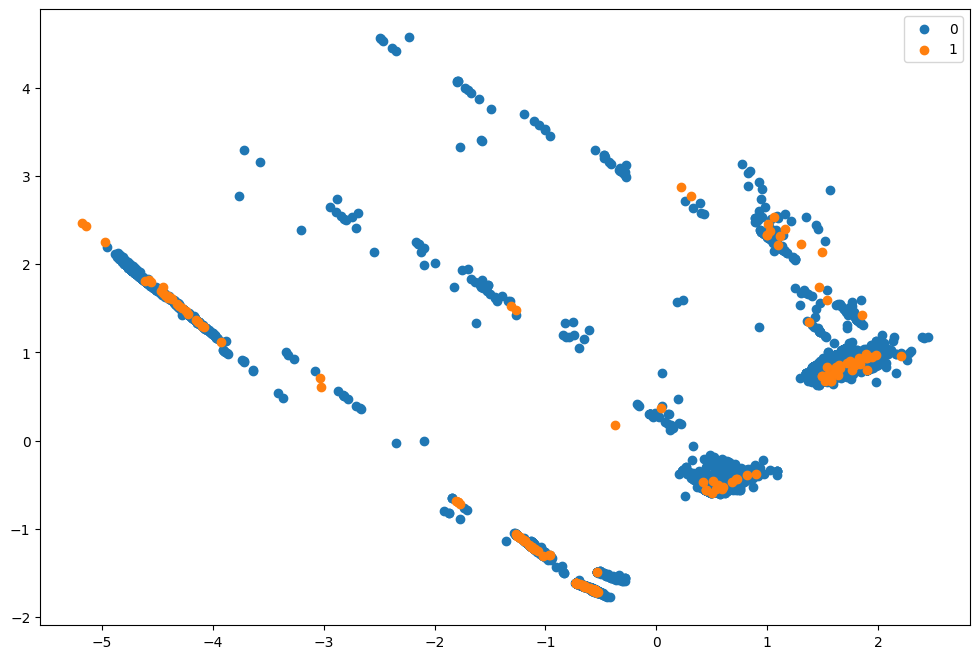

In [82]:
# Plot first 2 PCA features and colour by target variable
plt.figure(figsize=(12, 8));
groups = df.groupby("isFraud")
for name, group in groups:
    plt.scatter(group["PCA_V_0"], group["PCA_V_1"], label=name)
plt.legend()
plt.show()

## 9. Feature Encoding


Encoding is the process of converting data from one form to another. Most of the Machine learning algorithms can not handle categorical values unless we convert them to numerical values. Many algorithm’s performances vary based on how Categorical columns are encoded.
- **Frequency Encoding**  - It is a way to utilize the frequency of the categories as labels. In the cases where the frequency is related somewhat with the target variable, it helps the model to understand and assign the weight in direct and inverse proportion, depending on nature of the data.

Create a list of variables that needs to be encoded using frequency encoding. Let's note down the features which has more than 30 unique values,  We would using frequency encoding for these features only

In [83]:
cat_columns = df.select_dtypes(include=['object']).columns
len(cat_columns)

28

In [84]:
binary_columns = [col for col in df.columns if df[col].nunique() == 2]
len(binary_columns)

386

In [85]:
num_columns = [col for col in df.columns if (col not in cat_columns) & (col not in binary_columns)]
len(num_columns)

80

In [86]:
cat_columns = cat_columns.to_list() + binary_columns

In [87]:
# Frequecny encoding variables
frequency_encoded_variables = []
for col in cat_columns:
    if df[col].nunique() > 30:
        print(col, df[col].nunique())
        frequency_encoded_variables.append(col)

id_33 46
DeviceInfo 131


It's time to encode the variables using frequency encoding

In [88]:
# Frequecny enocde the variables
for variable in tqdm(frequency_encoded_variables):
    # group by frequency
    fq = df.groupby(variable).size()/len(df)
    # mapping values to dataframe
    df.loc[:, "{}".format(variable)] = df[variable].map(fq)
    cat_columns.remove(variable)

100%|██████████| 2/2 [00:00<00:00, 168.52it/s]


In [89]:
df.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,id_12,id_13,id_14,id_15,id_16,id_17,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,card2_missing_flag,card5_missing_flag,addr1_missing_flag,addr2_missing_flag,dist1_missing_flag,dist2_missing_flag,P_emaildomain_missing_flag,R_emaildomain_missing_flag,D2_missing_flag,D3_missing_flag,D4_missing_flag,D5_missing_flag,D6_missing_flag,D7_missing_flag,D8_missing_flag,D9_missing_flag,D10_missing_flag,D11_missing_flag,D12_missing_flag,D13_missing_flag,D14_missing_flag,D15_missing_flag,M1_missing_flag,M2_missing_flag,M3_missing_flag,M4_missing_flag,M5_missing_flag,M6_missing_flag,M7_missing_flag,M8_missing_flag,M9_missing_flag,V1_missing_flag,V2_missing_flag,V3_missing_flag,V4_missing_flag,V5_missing_flag,V6_missing_flag,V7_missing_flag,V8_missing_flag,V9_missing_flag,V10_missing_flag,V11_missing_flag,V12_missing_flag,V13_missing_flag,V14_missing_flag,V15_missing_flag,V16_missing_flag,V17_missing_flag,V18_missing_flag,V19_missing_flag,V20_missing_flag,V21_missing_flag,V22_missing_flag,V23_missing_flag,V24_missing_flag,V25_missing_flag,V26_missing_flag,V27_missing_flag,V28_missing_flag,V29_missing_flag,V30_missing_flag,V31_missing_flag,V32_missing_flag,V33_missing_flag,V34_missing_flag,V35_missing_flag,V36_missing_flag,V37_missing_flag,V38_missing_flag,V39_missing_flag,V40_missing_flag,V41_missing_flag,V42_missing_flag,V43_missing_flag,V44_missing_flag,V45_missing_flag,V46_missing_flag,V47_missing_flag,V48_missing_flag,V49_missing_flag,V50_missing_flag,V51_missing_flag,V52_missing_flag,V53_missing_flag,V54_missing_flag,V55_missing_flag,V56_missing_flag,V57_missing_flag,V58_missing_flag,V59_missing_flag,V60_missing_flag,V61_missing_flag,V62_missing_flag,V63_missing_flag,V64_missing_flag,V65_missing_flag,V66_missing_flag,V67_missing_flag,V68_missing_flag,V69_missing_flag,V70_missing_flag,V71_missing_flag,V72_missing_flag,V73_missing_flag,V74_missing_flag,V75_missing_flag,V76_missing_flag,V77_missing_flag,V78_missing_flag,V79_missing_flag,V80_missing_flag,V81_missing_flag,V82_missing_flag,V83_missing_flag,V84_missing_flag,V85_missing_flag,V86_missing_flag,V87_missing_flag,V88_missing_flag,V89_missing_flag,V90_missing_flag,V91_missing_flag,V92_missing_flag,V93_missing_flag,V94_missing_flag,V138_missing_flag,V139_missing_flag,V140_missing_flag,V141_missing_flag,V142_missing_flag,V143_missing_flag,V144_missing_flag,V145_missing_flag,V146_missing_flag,V147_missing_flag,V148_missing_flag,V149_missing_flag,V150_missing_flag,V151_missing_flag,V152_missing_flag,V153_missing_flag,V154_missing_flag,V155_missing_flag,V156_missing_flag,V157_missing_flag,V158_missing_flag,V159_missing_flag,V160_missing_flag,V161_missing_flag,V162_missing_flag,V163_missing_flag,V164_missing_flag,V165_missing_flag,V166_missing_flag,V167_missing_flag,V168_missing_flag,V169_missing_flag,V170_missing_flag,V171_missing_flag,V172_missing_flag,V173_missing_flag,V174_missing_flag,V175_missing_flag,V176_missing_flag,V177_missing_flag,V178_missing_flag,V179_missing_flag,V180_missing_flag,V181_missing_flag,V182_missing_flag,V183_missing_flag,V184_missing_flag,V185_missing_flag,V186_missing_flag,V187_missing_flag,V188_missing_flag,V189_missing_flag,V190_missing_flag,V191_missing_flag,V192_missing_flag,V193_missing_flag,V194_missing_flag,V195_missing_flag,V196_missing_flag,V197_missing_flag,V198_missing_flag,V199_missing_flag,V200_missing_flag,V201_missing_flag,V202_missing_flag,V203_missing_flag,V204_missing_flag,V205_missing_flag,V206_missing_flag,V207_missing_flag,V208_missing_flag,V209_missing_flag,V210_missing_flag,V211_missing_flag,V212_missing_flag,V213_missing_flag,V214_missing_flag,V215_missing_flag,V216_missing_flag,V217_missing_flag,V218_missing_flag,V219_missing

- **Label encoding** - Label Encoding refers to converting the labels into numeric form so as to convert it into the machine-readable form. Machine learning algorithms can then decide in a better way on how those labels must be operated. It is an important pre-processing step for the structured dataset in supervised learning.

It is a popular encoding technique for handling categorical variables. In this technique, each label is assigned a unique integer based on alphabetical ordering.


In [90]:
# Label encode the variables
for col in cat_columns:
    lbl        = LabelEncoder()
    lbl.fit(list(df[col].values))
    df[col] = lbl.transform(list(df[col].values))

Let's reduce the memory usage as lot of new columns has been added to the data frame

In [91]:
# Reduce memory usage
df = reduce_mem_usage(df)

Mem. usage decreased to  4.19 Mb (81.4% reduction)


**Tip : Save the train df, and clean all memory**

In [92]:
import os
os.makedirs('Intermediate_Datasets', exist_ok=True)
# Save train df to csv file
df.to_csv("Intermediate_Datasets/df_intermediate2.csv", index = False)

## 10. Data Preprocessing for Model Building


The goal of this section is to:
- Clean up columns
- Create X and y
- Split the dataset in training and test sets

In [93]:
# Read train df
df = pd.read_csv("Intermediate_Datasets/df_intermediate2.csv")
# df = df.sample(10000, random_state=0)

In [94]:
df.loc[:, 'isFraud'].value_counts()

,count
isFraud,
0,6719
1,169


Drop the columns which may not be useful for model building

In [95]:
df = df.drop(['TransactionID','TransactionDT','Date'], axis=1)

Separate the x variables and y variables

In [96]:
import pandas as pd
import gc
# Read train df
df = pd.read_csv("Intermediate_Datasets/df_intermediate2.csv")
# Split the y variable series and x variables dataset
X = df.drop(['isFraud'],axis=1)
y = df.isFraud.astype(bool)

# Collect garbage
gc.collect()

3805

Split the dataset into train set and test set. Train set will be used to train the model. Test set will be used to check the performance of model

In [97]:
# Split the dataset into the training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [98]:
# Head of X_train
X_train.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,id_12,id_13,id_14,id_15,id_16,id_17,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,card2_missing_flag,card5_missing_flag,addr1_missing_flag,addr2_missing_flag,dist1_missing_flag,dist2_missing_flag,P_emaildomain_missing_flag,R_emaildomain_missing_flag,D2_missing_flag,D3_missing_flag,D4_missing_flag,D5_missing_flag,D6_missing_flag,D7_missing_flag,D8_missing_flag,D9_missing_flag,D10_missing_flag,D11_missing_flag,D12_missing_flag,D13_missing_flag,D14_missing_flag,D15_missing_flag,M1_missing_flag,M2_missing_flag,M3_missing_flag,M4_missing_flag,M5_missing_flag,M6_missing_flag,M7_missing_flag,M8_missing_flag,M9_missing_flag,V1_missing_flag,V2_missing_flag,V3_missing_flag,V4_missing_flag,V5_missing_flag,V6_missing_flag,V7_missing_flag,V8_missing_flag,V9_missing_flag,V10_missing_flag,V11_missing_flag,V12_missing_flag,V13_missing_flag,V14_missing_flag,V15_missing_flag,V16_missing_flag,V17_missing_flag,V18_missing_flag,V19_missing_flag,V20_missing_flag,V21_missing_flag,V22_missing_flag,V23_missing_flag,V24_missing_flag,V25_missing_flag,V26_missing_flag,V27_missing_flag,V28_missing_flag,V29_missing_flag,V30_missing_flag,V31_missing_flag,V32_missing_flag,V33_missing_flag,V34_missing_flag,V35_missing_flag,V36_missing_flag,V37_missing_flag,V38_missing_flag,V39_missing_flag,V40_missing_flag,V41_missing_flag,V42_missing_flag,V43_missing_flag,V44_missing_flag,V45_missing_flag,V46_missing_flag,V47_missing_flag,V48_missing_flag,V49_missing_flag,V50_missing_flag,V51_missing_flag,V52_missing_flag,V53_missing_flag,V54_missing_flag,V55_missing_flag,V56_missing_flag,V57_missing_flag,V58_missing_flag,V59_missing_flag,V60_missing_flag,V61_missing_flag,V62_missing_flag,V63_missing_flag,V64_missing_flag,V65_missing_flag,V66_missing_flag,V67_missing_flag,V68_missing_flag,V69_missing_flag,V70_missing_flag,V71_missing_flag,V72_missing_flag,V73_missing_flag,V74_missing_flag,V75_missing_flag,V76_missing_flag,V77_missing_flag,V78_missing_flag,V79_missing_flag,V80_missing_flag,V81_missing_flag,V82_missing_flag,V83_missing_flag,V84_missing_flag,V85_missing_flag,V86_missing_flag,V87_missing_flag,V88_missing_flag,V89_missing_flag,V90_missing_flag,V91_missing_flag,V92_missing_flag,V93_missing_flag,V94_missing_flag,V138_missing_flag,V139_missing_flag,V140_missing_flag,V141_missing_flag,V142_missing_flag,V143_missing_flag,V144_missing_flag,V145_missing_flag,V146_missing_flag,V147_missing_flag,V148_missing_flag,V149_missing_flag,V150_missing_flag,V151_missing_flag,V152_missing_flag,V153_missing_flag,V154_missing_flag,V155_missing_flag,V156_missing_flag,V157_missing_flag,V158_missing_flag,V159_missing_flag,V160_missing_flag,V161_missing_flag,V162_missing_flag,V163_missing_flag,V164_missing_flag,V165_missing_flag,V166_missing_flag,V167_missing_flag,V168_missing_flag,V169_missing_flag,V170_missing_flag,V171_missing_flag,V172_missing_flag,V173_missing_flag,V174_missing_flag,V175_missing_flag,V176_missing_flag,V177_missing_flag,V178_missing_flag,V179_missing_flag,V180_missing_flag,V181_missing_flag,V182_missing_flag,V183_missing_flag,V184_missing_flag,V185_missing_flag,V186_missing_flag,V187_missing_flag,V188_missing_flag,V189_missing_flag,V190_missing_flag,V191_missing_flag,V192_missing_flag,V193_missing_flag,V194_missing_flag,V195_missing_flag,V196_missing_flag,V197_missing_flag,V198_missing_flag,V199_missing_flag,V200_missing_flag,V201_missing_flag,V202_missing_flag,V203_missing_flag,V204_missing_flag,V205_missing_flag,V206_missing_flag,V207_missing_flag,V208_missing_flag,V209_missing_flag,V210_missing_flag,V211_missing_flag,V212_missing_flag,V213_missing_flag,V214_missing_flag,V215_missing_flag,V216_missing_flag,V217_missing_flag,V218_missing_flag,V219_missing_flag,V2

## 11. Model Building

Finally, model building starts here.

The goal of this section is to:
- Build ML models
- Evaluate the performance

## Start building the ML models

Let's start with XGBoost first

## 12. XGBoost Classifier

XGBoost is an optimized distributed gradient boosting model designed to be highly efficient, flexible and portable. It implements machine learning algorithms under the Gradient Boosting framework. XGBoost provides a parallel tree boosting (also known as GBDT, GBM) that solve many data science problems in a fast and accurate way.

In [99]:
%%time
# Replace inf values with NaN
X_train.replace([np.inf, -np.inf], np.nan, inplace=True)
X_train = X_train.drop('Date', axis=1)

# Define the model
xgb = XGBClassifier(nthread = -1, random_state=0, missing=np.nan)

# Train the model
xgb.fit(X_train, y_train)

xgb

CPU times: user 2.72 s, sys: 38.1 ms, total: 2.76 s
Wall time: 1.61 s


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, nthread=-1, ...)

Let's use the model to get predictions on test dataset. We would be looking at the predicted class and predicted probability both in order to evaluate the performance of the model

In [100]:
# Prediction
X_test = X_test.drop('Date', axis=1)
y_pred_xgb = xgb.predict(X_test)
y_prob_pred_xgb = xgb.predict_proba(X_test)
y_prob_pred_xgb = [x[1] for x in y_prob_pred_xgb]
print("Y predicted : ",y_pred_xgb)
print("Y probability predicted : ",y_prob_pred_xgb[:5])

Y predicted :  [0 0 0 ... 0 0 0]
Y probability predicted :  [np.float32(0.00028751147), np.float32(7.906948e-06), np.float32(1.27315725e-05), np.float32(8.6201726e-05), np.float32(8.516186e-06)]


## 13. Evaluation Metrics

- Accuracy Score
- Confusion Matrix
- Classification Report
- AUC Score
- Concordance Index
- ROC curve
- PR curve

Concordance

In [101]:
from bisect import bisect_left, bisect_right

def concordance(actuals, preds):
    ones_preds  = [p for a,p in zip(actuals, preds) if a == 1]
    zeros_preds = [p for a,p in zip(actuals, preds) if a == 0]
    n_ones      = len([x for x in actuals if x == 1])
    n_total_pairs =  float(n_ones) * float(len(actuals) - n_ones)
    # print("Total Pairs: ", n_total_pairs)

    zeros_sorted = sorted(zeros_preds)

    conc = 0; disc = 0; ties = 0;
    for i, one_pred in enumerate(ones_preds):
        cur_conc = bisect_left(zeros_sorted, one_pred)
        cur_ties = bisect_right(zeros_sorted, one_pred) - cur_conc
        conc += cur_conc
        ties += cur_ties
        disc += float(len(zeros_sorted)) - cur_ties - cur_conc

    concordance = conc/n_total_pairs
    discordance = disc/n_total_pairs
    ties_perc = ties/n_total_pairs
    return concordance

All evaluation metrics

In [102]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, classification_report, RocCurveDisplay, PrecisionRecallDisplay
def compute_evaluation_metric(model, x_test, y_actual, y_predicted, y_predicted_prob):
    print("\n Accuracy Score : ",accuracy_score(y_actual,y_predicted))
    print("\n AUC Score : ", roc_auc_score(y_actual, y_predicted_prob))
    print("\n Confusion Matrix : \n",confusion_matrix(y_actual, y_predicted))
    print("\n Classification Report : \n",classification_report(y_actual, y_predicted))
    print("\n Concordance Index : ", concordance(y_actual, y_predicted_prob))

    print("\n ROC curve : \n")
    RocCurveDisplay.from_estimator(model, x_test, y_actual)
    plt.show()

    print("\n PR curve : \n")
    PrecisionRecallDisplay.from_estimator(model, x_test, y_actual)
    plt.show()

In [103]:
import numpy as np
from xgboost import XGBClassifier
# Replace inf values with NaN
X_train.replace([np.inf, -np.inf], np.nan, inplace=True)
# Define the model
xgb = XGBClassifier(nthread = -1, random_state=0, missing=np.nan)
# Train the model
xgb.fit(X_train, y_train)

# Prediction
y_pred_xgb = xgb.predict(X_test)
y_prob_pred_xgb = xgb.predict_proba(X_test)[:, 1]

concordance(y_test.values, y_prob_pred_xgb)

0.8580086433925316


 Accuracy Score :  0.9782293178519593

 AUC Score :  0.8580086433925316

 Confusion Matrix : 
 [[2008    0]
 [  45   14]]

 Classification Report : 
               precision    recall  f1-score   support

       False       0.98      1.00      0.99      2008
        True       1.00      0.24      0.38        59

    accuracy                           0.98      2067
   macro avg       0.99      0.62      0.69      2067
weighted avg       0.98      0.98      0.97      2067


 Concordance Index :  0.8580086433925316

 ROC curve : 



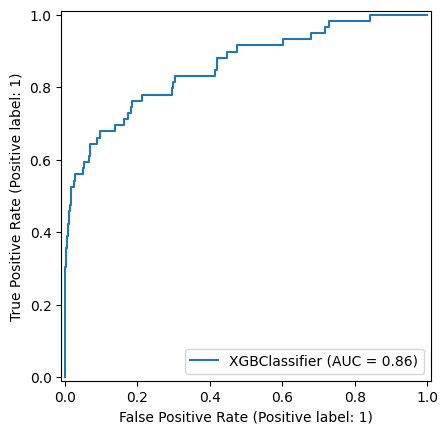


 PR curve : 



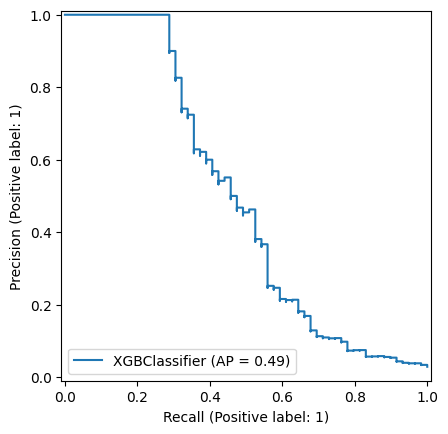

In [104]:
# Compute Evaluation Metric
compute_evaluation_metric(xgb, X_test, y_test, y_pred_xgb, y_prob_pred_xgb)

## 14. Capture Rates and Calibration Curve


Divide the data in 10 equal bins as per predicted probability scores. Then, compute the percentage of the total target class 1 captured in every bin.

Ideally the proportion should be decreasing as we go down ever bin.
Let's check it out

#### Create validation set

In [105]:
# Create Validation set
validation_df = {'y_test' : y_test, 'y_pred' : y_pred_xgb, 'y_pred_prob' : y_prob_pred_xgb}
validation_df = pd.DataFrame(data = validation_df)

# Add binning column to the dataframe
validation_df['bin_y_pred_prob'] = pd.qcut(validation_df['y_pred_prob'], q=10)
validation_df.head()

,y_test,y_pred,y_pred_prob,bin_y_pred_prob
4240,False,0,0.000288,"(0.000173, 0.000299]"
4425,False,0,0.000008,"(-0.000999043, 1.54e-05]"
3690,False,0,0.000013,"(-0.000999043, 1.54e-05]"
4441,False,0,0.000086,"(6.29e-05, 0.000108]"
4367,False,0,0.000009,"(-0.000999043, 1.54e-05]"


In [106]:
# Change x label
x_label = []
for i in range(len(validation_df['bin_y_pred_prob'].cat.categories[::-1].astype('str'))):
    x_label.append("Bin" + str(i + 1)+ "(" + validation_df['bin_y_pred_prob'].cat.categories[::-1].astype('str')[i] + ")")

#### Capture Rates Plot

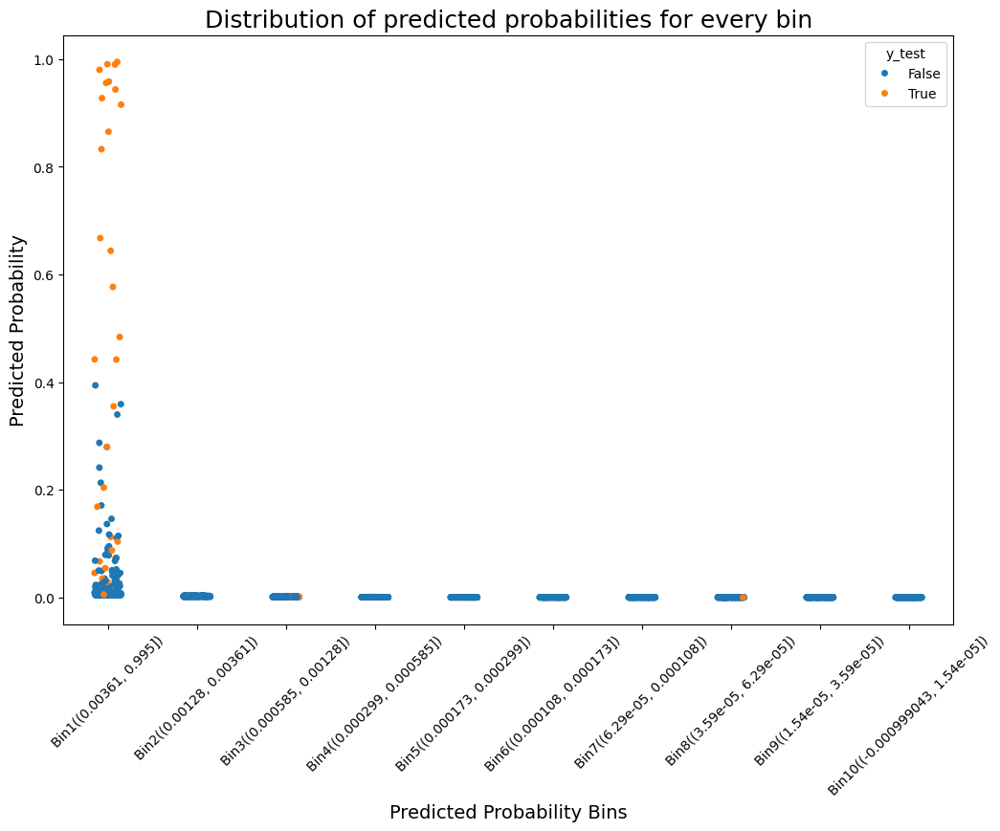

In [107]:
# Plot Distribution of predicted probabilities for every bin
plt.figure(figsize=(12, 8));
sns.stripplot(x=validation_df.bin_y_pred_prob, y=validation_df.y_pred_prob, jitter = 0.15, hue = validation_df.y_test, order = validation_df['bin_y_pred_prob'].cat.categories[::-1])
plt.title("Distribution of predicted probabilities for every bin", fontsize=18)
plt.xlabel("Predicted Probability Bins", fontsize=14);
plt.ylabel("Predicted Probability", fontsize=14);
plt.xticks(np.arange(10), x_label, rotation=45);
plt.show()

#### Gains Table

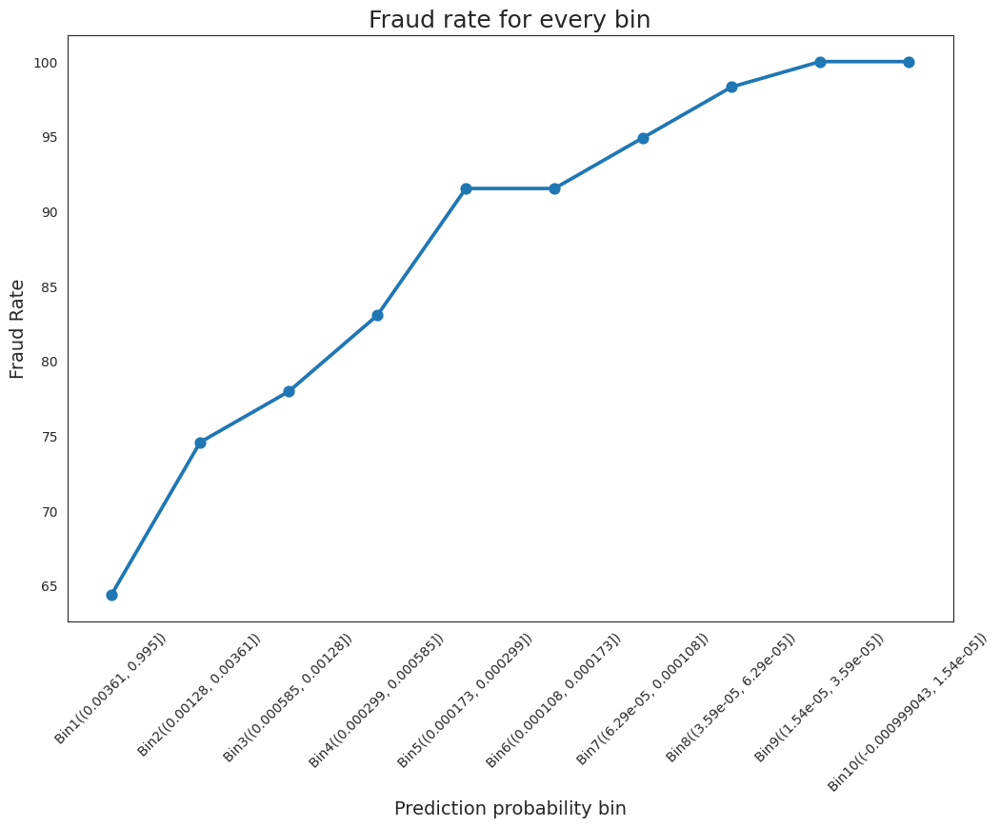

In [108]:
# Aggregate the data
gains_df             = validation_df.groupby(["bin_y_pred_prob","y_test"]).agg({'y_test': ['count']})
gains_df.columns     = gains_df.columns.map(''.join)
gains_df['prob_bin'] = gains_df.index.get_level_values(0)
gains_df['y_test']   = gains_df.index.get_level_values(1)
gains_df.reset_index(drop = True, inplace = True)
gains_df

# Get infection rate and percentage infections
gains_table = gains_df.pivot(index='prob_bin', columns='y_test', values='y_testcount')
gains_table['prob_bin'] = gains_table.index
gains_table = gains_table.iloc[::-1]
gains_table['prob_bin'] = x_label
gains_table.reset_index(drop = True, inplace = True)
gains_table = gains_table[['prob_bin', 0, 1]]
gains_table.columns = ['prob_bin', "not_fraud", "fraud"]
gains_table['perc_fraud'] = gains_table['fraud']/gains_table['fraud'].sum()
gains_table['perc_not_fraud'] = gains_table['not_fraud']/gains_table['not_fraud'].sum()
gains_table['cum_perc_fraud'] = 100*(gains_table.fraud.cumsum() / gains_table.fraud.sum())
gains_table['cum_perc_not_fraud'] = 100*(gains_table.not_fraud.cumsum() / gains_table.not_fraud.sum())
gains_table


# Plot
plt.figure(figsize=(12, 8));
sns.set_style("white")
sns.pointplot(x = "prob_bin", y = "cum_perc_fraud", data = gains_table, legend = False, order=gains_table.prob_bin)
plt.xticks(rotation=45);
plt.ylabel("Fraud Rate", fontsize=14)
plt.xlabel("Prediction probability bin", fontsize=14)
plt.title("Fraud rate for every bin", fontsize=18)
plt.show()

Ideally the slope should be high initially and should decrease as we move further to the right. This is not really a good model.

In [109]:
# One big function.
def captures(y_test, y_pred, y_pred_prob):
    # Create Validation set
    validation_df = {'y_test' : y_test, 'y_pred' : y_pred, 'y_pred_prob' : y_pred_prob}
    validation_df = pd.DataFrame(data = validation_df)

    # Add binning column to the dataframe
    try:
        validation_df['bin_y_pred_prob'] = pd.qcut(validation_df['y_pred_prob'], q=10)
    except:
        validation_df['bin_y_pred_prob'] = pd.qcut(validation_df['y_pred_prob'], q=10, duplicates='drop')

    # Change x label and column names
    x_label = []
    for i in range(len(validation_df['bin_y_pred_prob'].cat.categories[::-1].astype('str'))):
        x_label.append("Bin" + str(i + 1)+ "(" + validation_df['bin_y_pred_prob'].cat.categories[::-1].astype('str')[i] + ")")

    # Plot Distribution of predicted probabilities for every bin
    plt.figure(figsize=(12, 8));
    sns.stripplot(x=validation_df.bin_y_pred_prob, y=validation_df.y_pred_prob, jitter = 0.15, hue = validation_df.y_test, order = validation_df['bin_y_pred_prob'].cat.categories[::-1])
    plt.title("Distribution of predicted probabilities for every bin", fontsize=18)
    plt.xlabel("Predicted Probability Bins", fontsize=14);
    plt.ylabel("Predicted Probability", fontsize=14);
    try:
        plt.xticks(np.arange(10), x_label, rotation=45);
    except:
        pass
    plt.show()

    # Aggregate the data
    gains_df             = validation_df.groupby(["bin_y_pred_prob","y_test"]).agg({'y_test': ['count']})
    gains_df.columns     = gains_df.columns.map(''.join)
    gains_df['prob_bin'] = gains_df.index.get_level_values(0)
    gains_df['y_test']   = gains_df.index.get_level_values(1)
    gains_df.reset_index(drop = True, inplace = True)
    gains_df

    # Get infection rate and percentage infections
    gains_table = gains_df.pivot(index='prob_bin', columns='y_test', values='y_testcount')
    gains_table['prob_bin'] = gains_table.index
    gains_table = gains_table.iloc[::-1]
    gains_table['prob_bin'] = x_label
    gains_table.reset_index(drop = True, inplace = True)
    gains_table = gains_table[['prob_bin', 0, 1]]
    gains_table.columns = ['prob_bin', "not_fraud", "fraud"]
    gains_table['perc_fraud'] = gains_table['fraud']/gains_table['fraud'].sum()
    gains_table['perc_not_fraud'] = gains_table['not_fraud']/gains_table['not_fraud'].sum()
    gains_table['cum_perc_fraud'] = 100*(gains_table.fraud.cumsum() / gains_table.fraud.sum())
    gains_table['cum_perc_not_fraud'] = 100*(gains_table.not_fraud.cumsum() / gains_table.not_fraud.sum())
    gains_table


    # Plot
    plt.figure(figsize=(12, 8));
    sns.set_style("white")
    sns.pointplot(x = "prob_bin", y = "cum_perc_fraud", data = gains_table, legend = False, order=gains_table.prob_bin)
    plt.xticks(rotation=45);
    plt.ylabel("Fraud Rate", fontsize=14)
    plt.xlabel("Prediction probability bin", fontsize=14)
    plt.title("Fraud rate for every bin", fontsize=18)
    plt.show()
    return gains_table

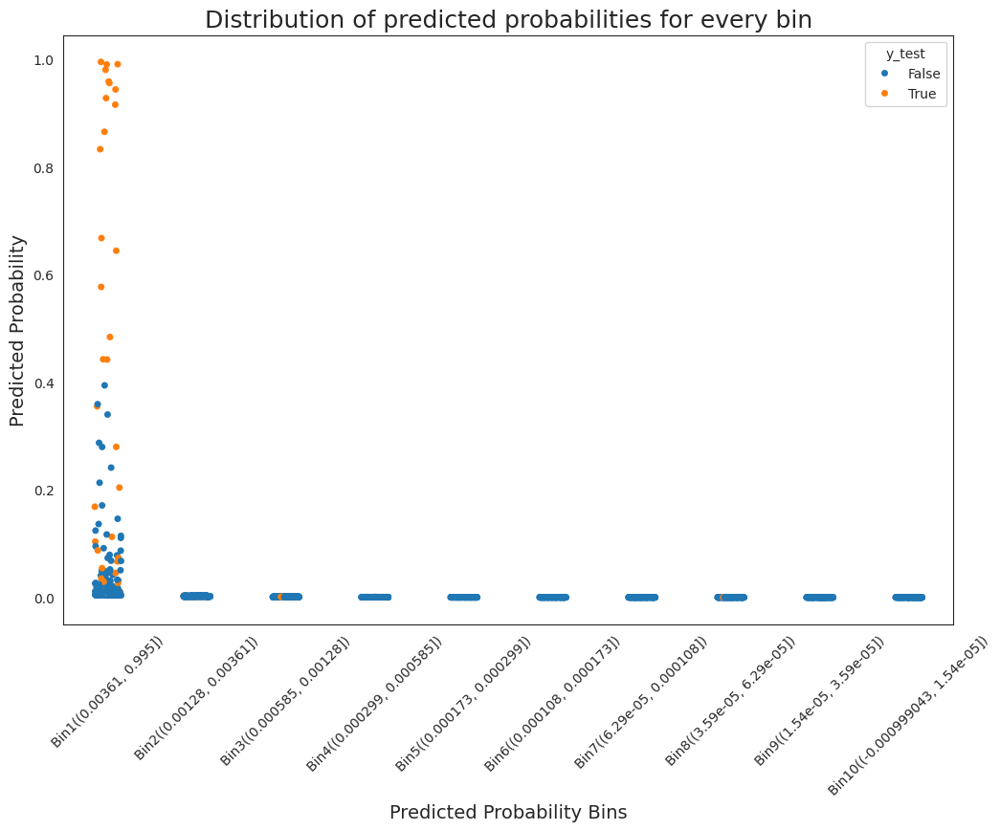

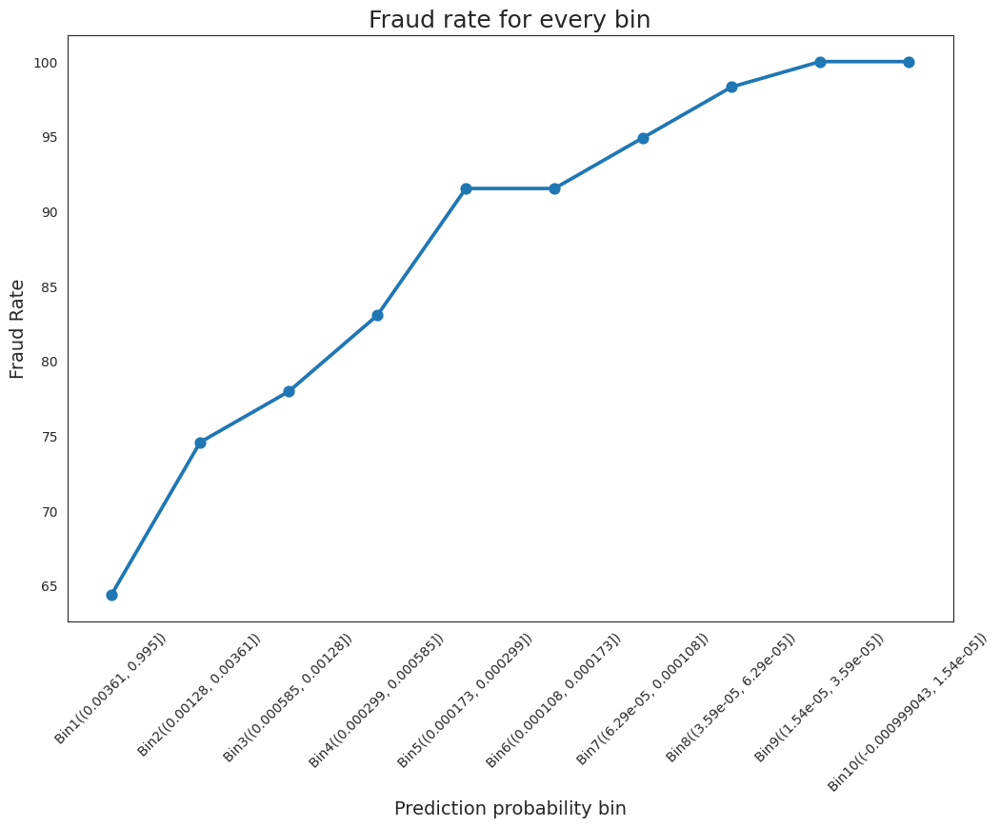

,prob_bin,not_fraud,fraud,perc_fraud,perc_not_fraud,cum_perc_fraud,cum_perc_not_fraud
0,"Bin1((0.00361, 0.995])",169,38,0.644068,0.084163,64.406780,8.416335
1,"Bin2((0.00128, 0.00361])",201,6,0.101695,0.100100,74.576271,18.426295
2,"Bin3((0.000585, 0.00128])",204,2,0.033898,0.101594,77.966102,28.585657
3,"Bin4((0.000299, 0.000585])",204,3,0.050847,0.101594,83.050847,38.745020
4,"Bin5((0.000173, 0.000299])",201,5,0.084746,0.100100,91.525424,48.754980
5,"Bin6((0.000108, 0.000173])",207,0,0.000000,0.103088,91.525424,59.063745
6,"Bin7((6.29e-05, 0.000108])",205,2,0.033898,0.102092,94.915254,69.272908
7,"Bin8((3.59e-05, 6.29e-05])",204,2,0.033898,0.101594,98.305085,79.432271
8,"Bin9((1.54e-05, 3.59e-05])",206,1,0.016949,0.102590,100.000000,89.691235
9,"Bin10((-0.000999043, 1.54e-05])",207,0,0.000000,0.103088,100.000000,100.000000


In [110]:
# Gains Table and Capture rates plot
captures(y_test, y_pred_xgb, y_prob_pred_xgb)

## Calibration Curve

In [111]:
from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt

In [112]:
def draw_calibration_curve(y_test, y_prob, n_bins=10):
    plt.figure(figsize=(7, 7), dpi=120)
    ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
    ax2 = plt.subplot2grid((3, 1), (2, 0))
    ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")


    fraction_of_positives, mean_predicted_value = calibration_curve(y_test, y_prob, n_bins=10)

    ax1.plot(mean_predicted_value, fraction_of_positives, "s-", label="%s" % ("Model", ))
    ax2.hist(y_prob, range=(0, 1), bins=10, label="Model", histtype="step", lw=2)

    # Labels
    ax1.set_ylabel("Fraction of positives")
    ax1.set_ylim([-0.05, 1.05])
    ax1.legend(loc="lower right")
    ax1.set_title('Calibration plots  (reliability curve)')

    ax2.set_xlabel("Mean predicted value")
    ax2.set_ylabel("Count")
    ax2.legend(loc="upper center", ncol=2)

    plt.tight_layout()
    plt.show()

- __Chart 1:__ X axis marks the prediction probability score. Y-axis marks the fraction of the positives.
- __Chart 2:__ X axis marks the mean predicted value. Y-axis represents the count of records.

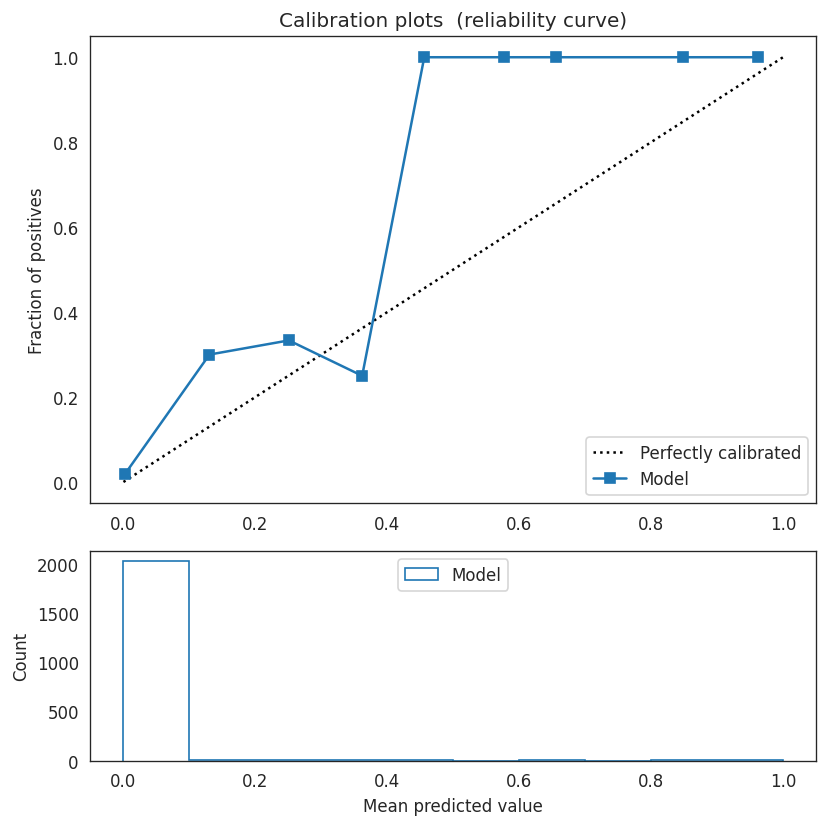

In [113]:
draw_calibration_curve(y_test, y_prob_pred_xgb, n_bins=10)

## Calibrate the model

Logistic regression

In [114]:
# Prediction
y_pred_xgb_test = xgb.predict(X_test)
y_prob_pred_xgb_test = xgb.predict_proba(X_test)[:, 1]

In [115]:
from sklearn.linear_model import LogisticRegression
X = np.array(y_prob_pred_xgb_test)
clf = LogisticRegression(random_state=0).fit(X.reshape(-1, 1), y_test)

In [116]:
y_prob_pred_calib = clf.predict_proba(X.reshape(-1, 1))[:, 1]
y_pred_calib      = clf.predict(X.reshape(-1, 1))

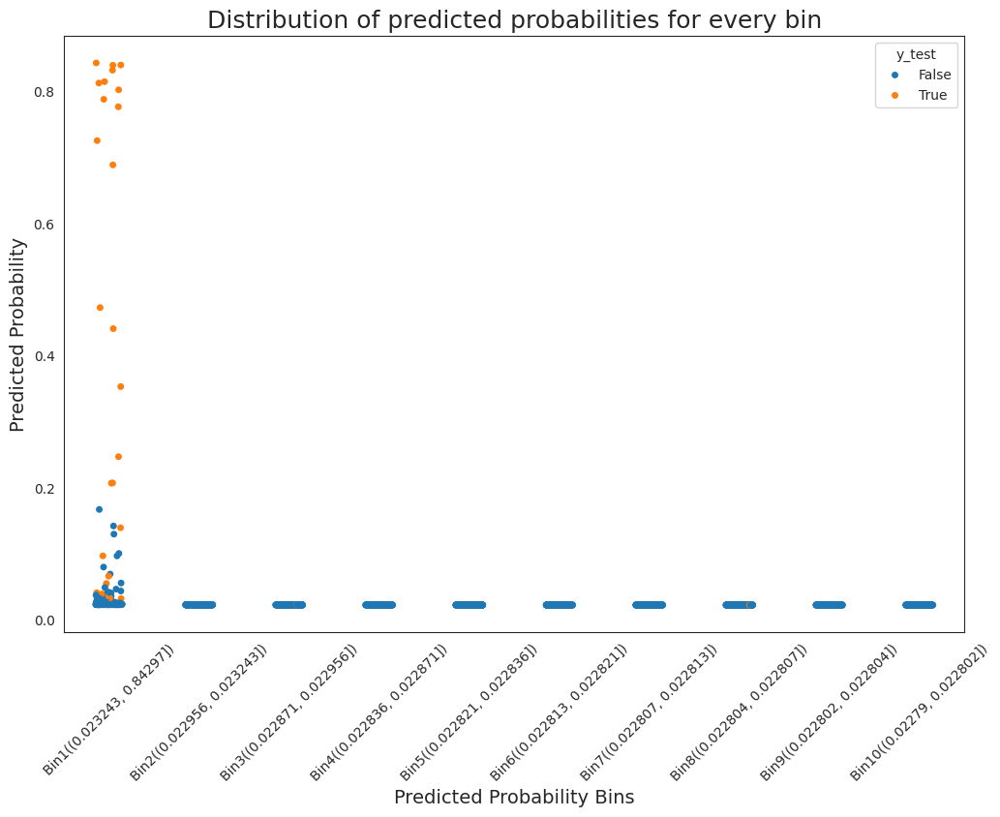

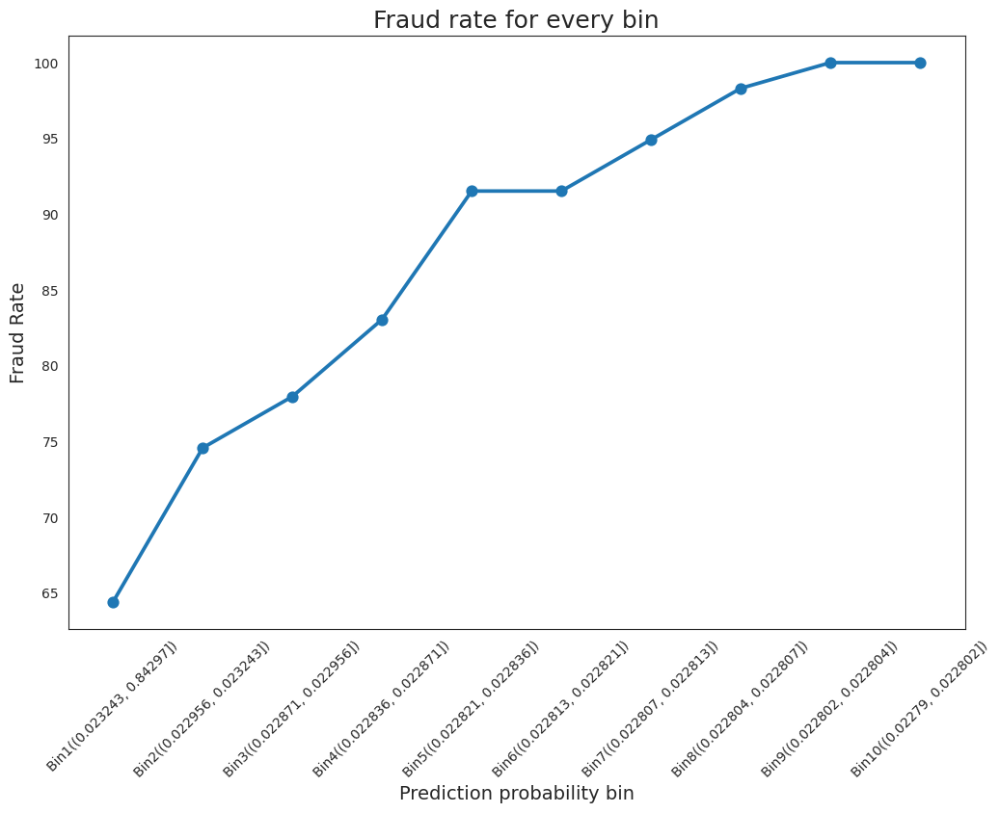

,prob_bin,not_fraud,fraud,perc_fraud,perc_not_fraud,cum_perc_fraud,cum_perc_not_fraud
0,"Bin1((0.023243, 0.84297])",169,38,0.644068,0.084163,64.406780,8.416335
1,"Bin2((0.022956, 0.023243])",201,6,0.101695,0.100100,74.576271,18.426295
2,"Bin3((0.022871, 0.022956])",204,2,0.033898,0.101594,77.966102,28.585657
3,"Bin4((0.022836, 0.022871])",204,3,0.050847,0.101594,83.050847,38.745020
4,"Bin5((0.022821, 0.022836])",201,5,0.084746,0.100100,91.525424,48.754980
5,"Bin6((0.022813, 0.022821])",207,0,0.000000,0.103088,91.525424,59.063745
6,"Bin7((0.022807, 0.022813])",205,2,0.033898,0.102092,94.915254,69.272908
7,"Bin8((0.022804, 0.022807])",204,2,0.033898,0.101594,98.305085,79.432271
8,"Bin9((0.022802, 0.022804])",206,1,0.016949,0.102590,100.000000,89.691235
9,"Bin10((0.02279, 0.022802])",207,0,0.000000,0.103088,100.000000,100.000000


In [117]:
captures(y_test, y_pred_calib, y_prob_pred_calib)

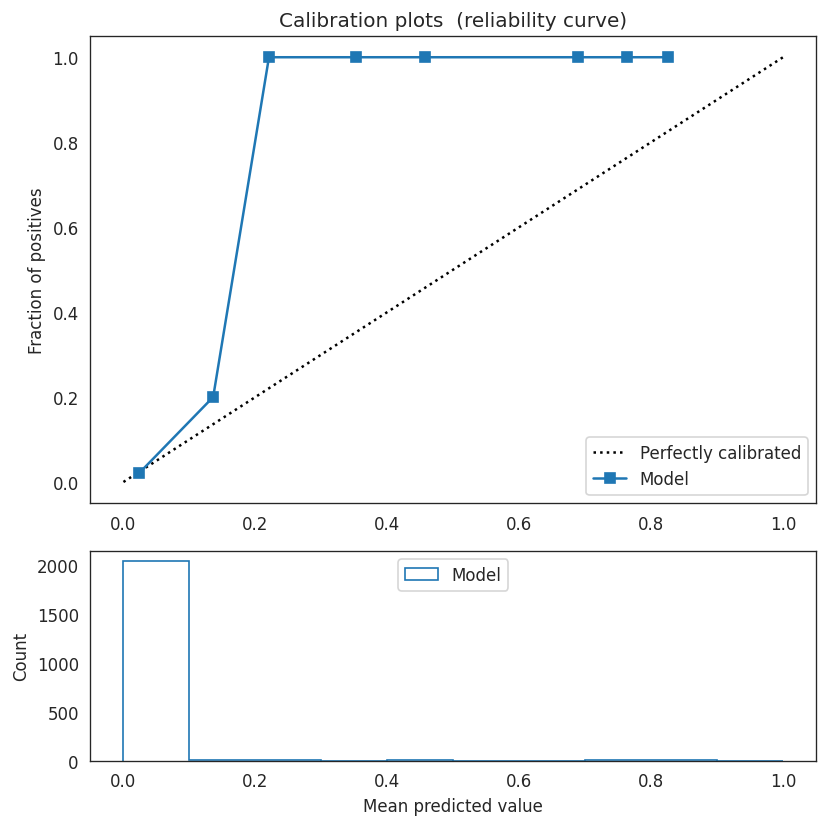

In [118]:
draw_calibration_curve(y_test, y_prob_pred_calib, n_bins=10)

### XGBoost with booster = dart

In [119]:
%%time
# Define the model
xgb = XGBClassifier(nthread=-1, random_state=0, booster="dart")

# Train the model
xgb.fit(X_train,y_train)

xgb

CPU times: user 5min 42s, sys: 604 ms, total: 5min 43s
Wall time: 3min 19s


XGBClassifier(base_score=None, booster='dart', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, nthread=-1, ...)

Let's use the model to get predictions on test dataset. We would be looking at the predicted class and predicted probability both in order to evaluate the performance of the model

#### Prediction

In [120]:
# Prediction
y_pred_xgbdart      = xgb.predict(X_test)
y_prob_pred_xgbdart = xgb.predict_proba(X_test)[:, 1]
print("Y predicted : ", y_pred_xgbdart)
print("Y probability predicted : ", y_prob_pred_xgbdart[:5])

Y predicted :  [0 0 0 ... 0 0 0]
Y probability predicted :  [2.8751121e-04 7.9069632e-06 1.2731597e-05 8.6201806e-05 8.5162110e-06]


#### Evaluation Metrices

Let's compute various evaluation metrices now
- Accuracy Score
- Confusion Matrix
- Classification Report
- AUC Score
- Concodense Index
- ROC curve
- PR curve


 Accuracy Score :  0.9782293178519593

 AUC Score :  0.8580086433925316

 Confusion Matrix : 
 [[2008    0]
 [  45   14]]

 Classification Report : 
               precision    recall  f1-score   support

       False       0.98      1.00      0.99      2008
        True       1.00      0.24      0.38        59

    accuracy                           0.98      2067
   macro avg       0.99      0.62      0.69      2067
weighted avg       0.98      0.98      0.97      2067


 Concordance Index :  0.8580086433925316

 ROC curve : 



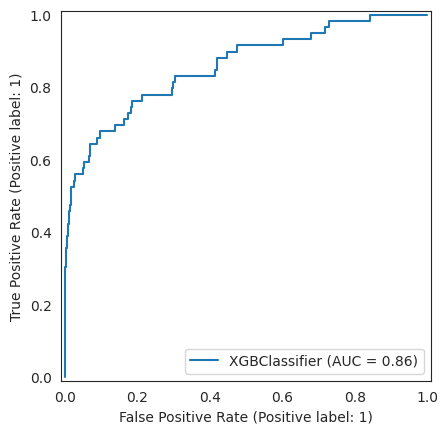


 PR curve : 



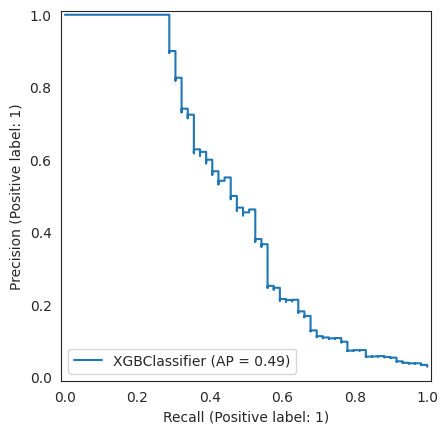

In [121]:
# Compute Evaluation Metric
compute_evaluation_metric(xgb, X_test, y_test, y_pred_xgbdart, y_prob_pred_xgbdart)

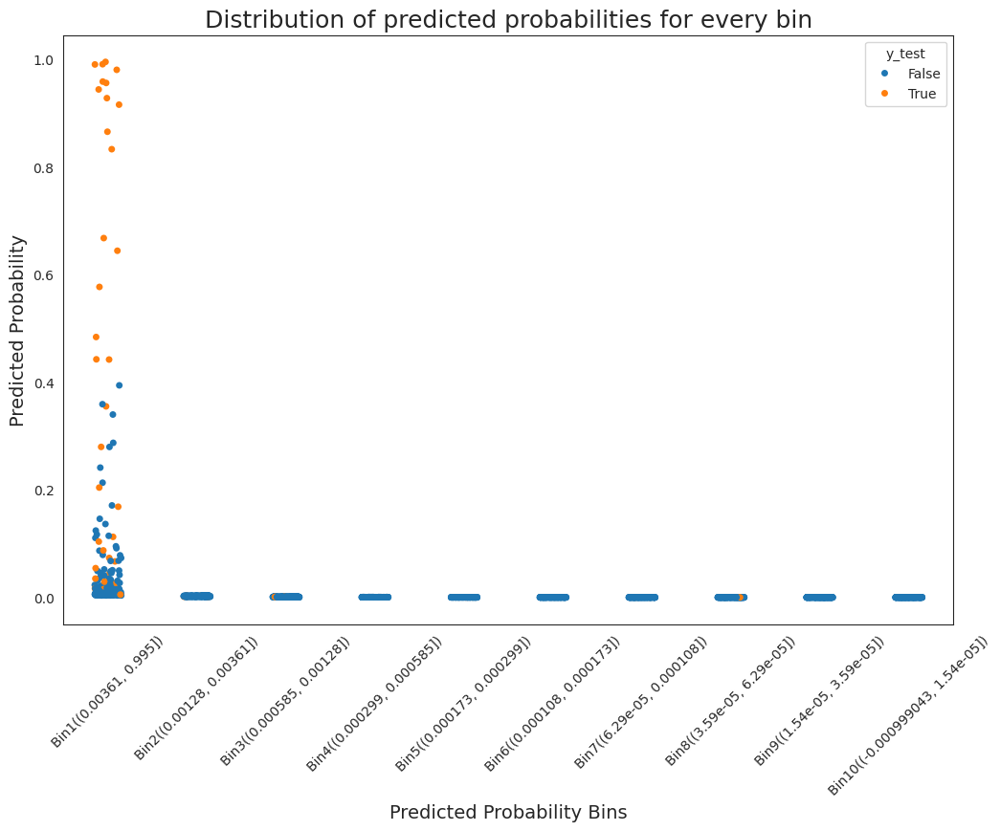

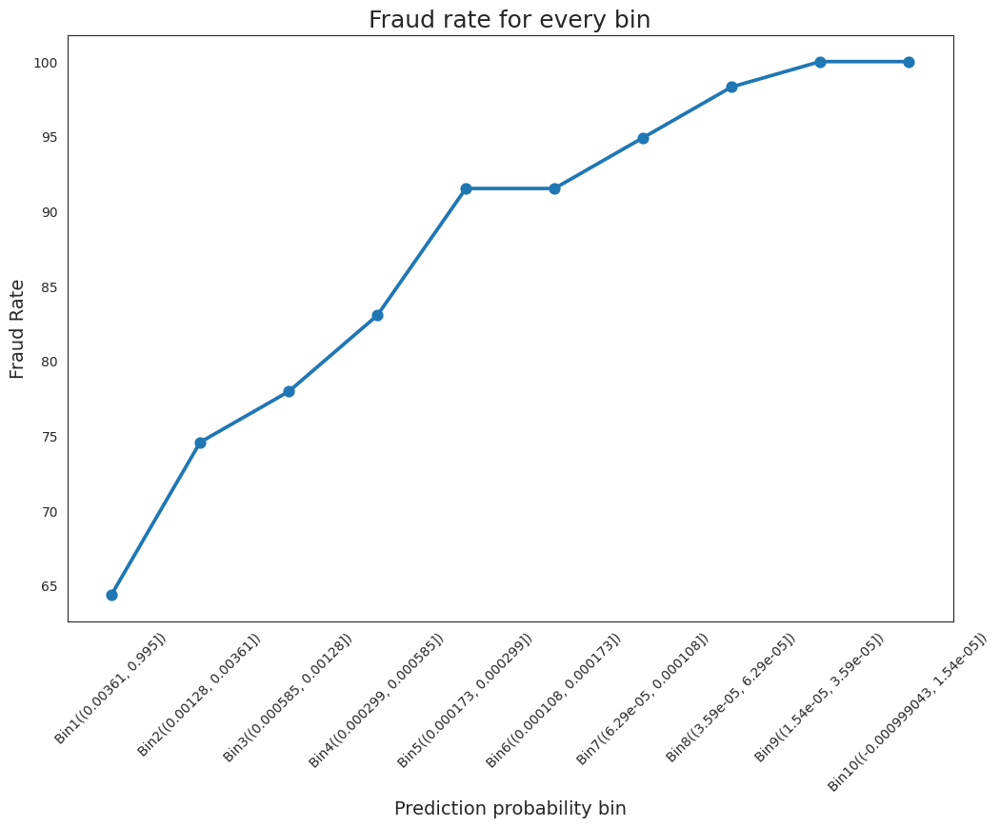

,prob_bin,not_fraud,fraud,perc_fraud,perc_not_fraud,cum_perc_fraud,cum_perc_not_fraud
0,"Bin1((0.00361, 0.995])",169,38,0.644068,0.084163,64.406780,8.416335
1,"Bin2((0.00128, 0.00361])",201,6,0.101695,0.100100,74.576271,18.426295
2,"Bin3((0.000585, 0.00128])",204,2,0.033898,0.101594,77.966102,28.585657
3,"Bin4((0.000299, 0.000585])",204,3,0.050847,0.101594,83.050847,38.745020
4,"Bin5((0.000173, 0.000299])",201,5,0.084746,0.100100,91.525424,48.754980
5,"Bin6((0.000108, 0.000173])",207,0,0.000000,0.103088,91.525424,59.063745
6,"Bin7((6.29e-05, 0.000108])",205,2,0.033898,0.102092,94.915254,69.272908
7,"Bin8((3.59e-05, 6.29e-05])",204,2,0.033898,0.101594,98.305085,79.432271
8,"Bin9((1.54e-05, 3.59e-05])",206,1,0.016949,0.102590,100.000000,89.691235
9,"Bin10((-0.000999043, 1.54e-05])",207,0,0.000000,0.103088,100.000000,100.000000


In [122]:
# Gains Table and Capture rates plot
captures(y_test, y_pred_xgbdart, y_prob_pred_xgbdart)

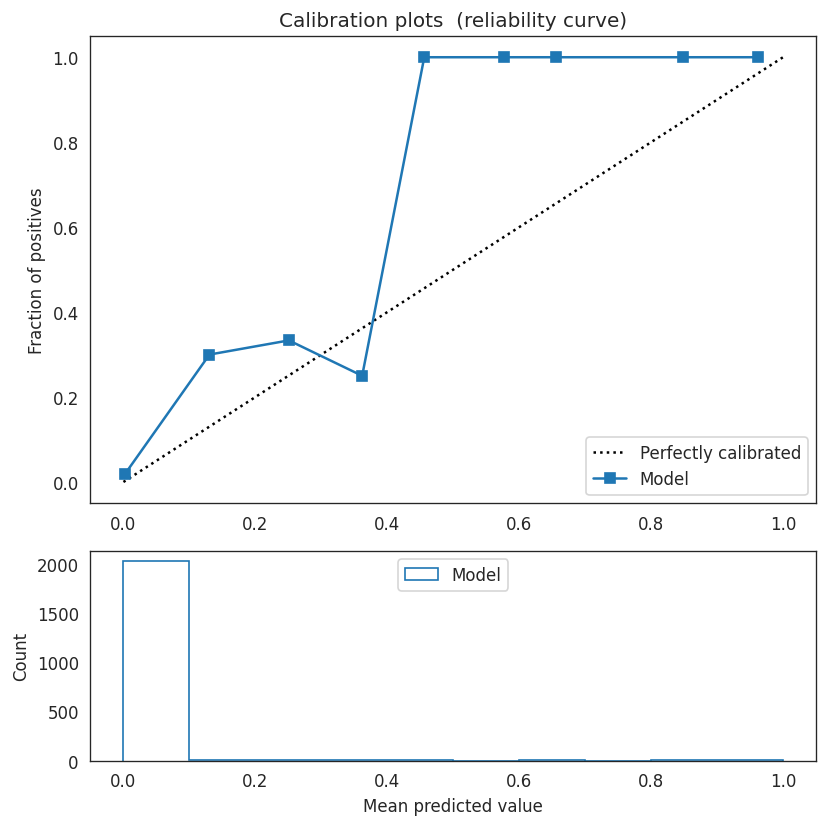

In [123]:
draw_calibration_curve(y_test, y_prob_pred_xgbdart, n_bins=10)

<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- Both of the boosters are giving the similar result, maybe because both are tree based
- The accuracy score is 0.97, AUC and concordence scores are 0.87.
- Recall and f1-score are very less for class True. That's because of class imbalance
- ROC and PR curve also needs improvements

Let's look at LGBM

## 15. LightGBM

LightGBM is a gradient boosting framework that uses tree based learning algorithms.

It is designed to be distributed and efficient with the following advantages:

- Faster training speed and higher efficiency.
- Lower memory usage.
- Better accuracy.
- Support of parallel and GPU learning.
- Capable of handling large-scale data.

In [124]:
from lightgbm import LGBMClassifier

In [125]:
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from lightgbm import LGBMClassifier
import numpy as np

# Redefine X and y from the original dataframe and drop non-feature columns
X = df.drop(['isFraud', 'TransactionID', 'TransactionDT', 'Date'], axis=1)
y = df['isFraud']

# Split the dataset into the training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

# Replace infinity values with NaN
X_train.replace([np.inf, -np.inf], np.nan, inplace=True)
X_test.replace([np.inf, -np.inf], np.nan, inplace=True)

# Impute missing values
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Define the model
lgbc = LGBMClassifier(random_state=0, n_jobs = -1)

# Train the model
lgbc.fit(X_train_imputed,y_train)

lgbc

[LightGBM] [Info] Number of positive: 110, number of negative: 4711
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013802 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13935
[LightGBM] [Info] Number of data points in the train set: 4821, number of used features: 433
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.022817 -> initscore=-3.757175
[LightGBM] [Info] Start training from score -3.757175


LGBMClassifier(n_jobs=-1, random_state=0)

Let's use the model to get predictions on test dataset. We would be looking at the predicted class and predicted probability both in order to evaluate the performance of the model

In [126]:
# Prediction
y_pred_lgbc = lgbc.predict(X_test)
y_prob_pred_lgbc = lgbc.predict_proba(X_test)
y_prob_pred_lgbc = [x[1] for x in y_prob_pred_lgbc]
print("Y predicted : ",y_pred_lgbc)
print("Y probability predicted : ",y_prob_pred_lgbc[:5])

Y predicted :  [0 0 0 ... 0 0 0]
Y probability predicted :  [np.float64(0.00016789317328433885), np.float64(7.05142661699517e-06), np.float64(7.928786929853983e-06), np.float64(1.893252601780565e-05), np.float64(7.1851759037329975e-06)]


#### Evaluation Metrices

Let's compute various evaluation metrices now
- Accuracy Score
- Confusion Matrix
- Classification Report
- AUC Score
- Concodense Index
- ROC curve
- PR curve


 Accuracy Score :  0.97677793904209

 AUC Score :  0.8517877641974475

 Confusion Matrix : 
 [[2007    1]
 [  47   12]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2008
           1       0.92      0.20      0.33        59

    accuracy                           0.98      2067
   macro avg       0.95      0.60      0.66      2067
weighted avg       0.98      0.98      0.97      2067


 Concordance Index :  0.8517877641974475

 ROC curve : 



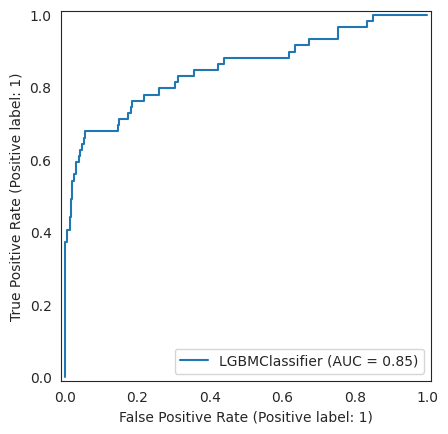


 PR curve : 



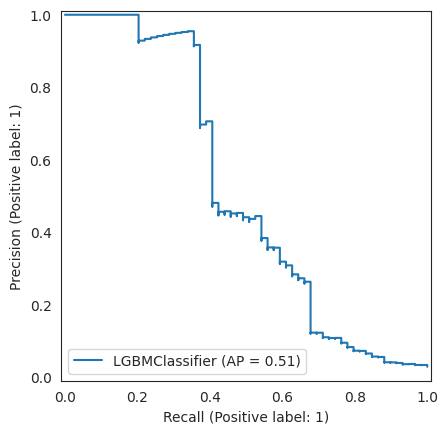

In [127]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, classification_report, RocCurveDisplay, PrecisionRecallDisplay
def concordance(actuals, preds):
    from bisect import bisect_left, bisect_right
    ones_preds  = [p for a,p in zip(actuals, preds) if a == 1]
    zeros_preds = [p for a,p in zip(actuals, preds) if a == 0]
    n_ones      = len([x for x in actuals if x == 1])
    n_total_pairs =  float(n_ones) * float(len(actuals) - n_ones)
    # print("Total Pairs: ", n_total_pairs)

    zeros_sorted = sorted(zeros_preds)

    conc = 0; disc = 0; ties = 0;
    for i, one_pred in enumerate(ones_preds):
        cur_conc = bisect_left(zeros_sorted, one_pred)
        cur_ties = bisect_right(zeros_sorted, one_pred) - cur_conc
        conc += cur_conc
        ties += cur_ties
        disc += float(len(zeros_sorted)) - cur_ties - cur_conc

    concordance = conc/n_total_pairs
    discordance = disc/n_total_pairs
    ties_perc = ties/n_total_pairs
    return concordance
def compute_evaluation_metric(model, x_test, y_actual, y_predicted, y_predicted_prob):
    print("\n Accuracy Score : ",accuracy_score(y_actual,y_predicted))
    print("\n AUC Score : ", roc_auc_score(y_actual, y_predicted_prob))
    print("\n Confusion Matrix : \n",confusion_matrix(y_actual, y_predicted))
    print("\n Classification Report : \n",classification_report(y_actual, y_predicted))
    print("\n Concordance Index : ", concordance(y_actual, y_predicted_prob))

    print("\n ROC curve : \n")
    RocCurveDisplay.from_estimator(model, x_test, y_actual)
    plt.show()

    print("\n PR curve : \n")
    PrecisionRecallDisplay.from_estimator(model, x_test, y_actual)
    plt.show()

# Compute Evaluation Metric
compute_evaluation_metric(lgbc, X_test, y_test, y_pred_lgbc, y_prob_pred_lgbc)

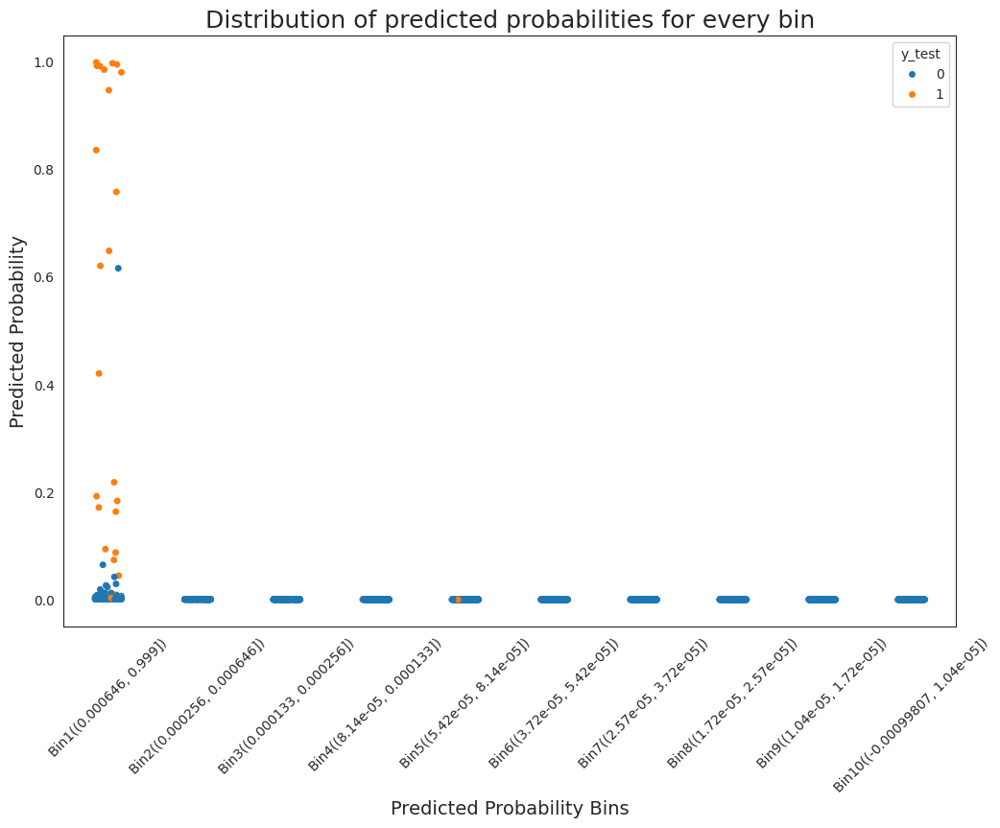

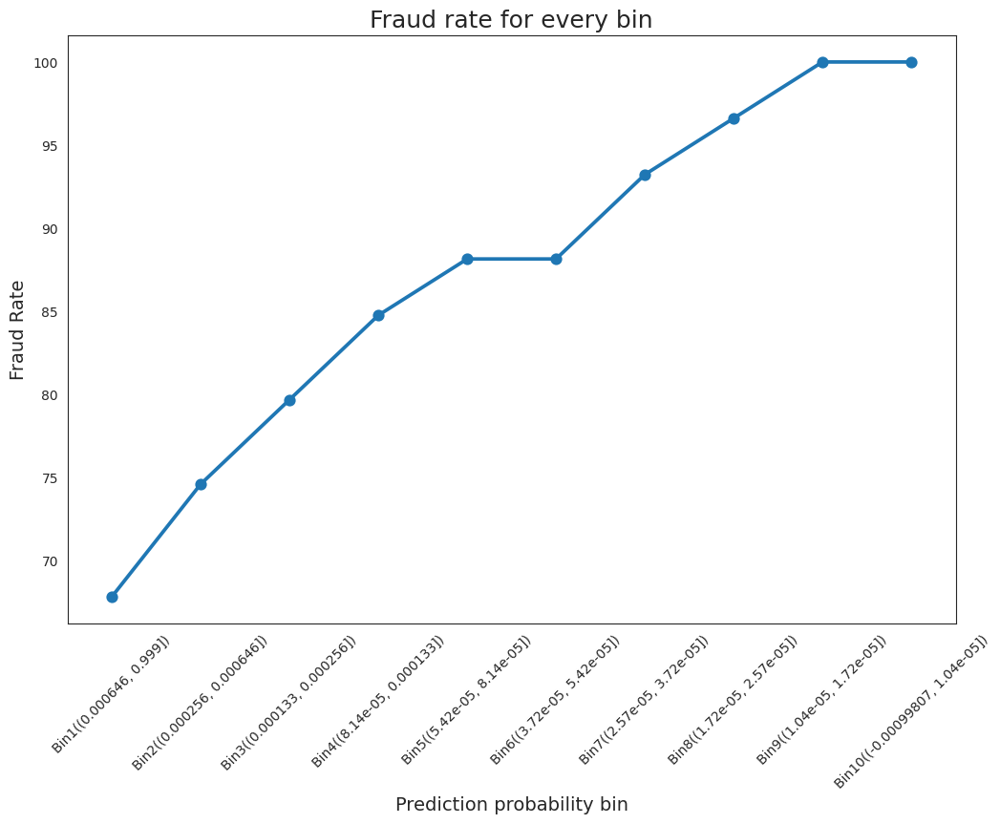

,prob_bin,not_fraud,fraud,perc_fraud,perc_not_fraud,cum_perc_fraud,cum_perc_not_fraud
0,"Bin1((0.000646, 0.999])",167,40,0.677966,0.083167,67.796610,8.316733
1,"Bin2((0.000256, 0.000646])",203,4,0.067797,0.101096,74.576271,18.426295
2,"Bin3((0.000133, 0.000256])",203,3,0.050847,0.101096,79.661017,28.535857
3,"Bin4((8.14e-05, 0.000133])",204,3,0.050847,0.101594,84.745763,38.695219
4,"Bin5((5.42e-05, 8.14e-05])",204,2,0.033898,0.101594,88.135593,48.854582
5,"Bin6((3.72e-05, 5.42e-05])",207,0,0.000000,0.103088,88.135593,59.163347
6,"Bin7((2.57e-05, 3.72e-05])",204,3,0.050847,0.101594,93.220339,69.322709
7,"Bin8((1.72e-05, 2.57e-05])",204,2,0.033898,0.101594,96.610169,79.482072
8,"Bin9((1.04e-05, 1.72e-05])",205,2,0.033898,0.102092,100.000000,89.691235
9,"Bin10((-0.00099807, 1.04e-05])",207,0,0.000000,0.103088,100.000000,100.000000


In [128]:
# Gains Table and Capture rates plot
captures(y_test, y_pred_lgbc, y_prob_pred_lgbc)

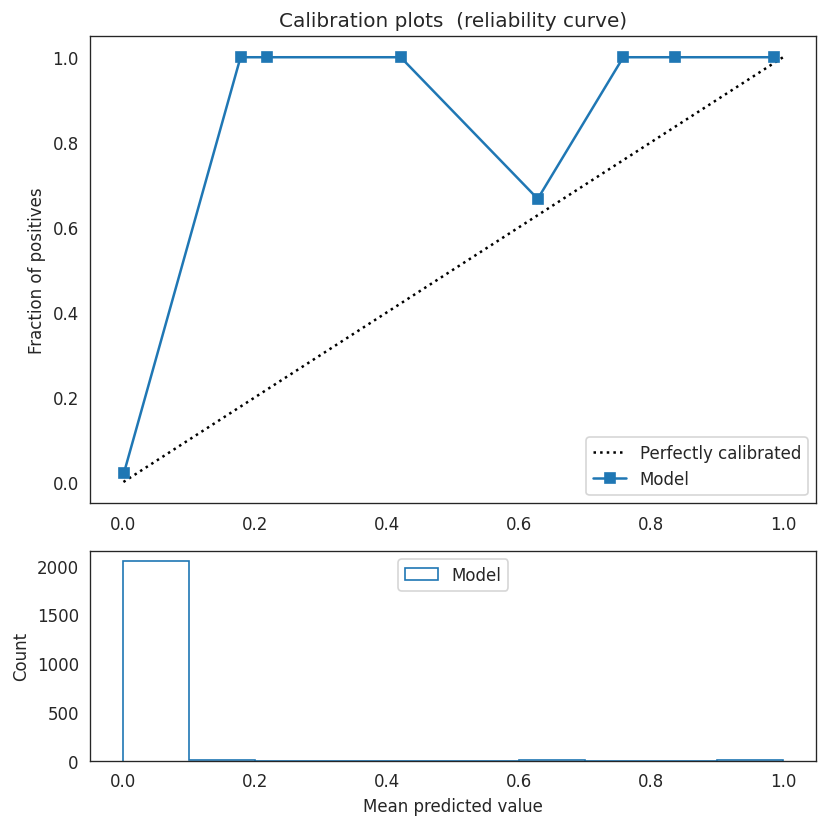

In [129]:
draw_calibration_curve(y_test, y_prob_pred_lgbc, n_bins=10)

<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- With LGBM, Accuracy score is 97.7%. It's almost similar to XGBoost model
- AUC score has imporved to 92.6 from 88.5
- Recall and f-1 score have also improved, but it's still not upto the mark

## 16. Random Forest Classifier

In [130]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier

In [131]:
X_train.head()

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,id_12,id_13,id_14,id_15,id_16,id_17,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,card2_missing_flag,card5_missing_flag,addr1_missing_flag,addr2_missing_flag,dist1_missing_flag,dist2_missing_flag,P_emaildomain_missing_flag,R_emaildomain_missing_flag,D2_missing_flag,D3_missing_flag,D4_missing_flag,D5_missing_flag,D6_missing_flag,D7_missing_flag,D8_missing_flag,D9_missing_flag,D10_missing_flag,D11_missing_flag,D12_missing_flag,D13_missing_flag,D14_missing_flag,D15_missing_flag,M1_missing_flag,M2_missing_flag,M3_missing_flag,M4_missing_flag,M5_missing_flag,M6_missing_flag,M7_missing_flag,M8_missing_flag,M9_missing_flag,V1_missing_flag,V2_missing_flag,V3_missing_flag,V4_missing_flag,V5_missing_flag,V6_missing_flag,V7_missing_flag,V8_missing_flag,V9_missing_flag,V10_missing_flag,V11_missing_flag,V12_missing_flag,V13_missing_flag,V14_missing_flag,V15_missing_flag,V16_missing_flag,V17_missing_flag,V18_missing_flag,V19_missing_flag,V20_missing_flag,V21_missing_flag,V22_missing_flag,V23_missing_flag,V24_missing_flag,V25_missing_flag,V26_missing_flag,V27_missing_flag,V28_missing_flag,V29_missing_flag,V30_missing_flag,V31_missing_flag,V32_missing_flag,V33_missing_flag,V34_missing_flag,V35_missing_flag,V36_missing_flag,V37_missing_flag,V38_missing_flag,V39_missing_flag,V40_missing_flag,V41_missing_flag,V42_missing_flag,V43_missing_flag,V44_missing_flag,V45_missing_flag,V46_missing_flag,V47_missing_flag,V48_missing_flag,V49_missing_flag,V50_missing_flag,V51_missing_flag,V52_missing_flag,V53_missing_flag,V54_missing_flag,V55_missing_flag,V56_missing_flag,V57_missing_flag,V58_missing_flag,V59_missing_flag,V60_missing_flag,V61_missing_flag,V62_missing_flag,V63_missing_flag,V64_missing_flag,V65_missing_flag,V66_missing_flag,V67_missing_flag,V68_missing_flag,V69_missing_flag,V70_missing_flag,V71_missing_flag,V72_missing_flag,V73_missing_flag,V74_missing_flag,V75_missing_flag,V76_missing_flag,V77_missing_flag,V78_missing_flag,V79_missing_flag,V80_missing_flag,V81_missing_flag,V82_missing_flag,V83_missing_flag,V84_missing_flag,V85_missing_flag,V86_missing_flag,V87_missing_flag,V88_missing_flag,V89_missing_flag,V90_missing_flag,V91_missing_flag,V92_missing_flag,V93_missing_flag,V94_missing_flag,V138_missing_flag,V139_missing_flag,V140_missing_flag,V141_missing_flag,V142_missing_flag,V143_missing_flag,V144_missing_flag,V145_missing_flag,V146_missing_flag,V147_missing_flag,V148_missing_flag,V149_missing_flag,V150_missing_flag,V151_missing_flag,V152_missing_flag,V153_missing_flag,V154_missing_flag,V155_missing_flag,V156_missing_flag,V157_missing_flag,V158_missing_flag,V159_missing_flag,V160_missing_flag,V161_missing_flag,V162_missing_flag,V163_missing_flag,V164_missing_flag,V165_missing_flag,V166_missing_flag,V167_missing_flag,V168_missing_flag,V169_missing_flag,V170_missing_flag,V171_missing_flag,V172_missing_flag,V173_missing_flag,V174_missing_flag,V175_missing_flag,V176_missing_flag,V177_missing_flag,V178_missing_flag,V179_missing_flag,V180_missing_flag,V181_missing_flag,V182_missing_flag,V183_missing_flag,V184_missing_flag,V185_missing_flag,V186_missing_flag,V187_missing_flag,V188_missing_flag,V189_missing_flag,V190_missing_flag,V191_missing_flag,V192_missing_flag,V193_missing_flag,V194_missing_flag,V195_missing_flag,V196_missing_flag,V197_missing_flag,V198_missing_flag,V199_missing_flag,V200_missing_flag,V201_missing_flag,V202_missing_flag,V203_missing_flag,V204_missing_flag,V205_missing_flag,V206_missing_flag,V207_missing_flag,V208_missing_flag,V209_missing_flag,V210_missing_flag,V211_missing_flag,V212_missing_flag,V213_missing_flag,V214_missing_flag,V215_missing_flag,V216_missing_flag,V217_missing_flag,V218_missing_flag,V219_missing_flag,V220_missing_flag,V221_missing

**Impute Missing values.** Since sklearn algos are not designed to handle missing values.

In [132]:
from sklearn.impute import KNNImputer, SimpleImputer
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np

# Read train df
df = pd.read_csv("Intermediate_Datasets/df_intermediate2.csv")

# Redefine X and y from the original dataframe and drop non-feature columns
X = df.drop(['isFraud', 'TransactionID', 'TransactionDT', 'Date'], axis=1)
y = df['isFraud']

# Split the dataset into the training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

# replace inf
X_train = X_train.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

# Impute
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
# imputer = KNNImputer(n_neighbors=3)

X_train_imputed = imputer.fit_transform(X_train)
X_train_imputed = pd.DataFrame(X_train_imputed, columns=X_train.columns)
X_train_imputed.head()

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,id_12,id_13,id_14,id_15,id_16,id_17,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,card2_missing_flag,card5_missing_flag,addr1_missing_flag,addr2_missing_flag,dist1_missing_flag,dist2_missing_flag,P_emaildomain_missing_flag,R_emaildomain_missing_flag,D2_missing_flag,D3_missing_flag,D4_missing_flag,D5_missing_flag,D6_missing_flag,D7_missing_flag,D8_missing_flag,D9_missing_flag,D10_missing_flag,D11_missing_flag,D12_missing_flag,D13_missing_flag,D14_missing_flag,D15_missing_flag,M1_missing_flag,M2_missing_flag,M3_missing_flag,M4_missing_flag,M5_missing_flag,M6_missing_flag,M7_missing_flag,M8_missing_flag,M9_missing_flag,V1_missing_flag,V2_missing_flag,V3_missing_flag,V4_missing_flag,V5_missing_flag,V6_missing_flag,V7_missing_flag,V8_missing_flag,V9_missing_flag,V10_missing_flag,V11_missing_flag,V12_missing_flag,V13_missing_flag,V14_missing_flag,V15_missing_flag,V16_missing_flag,V17_missing_flag,V18_missing_flag,V19_missing_flag,V20_missing_flag,V21_missing_flag,V22_missing_flag,V23_missing_flag,V24_missing_flag,V25_missing_flag,V26_missing_flag,V27_missing_flag,V28_missing_flag,V29_missing_flag,V30_missing_flag,V31_missing_flag,V32_missing_flag,V33_missing_flag,V34_missing_flag,V35_missing_flag,V36_missing_flag,V37_missing_flag,V38_missing_flag,V39_missing_flag,V40_missing_flag,V41_missing_flag,V42_missing_flag,V43_missing_flag,V44_missing_flag,V45_missing_flag,V46_missing_flag,V47_missing_flag,V48_missing_flag,V49_missing_flag,V50_missing_flag,V51_missing_flag,V52_missing_flag,V53_missing_flag,V54_missing_flag,V55_missing_flag,V56_missing_flag,V57_missing_flag,V58_missing_flag,V59_missing_flag,V60_missing_flag,V61_missing_flag,V62_missing_flag,V63_missing_flag,V64_missing_flag,V65_missing_flag,V66_missing_flag,V67_missing_flag,V68_missing_flag,V69_missing_flag,V70_missing_flag,V71_missing_flag,V72_missing_flag,V73_missing_flag,V74_missing_flag,V75_missing_flag,V76_missing_flag,V77_missing_flag,V78_missing_flag,V79_missing_flag,V80_missing_flag,V81_missing_flag,V82_missing_flag,V83_missing_flag,V84_missing_flag,V85_missing_flag,V86_missing_flag,V87_missing_flag,V88_missing_flag,V89_missing_flag,V90_missing_flag,V91_missing_flag,V92_missing_flag,V93_missing_flag,V94_missing_flag,V138_missing_flag,V139_missing_flag,V140_missing_flag,V141_missing_flag,V142_missing_flag,V143_missing_flag,V144_missing_flag,V145_missing_flag,V146_missing_flag,V147_missing_flag,V148_missing_flag,V149_missing_flag,V150_missing_flag,V151_missing_flag,V152_missing_flag,V153_missing_flag,V154_missing_flag,V155_missing_flag,V156_missing_flag,V157_missing_flag,V158_missing_flag,V159_missing_flag,V160_missing_flag,V161_missing_flag,V162_missing_flag,V163_missing_flag,V164_missing_flag,V165_missing_flag,V166_missing_flag,V167_missing_flag,V168_missing_flag,V169_missing_flag,V170_missing_flag,V171_missing_flag,V172_missing_flag,V173_missing_flag,V174_missing_flag,V175_missing_flag,V176_missing_flag,V177_missing_flag,V178_missing_flag,V179_missing_flag,V180_missing_flag,V181_missing_flag,V182_missing_flag,V183_missing_flag,V184_missing_flag,V185_missing_flag,V186_missing_flag,V187_missing_flag,V188_missing_flag,V189_missing_flag,V190_missing_flag,V191_missing_flag,V192_missing_flag,V193_missing_flag,V194_missing_flag,V195_missing_flag,V196_missing_flag,V197_missing_flag,V198_missing_flag,V199_missing_flag,V200_missing_flag,V201_missing_flag,V202_missing_flag,V203_missing_flag,V204_missing_flag,V205_missing_flag,V206_missing_flag,V207_missing_flag,V208_missing_flag,V209_missing_flag,V210_missing_flag,V211_missing_flag,V212_missing_flag,V213_missing_flag,V214_missing_flag,V215_missing_flag,V216_missing_flag,V217_missing_flag,V218_missing_flag,V219_missing_flag,V220_missing_flag,V221_missing

**Build and train the Classifier**

In [133]:
%%time
from sklearn.ensemble import RandomForestClassifier
# Define the model
rfc = RandomForestClassifier(random_state=0, n_jobs = -1)
# rfc = ExtraTreesClassifier(random_state=0, n_jobs = -1)
# rfc = AdaBoostClassifier(random_state=0)
# rfc = GradientBoostingClassifier(random_state=0)

# Train the model
rfc.fit(X_train_imputed, y_train)

rfc

CPU times: user 2.34 s, sys: 17 ms, total: 2.36 s
Wall time: 1.28 s


RandomForestClassifier(n_jobs=-1, random_state=0)

**Predicting on test data**

In [134]:
# Impute X_Test before predicting
X_test_imputed = imputer.transform(X_test)

# Prediction
y_pred_rfc = rfc.predict(X_test_imputed)
y_prob_pred_rfc = rfc.predict_proba(X_test_imputed)[:, 1]

print("Y predicted : ",y_pred_rfc)
print("Y probability predicted : ",y_prob_pred_rfc[:5])

Y predicted :  [0 0 0 ... 0 0 0]
Y probability predicted :  [0.   0.01 0.   0.04 0.  ]


**Evaluation metrics**


 Accuracy Score :  0.97677793904209

 AUC Score :  0.8327495104328448

 Confusion Matrix : 
 [[2006    2]
 [  46   13]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2008
           1       0.87      0.22      0.35        59

    accuracy                           0.98      2067
   macro avg       0.92      0.61      0.67      2067
weighted avg       0.97      0.98      0.97      2067


 Concordance Index :  0.7992268215274495

 ROC curve : 



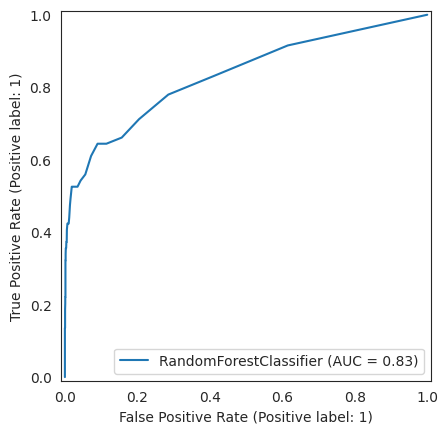


 PR curve : 



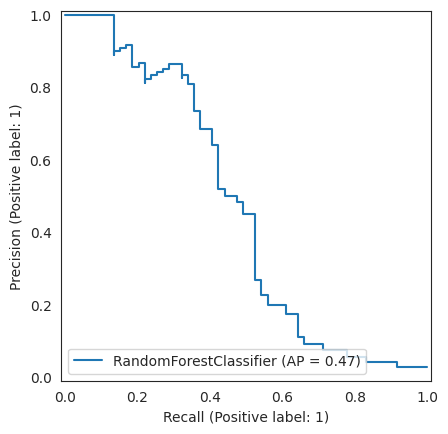

In [135]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, classification_report, RocCurveDisplay, PrecisionRecallDisplay
from bisect import bisect_left, bisect_right
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def concordance(actuals, preds):
    ones_preds  = [p for a,p in zip(actuals, preds) if a == 1]
    zeros_preds = [p for a,p in zip(actuals, preds) if a == 0]
    n_ones      = len([x for x in actuals if x == 1])
    n_total_pairs =  float(n_ones) * float(len(actuals) - n_ones)
    zeros_sorted = sorted(zeros_preds)
    conc = 0; disc = 0; ties = 0;
    for i, one_pred in enumerate(ones_preds):
        cur_conc = bisect_left(zeros_sorted, one_pred)
        cur_ties = bisect_right(zeros_sorted, one_pred) - cur_conc
        conc += cur_conc
        ties += cur_ties
        disc += float(len(zeros_sorted)) - cur_ties - cur_conc
    concordance = conc/n_total_pairs
    discordance = disc/n_total_pairs
    ties_perc = ties/n_total_pairs
    return concordance

def compute_evaluation_metric(model, x_test, y_actual, y_predicted, y_predicted_prob):
    print("\n Accuracy Score : ",accuracy_score(y_actual,y_predicted))
    print("\n AUC Score : ", roc_auc_score(y_actual, y_predicted_prob))
    print("\n Confusion Matrix : \n",confusion_matrix(y_actual, y_predicted))
    print("\n Classification Report : \n",classification_report(y_actual, y_predicted))
    print("\n Concordance Index : ", concordance(y_actual, y_predicted_prob))

    print("\n ROC curve : \n")
    RocCurveDisplay.from_estimator(model, x_test, y_actual)
    plt.show()

    print("\n PR curve : \n")
    PrecisionRecallDisplay.from_estimator(model, x_test, y_actual)
    plt.show()

def captures(y_test, y_pred, y_pred_prob):
    validation_df = {'y_test' : y_test, 'y_pred' : y_pred, 'y_pred_prob' : y_pred_prob}
    validation_df = pd.DataFrame(data = validation_df)
    try:
        validation_df['bin_y_pred_prob'] = pd.qcut(validation_df['y_pred_prob'], q=10)
    except:
        validation_df['bin_y_pred_prob'] = pd.qcut(validation_df['y_pred_prob'], q=10, duplicates='drop')
    x_label = []
    for i in range(len(validation_df['bin_y_pred_prob'].cat.categories[::-1].astype('str'))):
        x_label.append("Bin" + str(i + 1)+ "(" + validation_df['bin_y_pred_prob'].cat.categories[::-1].astype('str')[i] + ")")
    plt.figure(figsize=(12, 8));
    sns.stripplot(x=validation_df.bin_y_pred_prob, y=validation_df.y_pred_prob, jitter = 0.15, hue = validation_df.y_test, order = validation_df['bin_y_pred_prob'].cat.categories[::-1])
    plt.title("Distribution of predicted probabilities for every bin", fontsize=18)
    plt.xlabel("Predicted Probability Bins", fontsize=14);
    plt.ylabel("Predicted Probability", fontsize=14);
    try:
        plt.xticks(np.arange(10), x_label, rotation=45);
    except:
        pass
    plt.show()
    gains_df             = validation_df.groupby(["bin_y_pred_prob","y_test"]).agg({'y_test': ['count']})
    gains_df.columns     = gains_df.columns.map(''.join)
    gains_df['prob_bin'] = gains_df.index.get_level_values(0)
    gains_df['y_test']   = gains_df.index.get_level_values(1)
    gains_df.reset_index(drop = True, inplace = True)
    gains_table = gains_df.pivot(index='prob_bin', columns='y_test', values='y_testcount')
    gains_table['prob_bin'] = gains_table.index
    gains_table = gains_table.iloc[::-1]
    gains_table['prob_bin'] = x_label
    gains_table.reset_index(drop = True, inplace = True)
    gains_table = gains_table[['prob_bin', 0, 1]]
    gains_table.columns = ['prob_bin', "not_fraud", "fraud"]
    gains_table['perc_fraud'] = gains_table['fraud']/gains_table['fraud'].sum()
    gains_table['perc_not_fraud'] = gains_table['not_fraud']/gains_table['not_fraud'].sum()
    gains_table['cum_perc_fraud'] = 100*(gains_table.fraud.cumsum() / gains_table.fraud.sum())
    gains_table['cum_perc_not_fraud'] = 100*(gains_table.not_fraud.cumsum() / gains_table.not_fraud.sum())
    plt.figure(figsize=(12, 8));
    sns.set_style("white")
    sns.pointplot(x = "prob_bin", y = "cum_perc_fraud", data = gains_table, legend = False, order=gains_table.prob_bin)
    plt.xticks(rotation=45);
    plt.ylabel("Fraud Rate", fontsize=14)
    plt.xlabel("Prediction probability bin", fontsize=14)
    plt.title("Fraud rate for every bin", fontsize=18)
    plt.show()
    return gains_table

def draw_calibration_curve(y_test, y_prob, n_bins=10):
    from sklearn.calibration import calibration_curve
    plt.figure(figsize=(7, 7), dpi=120)
    ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
    ax2 = plt.subplot2grid((3, 1), (2, 0))
    ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
    fraction_of_positives, mean_predicted_value = calibration_curve(y_test, y_prob, n_bins=10)
    ax1.plot(mean_predicted_value, fraction_of_positives, "s-", label="%s" % ("Model", ))
    ax2.hist(y_prob, range=(0, 1), bins=10, label="Model", histtype="step", lw=2)
    ax1.set_ylabel("Fraction of positives")
    ax1.set_ylim([-0.05, 1.05])
    ax1.legend(loc="lower right")
    ax1.set_title('Calibration plots  (reliability curve)')
    ax2.set_xlabel("Mean predicted value")
    ax2.set_ylabel("Count")
    ax2.legend(loc="upper center", ncol=2)
    plt.tight_layout()
    plt.show()

# Compute Evaluation Metric
compute_evaluation_metric(rfc, X_test_imputed, y_test, y_pred_rfc, y_prob_pred_rfc)

In [136]:
# Concordance
concordance(y_test.values, y_prob_pred_rfc)

0.7992268215274495

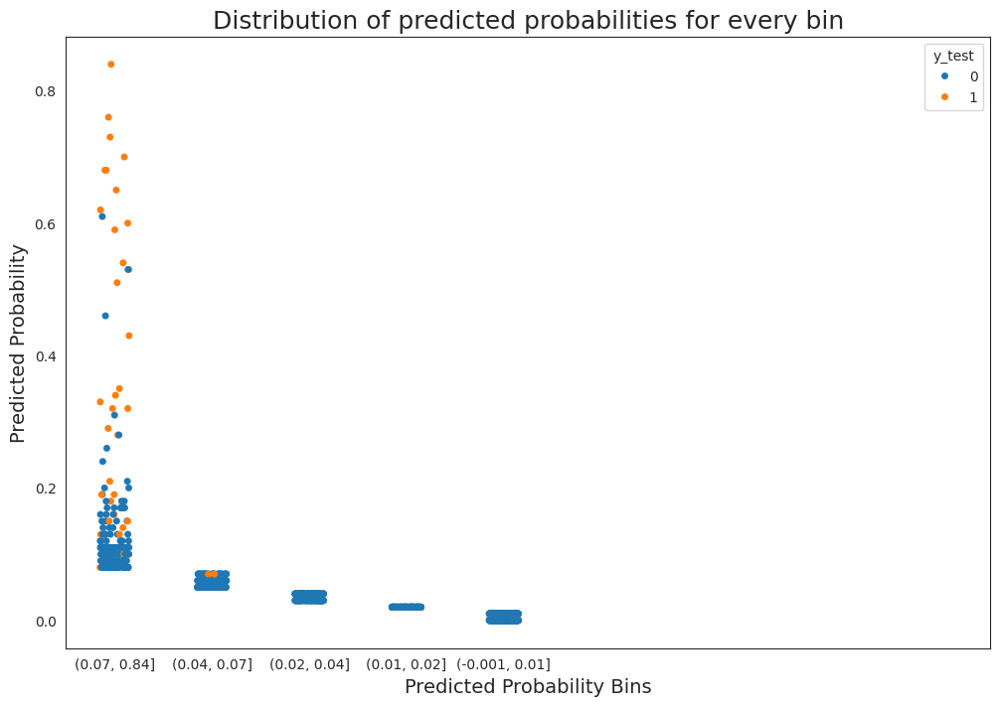

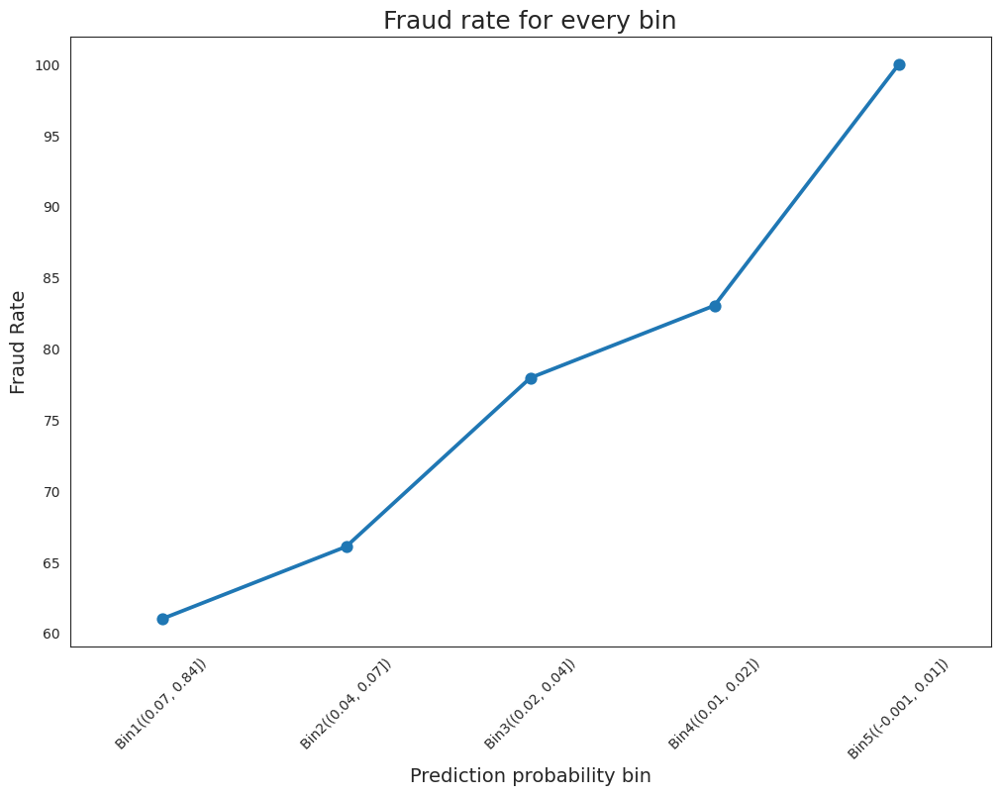

,prob_bin,not_fraud,fraud,perc_fraud,perc_not_fraud,cum_perc_fraud,cum_perc_not_fraud
0,"Bin1((0.07, 0.84])",145,36,0.610169,0.072211,61.016949,7.221116
1,"Bin2((0.04, 0.07])",170,3,0.050847,0.084661,66.101695,15.687251
2,"Bin3((0.02, 0.04])",258,7,0.118644,0.128486,77.966102,28.535857
3,"Bin4((0.01, 0.02])",250,3,0.050847,0.124502,83.050847,40.986056
4,"Bin5((-0.001, 0.01])",1185,10,0.169492,0.590139,100.000000,100.000000


In [137]:
# Gains Table and Capture rates plot
captures(y_test, y_pred_rfc, y_prob_pred_rfc)

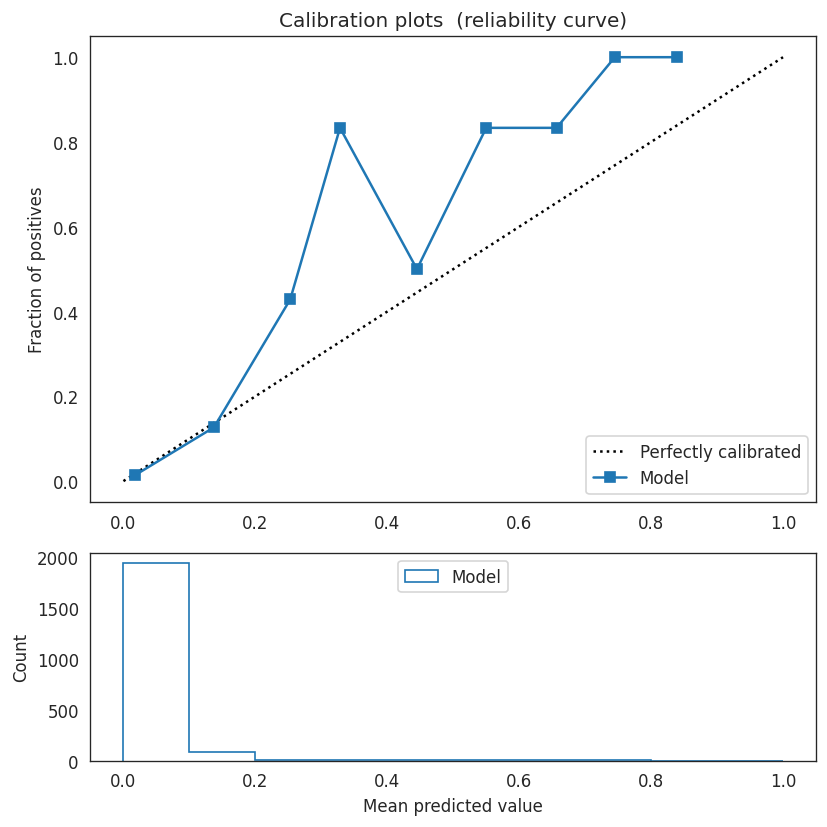

In [138]:
draw_calibration_curve(y_test, y_prob_pred_rfc, n_bins=10)

## 17. Handling Class Imbalance

### Handle Class Imbalance with Random Oversampler

Imbalanced classes are a common problem in machine learning classification where there are a disproportionate ratio of observations in each class.

Most machine learning algorithms work best when the number of samples in each class are about equal. This is because most algorithms are designed to maximize accuracy and reduce error.

- Upsample

In [139]:
from imblearn.over_sampling import RandomOverSampler
# random over sampler
ros = RandomOverSampler()
X_train_ros, y_train_ros = ros.fit_resample(X_train_imputed, y_train)
y_train_ros.value_counts()

,count
isFraud,
0,4711
1,4711


In [140]:
%%time
from lightgbm import LGBMClassifier
# Define the model
lgbc_ros = LGBMClassifier(random_state=0)

# Train the model
lgbc_ros.fit(X_train_ros,y_train_ros)

lgbc_ros

[LightGBM] [Info] Number of positive: 4711, number of negative: 4711
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.027694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13944
[LightGBM] [Info] Number of data points in the train set: 9422, number of used features: 434
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
CPU times: user 2.01 s, sys: 6.06 ms, total: 2.02 s
Wall time: 2.02 s


LGBMClassifier(random_state=0)

Let's use the model to get predictions on test dataset. We would be looking at the predicted class and predicted probability both in order to evaluate the performance of the model

In [141]:
# Prediction on the original test dataset
y_pred_lgbcros = lgbc_ros.predict(X_test_imputed)
y_prob_pred_lgbcros = lgbc_ros.predict_proba(X_test_imputed)[:, 1]

print("Y predicted : ",y_pred_lgbcros)
print("Y probability predicted : ",y_prob_pred_lgbcros[:5])

Y predicted :  [0 0 0 ... 0 0 0]
Y probability predicted :  [9.93957803e-03 1.19558526e-04 1.02424092e-04 6.78770959e-04
 9.73387928e-05]


### Evaluation Metrics

Let's compute various evaluation metrices now
- Accuracy Score
- Confusion Matrix
- Classification Report
- AUC Score
- Concodense Index
- ROC curve
- PR curve


 Accuracy Score :  0.9811320754716981

 AUC Score :  0.8467485988250388

 Confusion Matrix : 
 [[2005    3]
 [  36   23]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2008
           1       0.88      0.39      0.54        59

    accuracy                           0.98      2067
   macro avg       0.93      0.69      0.77      2067
weighted avg       0.98      0.98      0.98      2067


 Concordance Index :  0.8467485988250388

 ROC curve : 



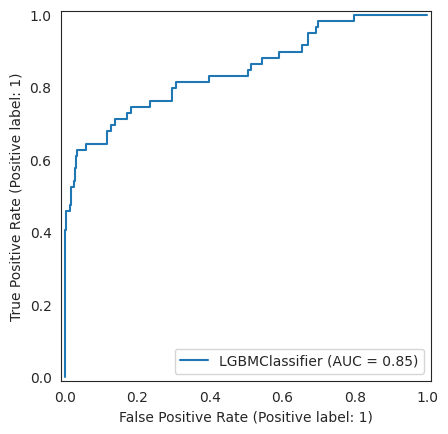


 PR curve : 



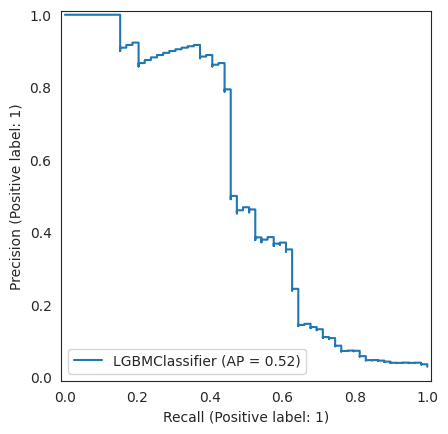

In [142]:
# Compute Evaluation Metric
compute_evaluation_metric(lgbc_ros, X_test_imputed, y_test, y_pred_lgbcros, y_prob_pred_lgbcros)

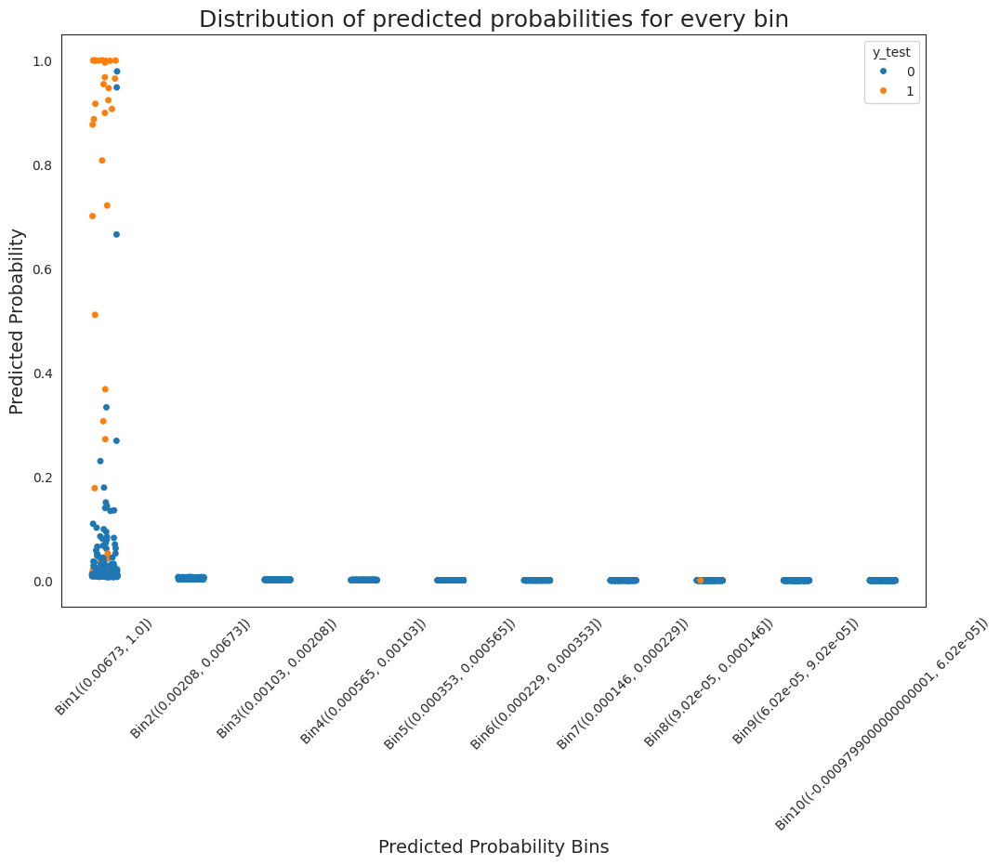

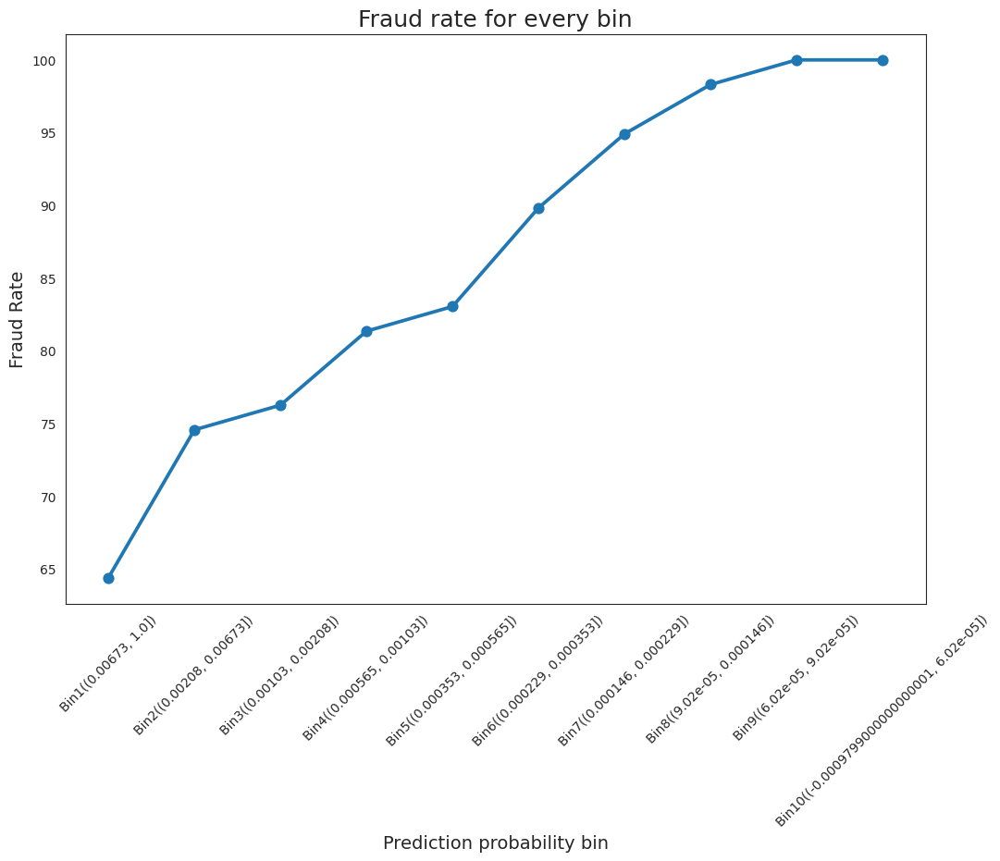

,prob_bin,not_fraud,fraud,perc_fraud,perc_not_fraud,cum_perc_fraud,cum_perc_not_fraud
0,"Bin1((0.00673, 1.0])",169,38,0.644068,0.084163,64.406780,8.416335
1,"Bin2((0.00208, 0.00673])",201,6,0.101695,0.100100,74.576271,18.426295
2,"Bin3((0.00103, 0.00208])",205,1,0.016949,0.102092,76.271186,28.635458
3,"Bin4((0.000565, 0.00103])",204,3,0.050847,0.101594,81.355932,38.794821
4,"Bin5((0.000353, 0.000565])",205,1,0.016949,0.102092,83.050847,49.003984
5,"Bin6((0.000229, 0.000353])",203,4,0.067797,0.101096,89.830508,59.113546
6,"Bin7((0.000146, 0.000229])",204,3,0.050847,0.101594,94.915254,69.272908
7,"Bin8((9.02e-05, 0.000146])",204,2,0.033898,0.101594,98.305085,79.432271
8,"Bin9((6.02e-05, 9.02e-05])",206,1,0.016949,0.102590,100.000000,89.691235
9,"Bin10((-0.0009799000000000001, 6.02e-05])",207,0,0.000000,0.103088,100.000000,100.000000


In [143]:
# Gains Table and Capture rates plot
captures(y_test, y_pred_lgbcros, y_prob_pred_lgbcros)

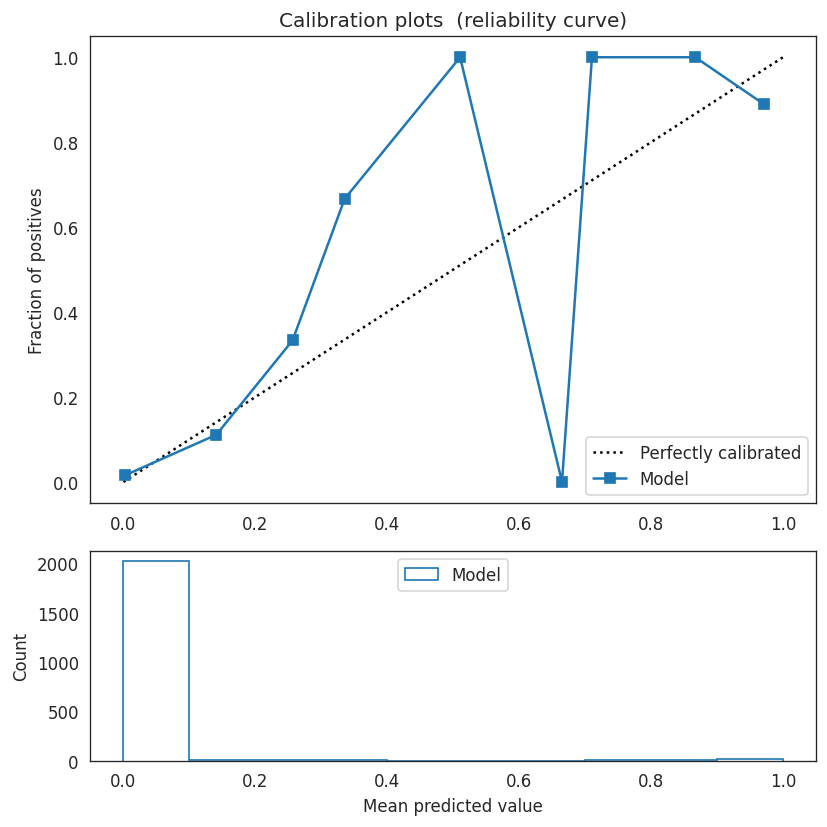

In [144]:
draw_calibration_curve(y_test, y_prob_pred_lgbcros, n_bins=10)

<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Inferences:</h3>
</div>

- After balancing the class, accuracy score is 0.88 and AUC score is 92.5%
- Accuracy has decreased as compared to the previos model, but AUC has improved
- Additionally the recall has improved significantly at the cost of precision.



## 18. Cost Sensitive Learning with Class weights

The 'balanced' mode uses the values of y to automatically adjust weights inversely proportional to class frequencies in the input data as n_samples / (n_classes * np.bincount(y))

In [145]:
%%time
# Define the model
lgbc_bal = LGBMClassifier(random_state=0, class_weight='balanced')

# Train the model
lgbc_bal.fit(X_train_imputed, y_train)

lgbc_bal

[LightGBM] [Info] Number of positive: 110, number of negative: 4711
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13935
[LightGBM] [Info] Number of data points in the train set: 4821, number of used features: 433
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
CPU times: user 1.34 s, sys: 5.04 ms, total: 1.34 s
Wall time: 1.33 s


LGBMClassifier(class_weight='balanced', random_state=0)

In [146]:
# Prediction
y_pred_lgbcbal = lgbc_bal.predict(X_test)
y_prob_pred_lgbcbal = lgbc_bal.predict_proba(X_test)[:, 1]

print("Y predicted : ",y_pred_lgbcbal)
print("Y probability predicted : ",y_prob_pred_lgbcbal[:5])

Y predicted :  [0 0 0 ... 0 0 0]
Y probability predicted :  [0.00180058 0.00076749 0.0001021  0.00018913 0.00024584]



 Accuracy Score :  0.9801644895984518

 AUC Score :  0.8666857991761767

 Confusion Matrix : 
 [[2007    1]
 [  40   19]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2008
           1       0.95      0.32      0.48        59

    accuracy                           0.98      2067
   macro avg       0.97      0.66      0.74      2067
weighted avg       0.98      0.98      0.98      2067


 Concordance Index :  0.8666857991761766

 ROC curve : 



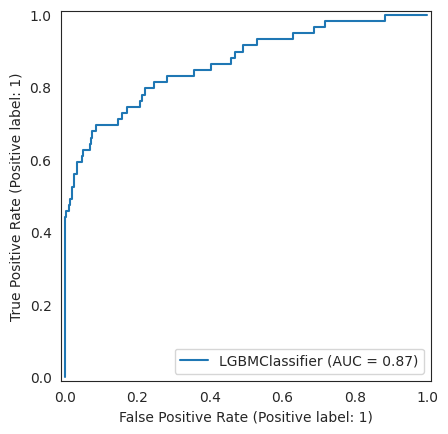


 PR curve : 



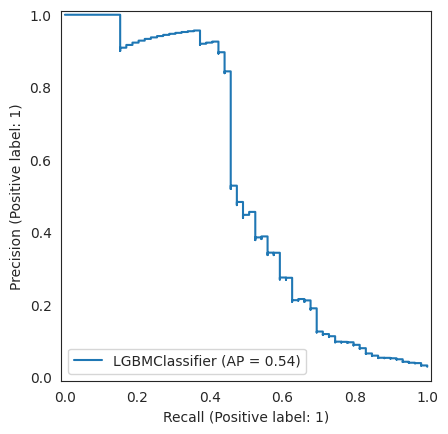

In [147]:
# Compute Evaluation Metric
compute_evaluation_metric(lgbc_bal, X_test, y_test, y_pred_lgbcbal, y_prob_pred_lgbcbal)

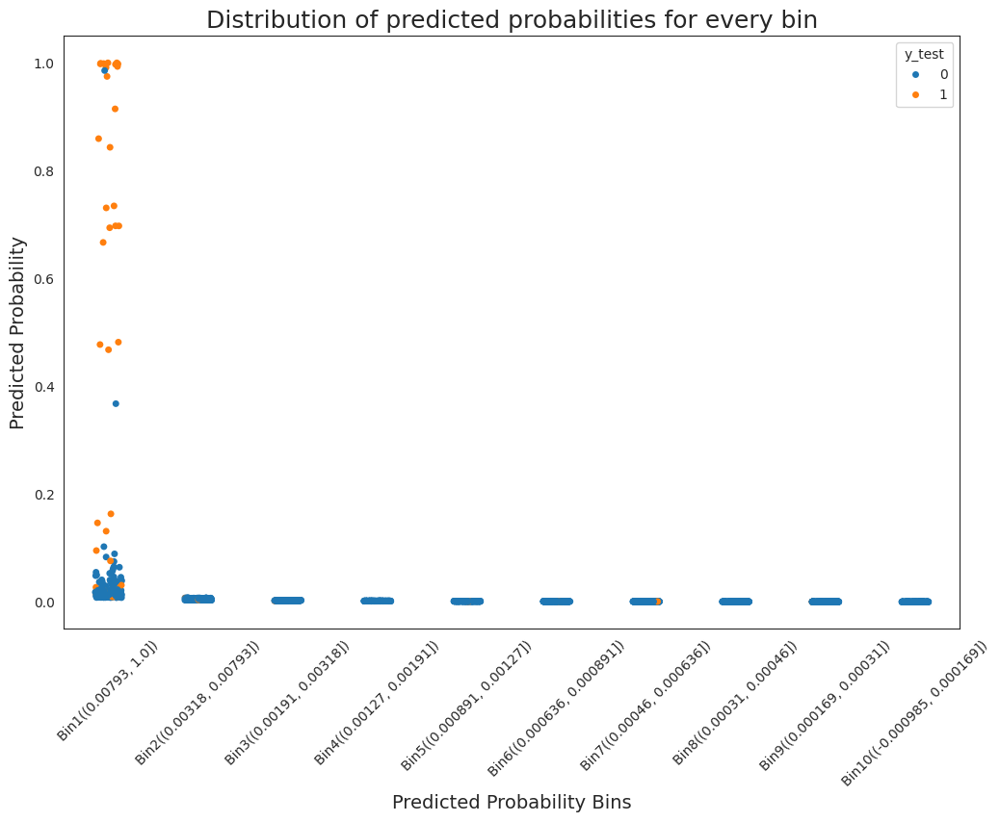

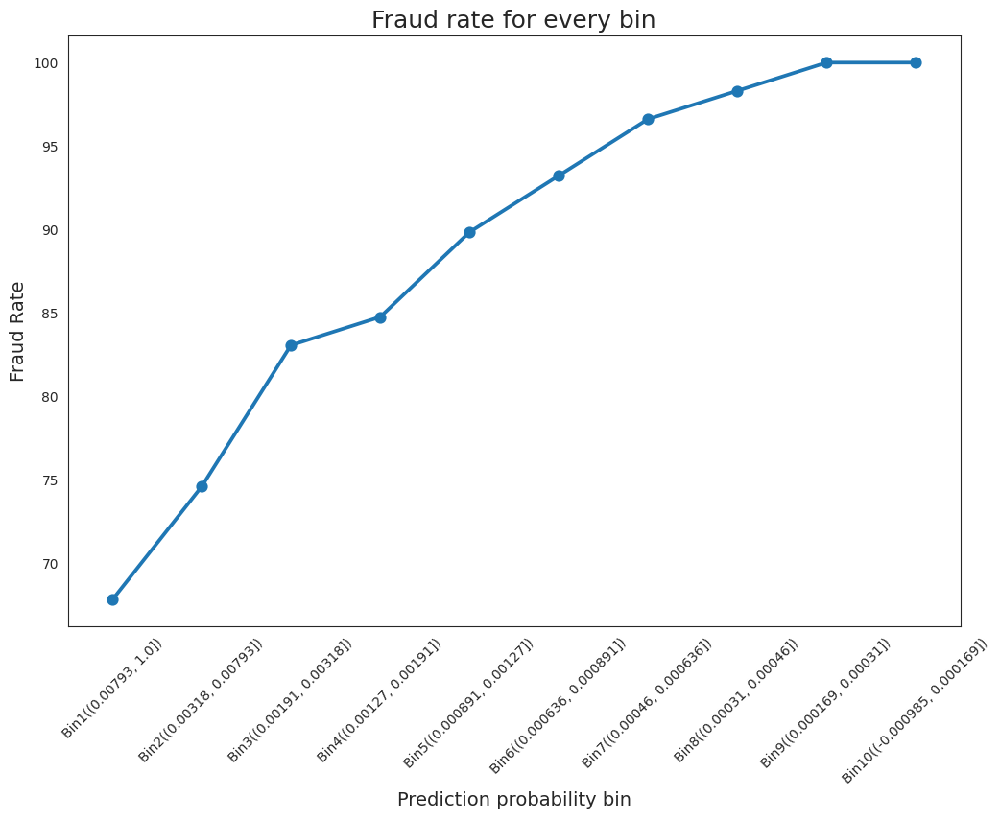

,prob_bin,not_fraud,fraud,perc_fraud,perc_not_fraud,cum_perc_fraud,cum_perc_not_fraud
0,"Bin1((0.00793, 1.0])",167,40,0.677966,0.083167,67.796610,8.316733
1,"Bin2((0.00318, 0.00793])",203,4,0.067797,0.101096,74.576271,18.426295
2,"Bin3((0.00191, 0.00318])",201,5,0.084746,0.100100,83.050847,28.436255
3,"Bin4((0.00127, 0.00191])",206,1,0.016949,0.102590,84.745763,38.695219
4,"Bin5((0.000891, 0.00127])",203,3,0.050847,0.101096,89.830508,48.804781
5,"Bin6((0.000636, 0.000891])",205,2,0.033898,0.102092,93.220339,59.013944
6,"Bin7((0.00046, 0.000636])",205,2,0.033898,0.102092,96.610169,69.223108
7,"Bin8((0.00031, 0.00046])",205,1,0.016949,0.102092,98.305085,79.432271
8,"Bin9((0.000169, 0.00031])",206,1,0.016949,0.102590,100.000000,89.691235
9,"Bin10((-0.000985, 0.000169])",207,0,0.000000,0.103088,100.000000,100.000000


In [148]:
# Gains Table and Capture rates plot
captures(y_test, y_pred_lgbcbal, y_prob_pred_lgbcbal)

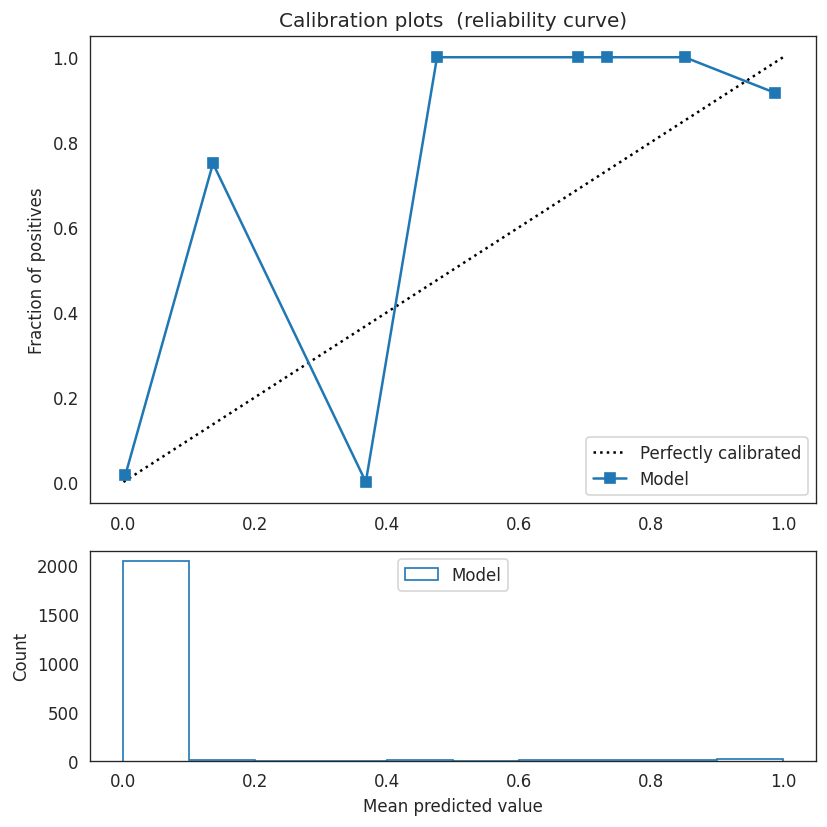

In [149]:
draw_calibration_curve(y_test, y_prob_pred_lgbcbal, n_bins=10)

## 19. Model Calibration

In [150]:
from sklearn.calibration import CalibratedClassifierCV

In [151]:
lgbc_bal = LGBMClassifier(random_state=0)
calibrated_clf = CalibratedClassifierCV(lgbc_bal, cv=3, method='sigmoid')
calibrated_clf.fit(X_train_imputed, y_train)

[LightGBM] [Info] Number of positive: 74, number of negative: 3140
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011054 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13306
[LightGBM] [Info] Number of data points in the train set: 3214, number of used features: 424
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.023024 -> initscore=-3.747913
[LightGBM] [Info] Start training from score -3.747913
[LightGBM] [Info] Number of positive: 73, number of negative: 3141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13353
[LightGBM] [Info] Number of data points in the train set: 3214, number of used features: 433
[LightGBM] [Info] [binar

CalibratedClassifierCV(cv=3, estimator=LGBMClassifier(random_state=0))

In [152]:
# Prediction
y_pred_calib = calibrated_clf.predict(X_test)
y_prob_pred_calib = calibrated_clf.predict_proba(X_test)[:, 1]

In [153]:
len(calibrated_clf.calibrated_classifiers_)

3

In [154]:
print("Y predicted : ", y_pred_calib)
print("Y probability predicted : ", y_prob_pred_calib[:5])

Y predicted :  [0 0 0 ... 0 0 0]
Y probability predicted :  [0.0156243  0.01560325 0.01558831 0.01561139 0.01560429]



 Accuracy Score :  0.9787131107885825

 AUC Score :  0.874392261462624

 Confusion Matrix : 
 [[2007    1]
 [  43   16]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2008
           1       0.94      0.27      0.42        59

    accuracy                           0.98      2067
   macro avg       0.96      0.64      0.71      2067
weighted avg       0.98      0.98      0.97      2067


 Concordance Index :  0.874392261462624

 ROC curve : 



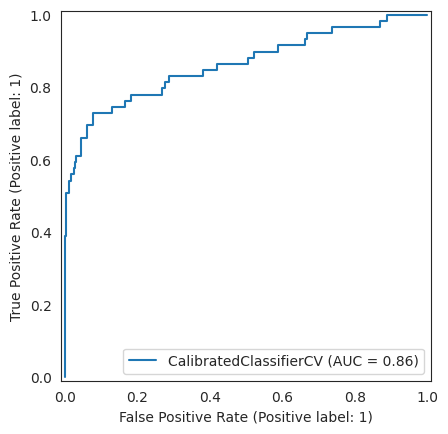


 PR curve : 



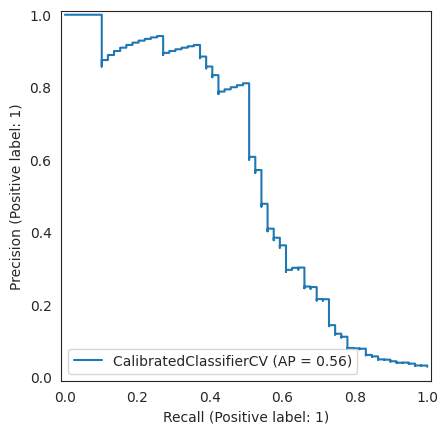

In [155]:
# Compute Evaluation Metric
compute_evaluation_metric(calibrated_clf, X_test_imputed, y_test, y_pred_calib, y_prob_pred_calib)

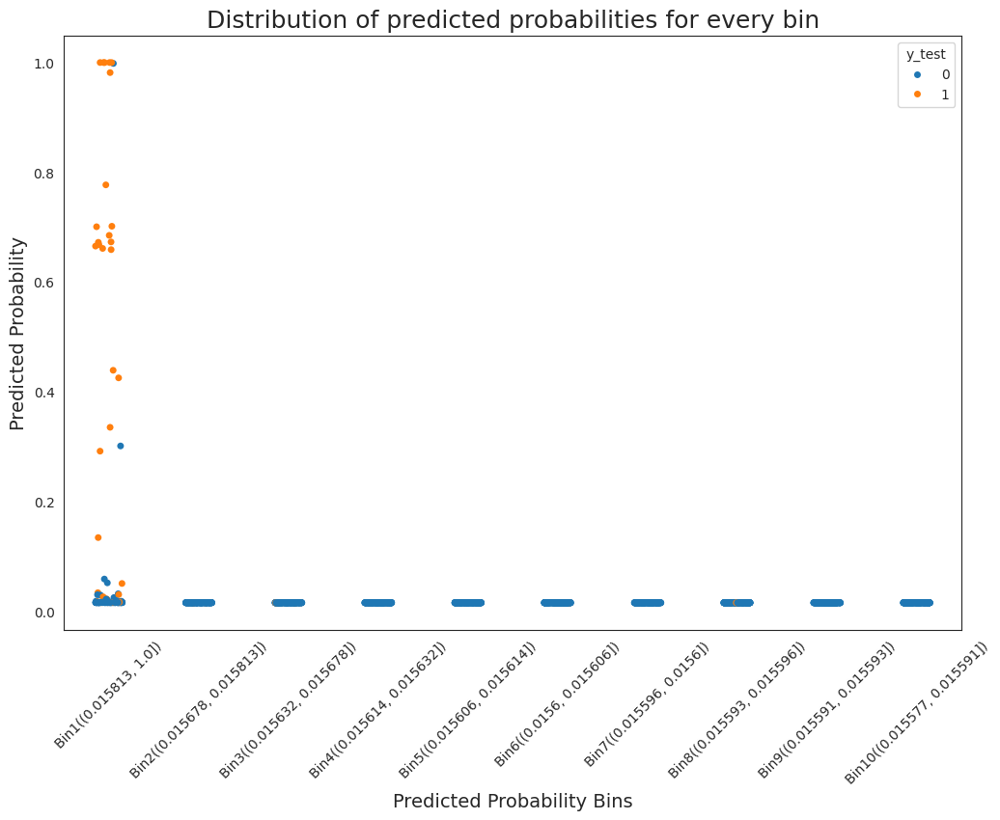

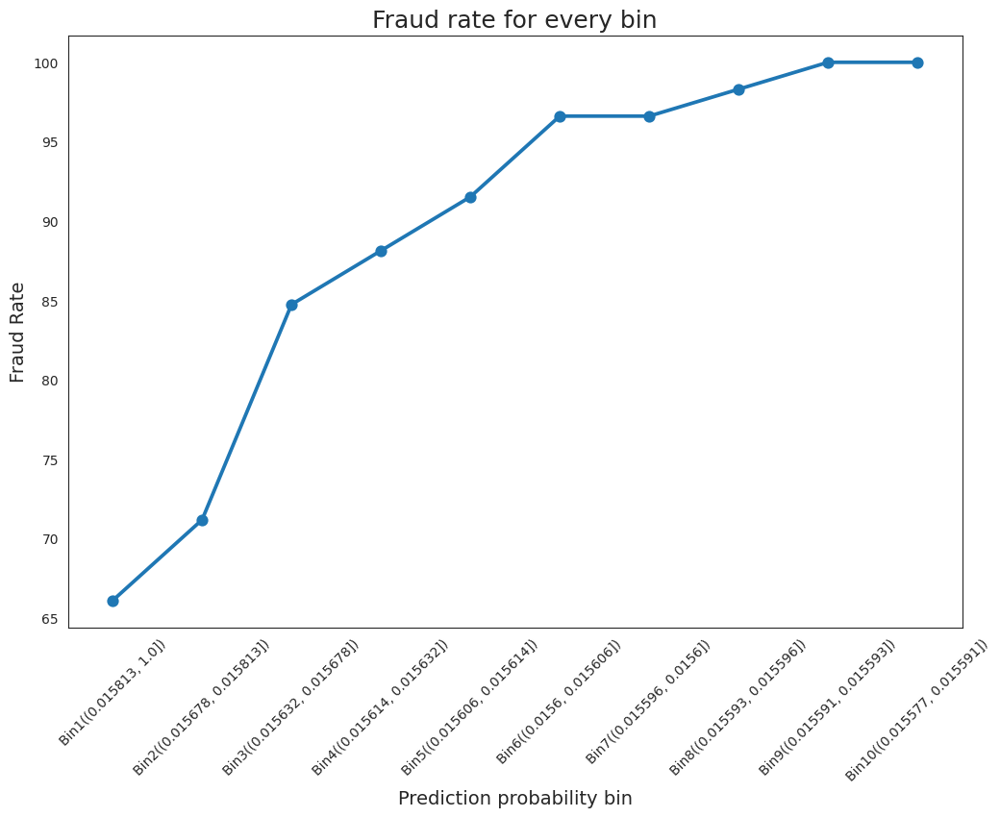

,prob_bin,not_fraud,fraud,perc_fraud,perc_not_fraud,cum_perc_fraud,cum_perc_not_fraud
0,"Bin1((0.015813, 1.0])",168,39,0.661017,0.083665,66.101695,8.366534
1,"Bin2((0.015678, 0.015813])",204,3,0.050847,0.101594,71.186441,18.525896
2,"Bin3((0.015632, 0.015678])",198,8,0.135593,0.098606,84.745763,28.386454
3,"Bin4((0.015614, 0.015632])",205,2,0.033898,0.102092,88.135593,38.595618
4,"Bin5((0.015606, 0.015614])",204,2,0.033898,0.101594,91.525424,48.754980
5,"Bin6((0.0156, 0.015606])",204,3,0.050847,0.101594,96.610169,58.914343
6,"Bin7((0.015596, 0.0156])",207,0,0.000000,0.103088,96.610169,69.223108
7,"Bin8((0.015593, 0.015596])",205,1,0.016949,0.102092,98.305085,79.432271
8,"Bin9((0.015591, 0.015593])",206,1,0.016949,0.102590,100.000000,89.691235
9,"Bin10((0.015577, 0.015591])",207,0,0.000000,0.103088,100.000000,100.000000


In [156]:
# Gains Table and Capture rates plot
captures(y_test, y_pred_calib, y_prob_pred_calib)

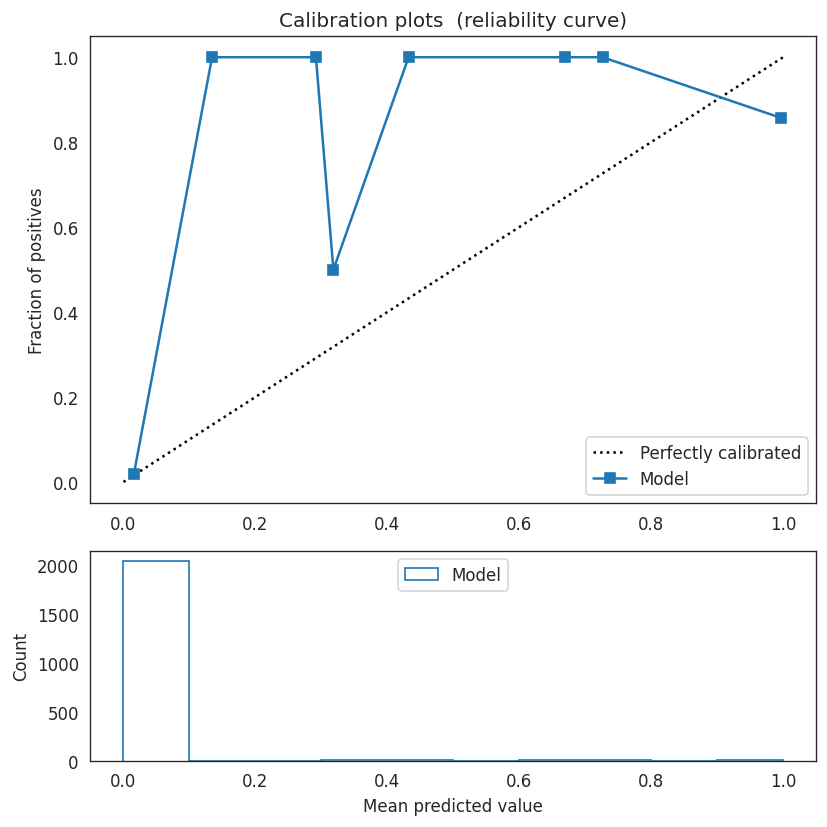

In [157]:
draw_calibration_curve(y_test, y_prob_pred_calib, n_bins=10)


 Accuracy Score :  0.9787131107885825

 AUC Score :  0.874392261462624

 Confusion Matrix : 
 [[2007    1]
 [  43   16]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2008
           1       0.94      0.27      0.42        59

    accuracy                           0.98      2067
   macro avg       0.96      0.64      0.71      2067
weighted avg       0.98      0.98      0.97      2067


 Concordance Index :  0.874392261462624

 ROC curve : 



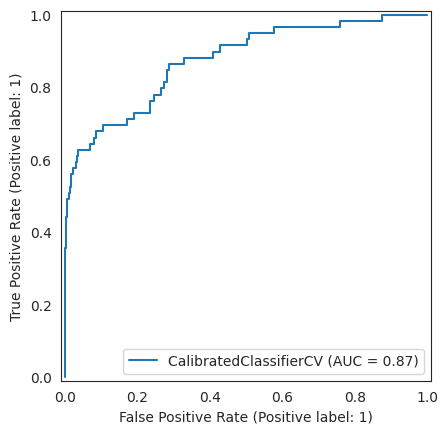


 PR curve : 



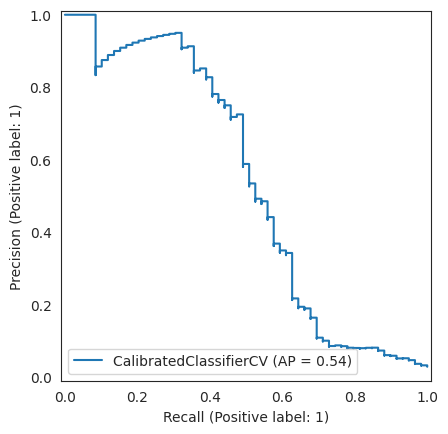

In [158]:
 # Compute Evaluation Metric
compute_evaluation_metric(calibrated_clf, X_test, y_test, y_pred_calib, y_prob_pred_calib)

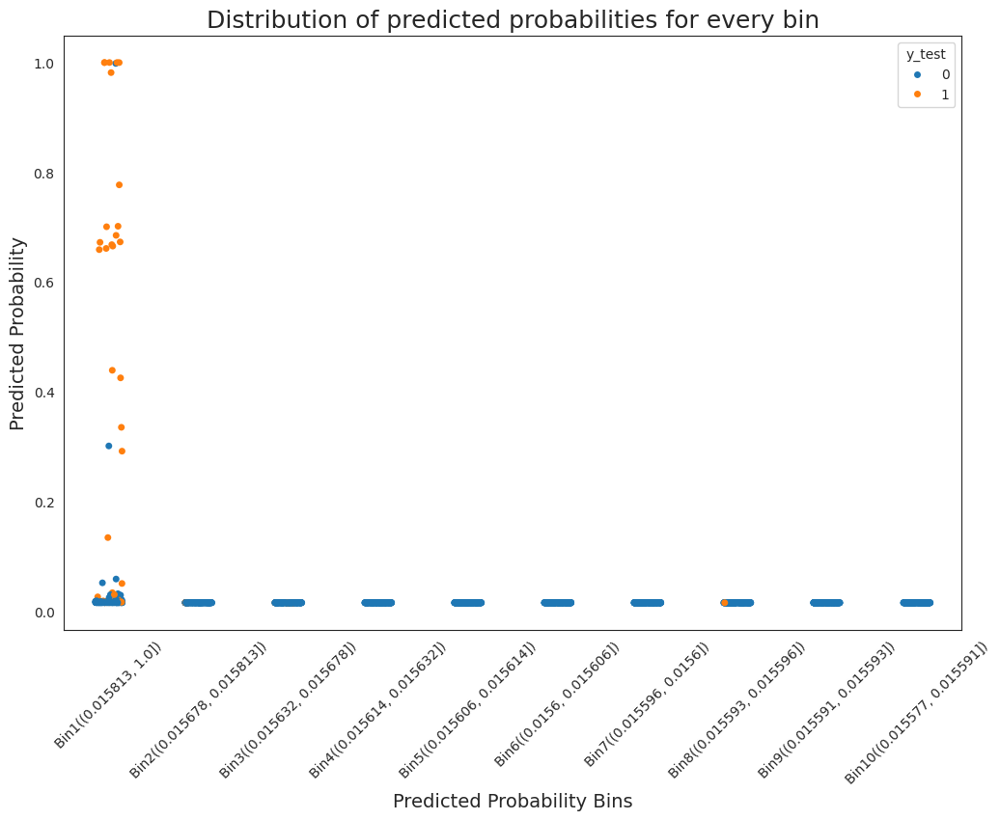

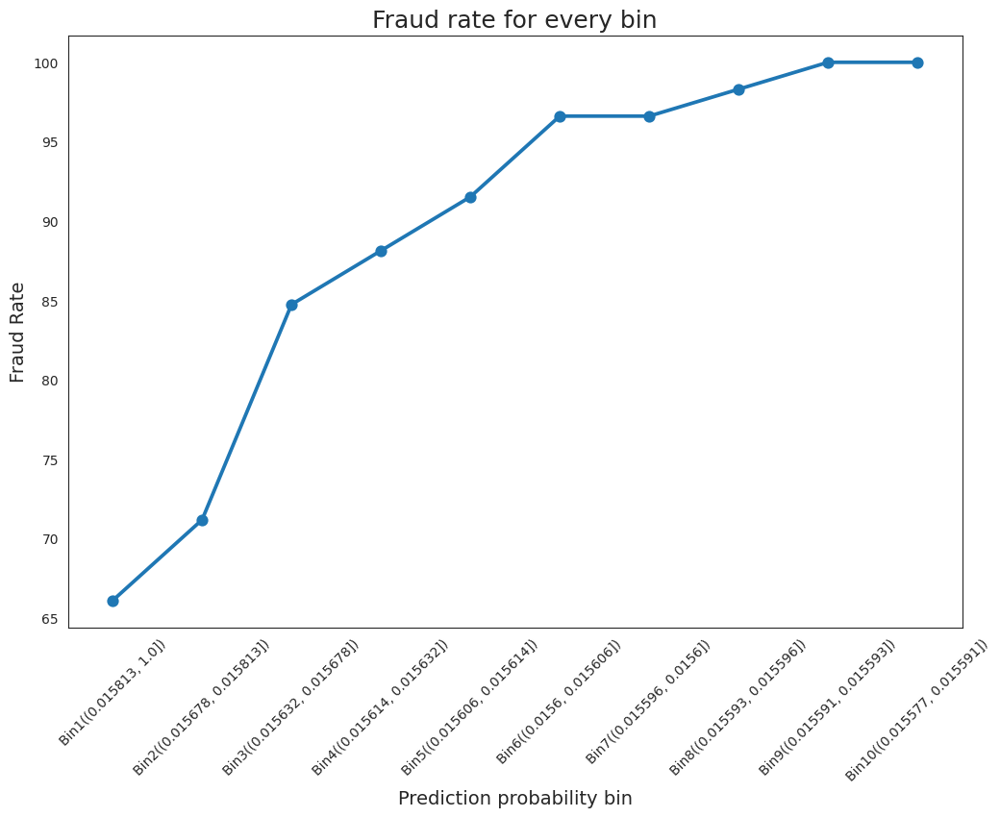

,prob_bin,not_fraud,fraud,perc_fraud,perc_not_fraud,cum_perc_fraud,cum_perc_not_fraud
0,"Bin1((0.015813, 1.0])",168,39,0.661017,0.083665,66.101695,8.366534
1,"Bin2((0.015678, 0.015813])",204,3,0.050847,0.101594,71.186441,18.525896
2,"Bin3((0.015632, 0.015678])",198,8,0.135593,0.098606,84.745763,28.386454
3,"Bin4((0.015614, 0.015632])",205,2,0.033898,0.102092,88.135593,38.595618
4,"Bin5((0.015606, 0.015614])",204,2,0.033898,0.101594,91.525424,48.754980
5,"Bin6((0.0156, 0.015606])",204,3,0.050847,0.101594,96.610169,58.914343
6,"Bin7((0.015596, 0.0156])",207,0,0.000000,0.103088,96.610169,69.223108
7,"Bin8((0.015593, 0.015596])",205,1,0.016949,0.102092,98.305085,79.432271
8,"Bin9((0.015591, 0.015593])",206,1,0.016949,0.102590,100.000000,89.691235
9,"Bin10((0.015577, 0.015591])",207,0,0.000000,0.103088,100.000000,100.000000


In [159]:
# Gains Table and Capture rates plot
captures(y_test, y_pred_calib, y_prob_pred_calib)

## 20. Model Tuning

**Hyperparameter** is a parameter that governs how the algorithm trains to learn the relationships. The values are set before the learning process begins.

**Hyperparameter tuning** refers to the automatic optimization of the hyper-parameters of a ML model.

In [161]:
%%time
# Define the estimator
lgbmclassifier = LGBMClassifier(random_state=0)

# Define the parameters gird
param_grid = {
    'n_estimator'   : [100,200],            # default: 100
    'num_leaves'    : [256,128],            # default: 256
    'max_depth'     : [5, 8],               # default: 8
    'learning_rate' : [0.05, 0.1],          # default: .1
    'reg_alpha'     : [0.1, 0.5],          # default: .5
    'class_weight'  : ['balanced', None],
}

# run grid search
grid = GridSearchCV(lgbmclassifier, param_grid=param_grid, refit = True, verbose = 3, n_jobs=-1,cv = 3)

# fit the model for grid search
grid.fit(X_train, y_train)

Fitting 3 folds for each of 64 candidates, totalling 192 fits
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Info] Number of positive: 110, number of negative: 4711
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13955
[LightGBM] [Info] Number of data points in the train set: 4821, number of used features: 433
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.022817 -> initscore=-3.757175
[LightGBM] [Info] Start training from score -3.757175
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

GridSearchCV(cv=3, estimator=LGBMClassifier(random_state=0), n_jobs=-1,
             param_grid={'class_weight': ['balanced', None],
                         'learning_rate': [0.05, 0.1], 'max_depth': [5, 8],
                         'n_estimator': [100, 200], 'num_leaves': [256, 128],
                         'reg_alpha': [0.1, 0.5]},
             verbose=3)

In [162]:
# Best parameter after hyper parameter tuning
print(grid.best_params_)

# Moel Parameters
print(grid.best_estimator_)

lgbmclassifier = grid.best_estimator_

{'class_weight': None, 'learning_rate': 0.05, 'max_depth': 8, 'n_estimator': 100, 'num_leaves': 256, 'reg_alpha': 0.1}
LGBMClassifier(learning_rate=0.05, max_depth=8, n_estimator=100, num_leaves=256,
               random_state=0, reg_alpha=0.1)


Let's use the best model to get predictions on test dataset. We would be looking at the predicted class and predicted probability both in order to evaluate the performance of the model

In [163]:
# Prediction using best parameters
y_grid_pred = lgbmclassifier.predict(X_test)
y_prob_grid_pred = lgbmclassifier.predict_proba(X_test)[:, 1]
print("Y predicted : ",y_grid_pred)
print("Y probability predicted : ",y_prob_grid_pred[:5])

[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
Y predicted :  [0 0 0 ... 0 0 0]
Y probability predicted :  [0.00260463 0.00081549 0.00046135 0.00039422 0.00055698]


Evaluation Metrics

Let's compute various evaluation metrices now
- Accuracy Score
- Confusion Matrix
- Classification Report
- AUC Score
- Concodense Index
- ROC curve
- PR curve


 Accuracy Score :  0.9772617319787131

 AUC Score :  0.8559828482679452

 Confusion Matrix : 
 [[2007    1]
 [  46   13]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2008
           1       0.93      0.22      0.36        59

    accuracy                           0.98      2067
   macro avg       0.95      0.61      0.67      2067
weighted avg       0.98      0.98      0.97      2067


 Concordance Index :  0.8559828482679451

 ROC curve : 

[LightGBM] [Warning] Unknown parameter: n_estimator


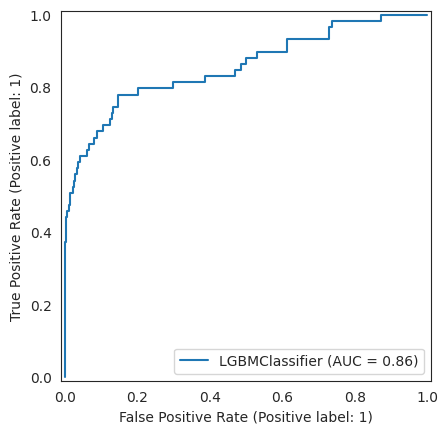


 PR curve : 

[LightGBM] [Warning] Unknown parameter: n_estimator


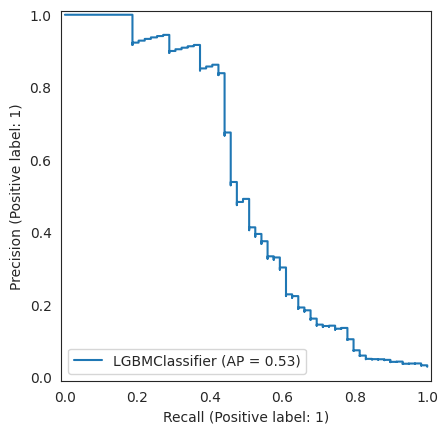

In [164]:
# Compute Evaluation Metric
compute_evaluation_metric(lgbmclassifier, X_test, y_test, y_grid_pred, y_prob_grid_pred)

####  Calibration Curve

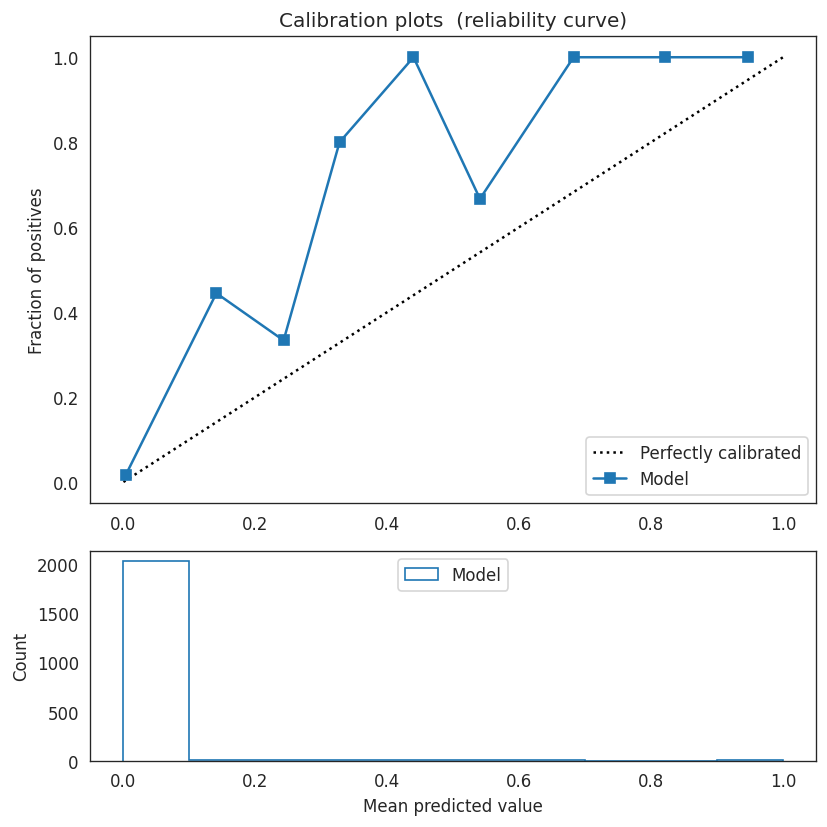

In [165]:
draw_calibration_curve(y_test, y_prob_grid_pred, n_bins=10)

### Calibrate the model

In [167]:
# Calibrate
calibrated_clf = CalibratedClassifierCV(estimator=lgbmclassifier, cv=3)
calibrated_clf.fit(X_train, y_train)
y_pred_calib = calibrated_clf.predict(X_test)
y_prob_pred_calib = calibrated_clf.predict_proba(X_test)[:, 1]

[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Info] Number of positive: 74, number of negative: 3140
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015526 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13356
[LightGBM] [Info] Number of data points in the train set: 3214, number of used features: 424
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.023024 -> initscore=-3.747913
[LightGBM] [Info] Start training from score -3.747913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

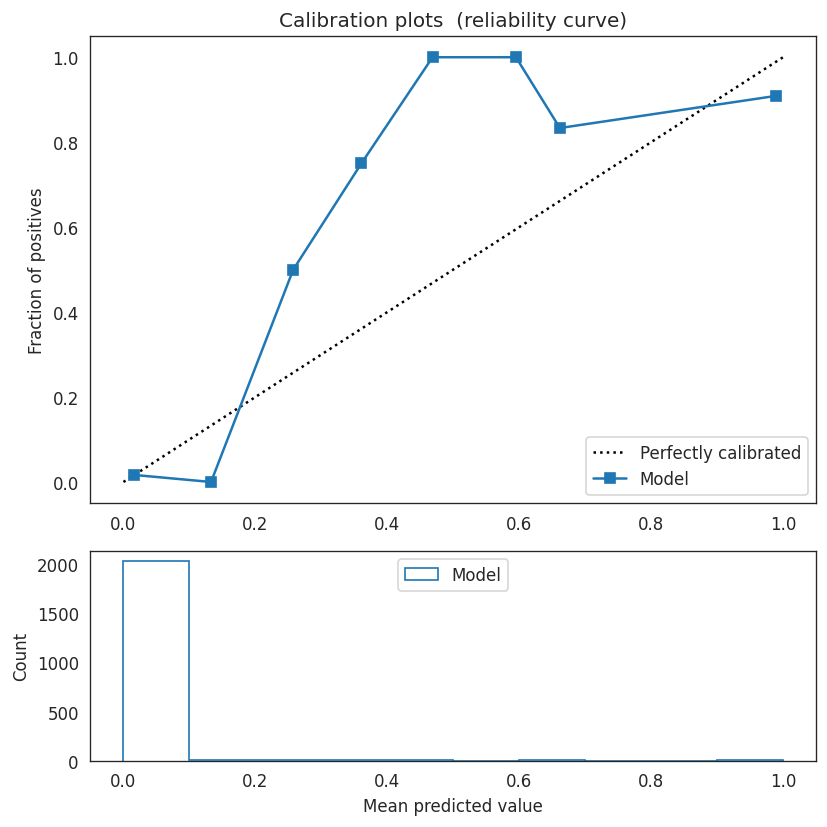

In [168]:
draw_calibration_curve(y_test, y_prob_pred_calib, n_bins=10)


 Accuracy Score :  0.9782293178519593

 AUC Score :  0.8656897832399216

 Confusion Matrix : 
 [[2006    2]
 [  43   16]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2008
           1       0.89      0.27      0.42        59

    accuracy                           0.98      2067
   macro avg       0.93      0.64      0.70      2067
weighted avg       0.98      0.98      0.97      2067


 Concordance Index :  0.8656897832399216

 ROC curve : 

[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator


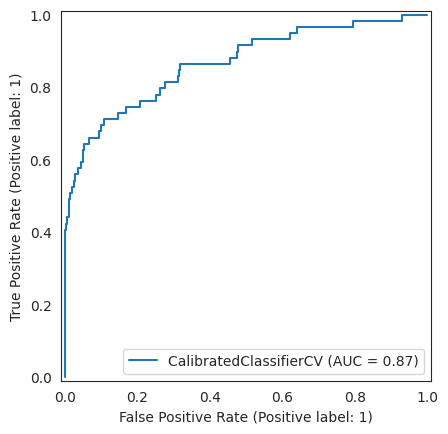


 PR curve : 

[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator


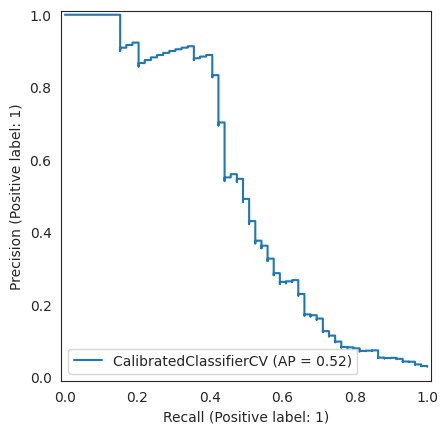

In [169]:
# Compute Evaluation Metric
compute_evaluation_metric(calibrated_clf, X_test, y_test, y_pred_calib, y_prob_pred_calib)

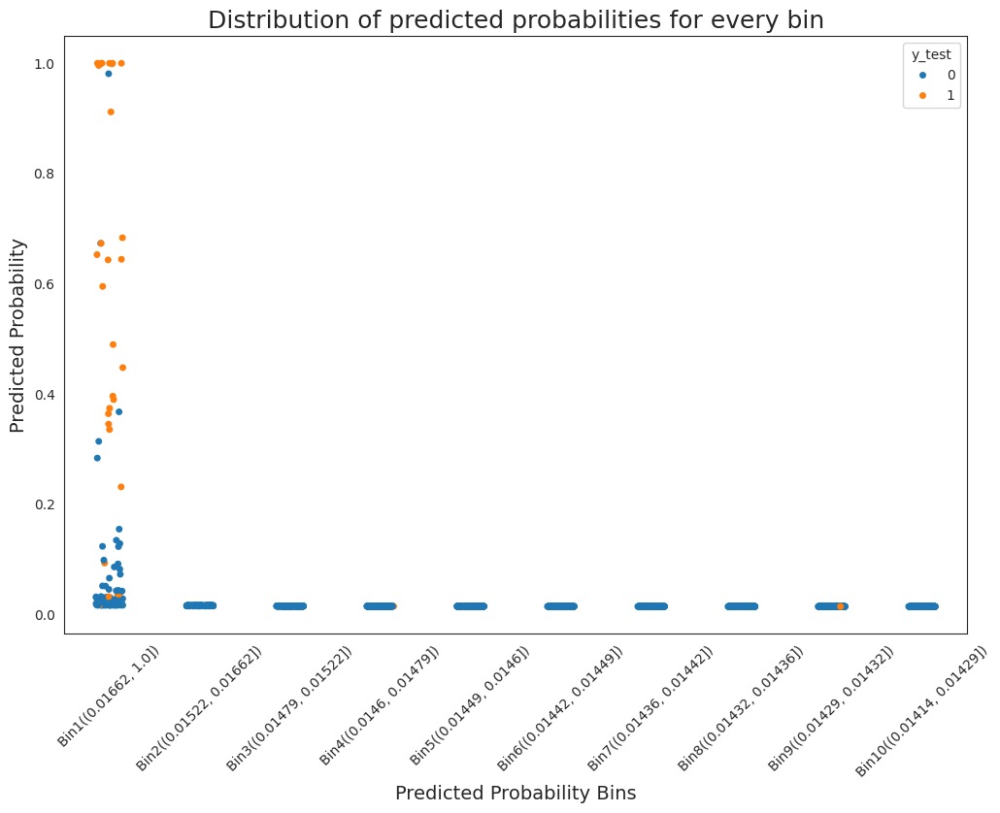

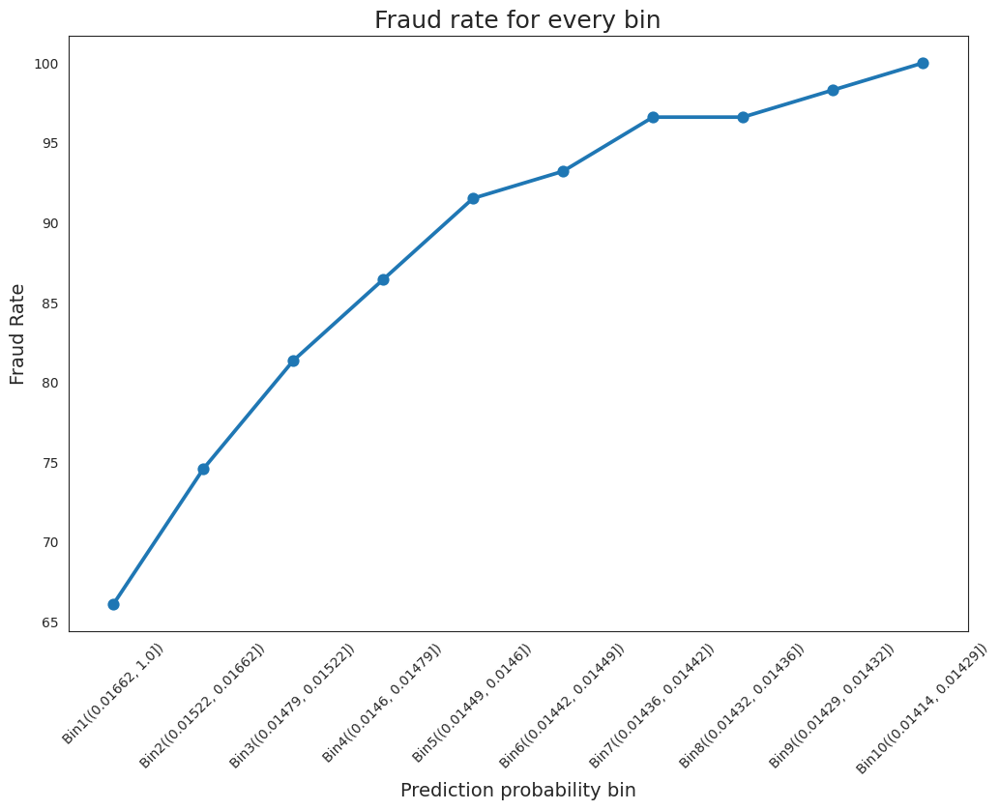

,prob_bin,not_fraud,fraud,perc_fraud,perc_not_fraud,cum_perc_fraud,cum_perc_not_fraud
0,"Bin1((0.01662, 1.0])",168,39,0.661017,0.083665,66.101695,8.366534
1,"Bin2((0.01522, 0.01662])",202,5,0.084746,0.100598,74.576271,18.426295
2,"Bin3((0.01479, 0.01522])",202,4,0.067797,0.100598,81.355932,28.486056
3,"Bin4((0.0146, 0.01479])",204,3,0.050847,0.101594,86.440678,38.645418
4,"Bin5((0.01449, 0.0146])",203,3,0.050847,0.101096,91.525424,48.754980
5,"Bin6((0.01442, 0.01449])",206,1,0.016949,0.102590,93.220339,59.013944
6,"Bin7((0.01436, 0.01442])",205,2,0.033898,0.102092,96.610169,69.223108
7,"Bin8((0.01432, 0.01436])",206,0,0.000000,0.102590,96.610169,79.482072
8,"Bin9((0.01429, 0.01432])",206,1,0.016949,0.102590,98.305085,89.741036
9,"Bin10((0.01414, 0.01429])",206,1,0.016949,0.102590,100.000000,100.000000


In [170]:
# Gains Table and Capture rates plot
captures(y_test, y_pred_calib, y_prob_pred_calib)

<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'>Inferences:</h3>
</div>

- Accuracy score is 0.91
- AUC score and Concordance index are 0.97, which are the best so far
- Classfication report is also balanced between both the classes
- ROC curve and PR are the best so far

Hence we can freeze the model.

## 21. Feature Importance

Feature importance refers to techniques that assign a score to input features based on how useful they are at predicting a target variable.

In [171]:
lgbmclassifier = grid.best_estimator_

In [172]:
lgbmclassifier.feature_importances_

array([ 83,   0, 142,  92,   2,   9,  42,  52, 107,   0,  40,  17,  12,
        82,  32,   0,   6,  48,  17,   3,   6,  14,   2,  28,  11,  82,
         7,  25, 109,  51,  56,  22,  13,   4,  51,  21,  23,   3,   0,
        14,   8,   3,   4,   0,   2,   0,   0,   0,   0,   0,   0,   8,
         2,   1,   3,   0,  10,  12,   0,   0,   9,   0,   9,  13,   0,
         0,   0,   1,   1,   2,  26,   0,   0,   0,   0,   0,   1,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   

In [173]:
feature_importance_df = pd.DataFrame({'feature' : X_train.columns, 'importance' : lgbmclassifier.feature_importances_ })

In [174]:
feature_importance_df = feature_importance_df.sort_values(by="importance", ascending=False)
feature_importance_df = feature_importance_df.iloc[:30,:]
feature_importance_df

,feature,importance
445,TransactionAmt_to_std_card1,180
2,card1,142
28,D2,109
8,addr1,107
443,TransactionAmt_to_mean_card1,99
3,card2,92
0,TransactionAmt,83
25,C13,82
13,C1,82
474,PCA_V_27,81


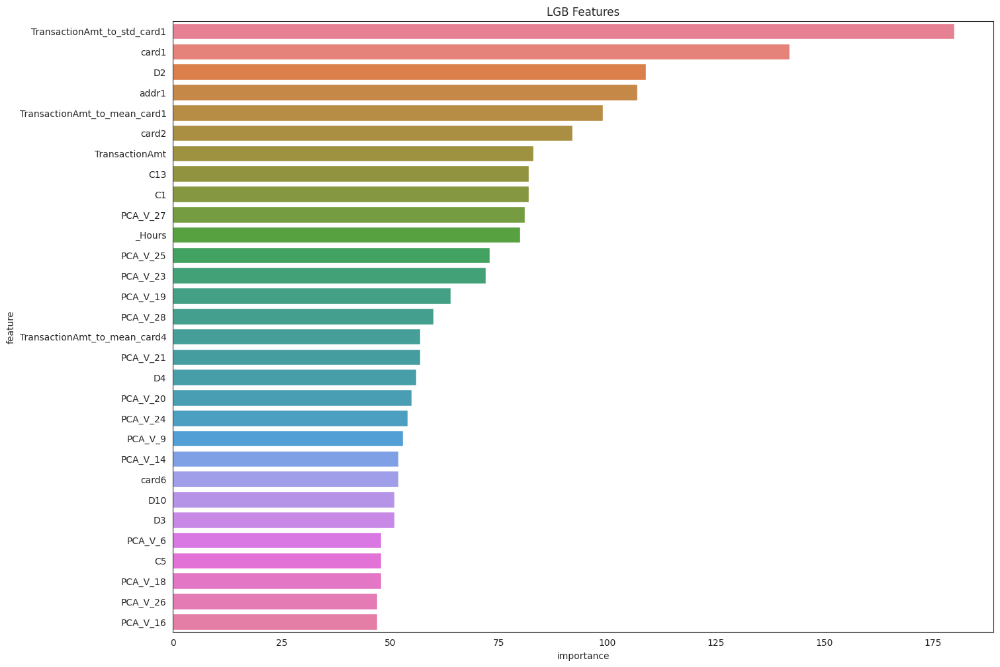

In [202]:
#plt.figure(figsize=(16, 12));
#sns.barplot(x="importance", y="feature", data=feature_importance_df.sort_values(by="importance", ascending=False));
#plt.title('LGB Features');
colors = sns.color_palette("husl", n_colors=len(feature_importance_df))

plt.figure(figsize=(16, 12))
sns.barplot(
    x="importance",
    y="feature",
    data=feature_importance_df.sort_values(by="importance", ascending=False),
    palette=colors
)
plt.title('LGB Features')
plt.show()


<div class="alert alert-info" style="padding:0px 10px; border-radius:5px;"><h3 style='margin:10px 5px'> Inferences:</h3>
</div>

- card1 is contributing the most in predicting if a transaction is fraud or not
- card2, addr1, C13, P_emaildomain, C1 etc are some of the most important features in predicting the fraud
- Certain card types, addresses and emails are at high risk of fraud, so there is a need to monitor these carefully

## 22. Partial Dependence and Individual Conditional Expectations (ICE)

In [177]:
## pdp plots
from sklearn.inspection import PartialDependenceDisplay
from sklearn.utils import validation

Fit the model

In [178]:
lgbmclassifier.fit(X_train, y_train)
lgbmclassifier.dummy_ = "dummy"

validation.check_is_fitted(estimator=lgbmclassifier)

[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Info] Number of positive: 110, number of negative: 4711
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062747 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13955
[LightGBM] [Info] Number of data points in the train set: 4821, number of used features: 433
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.022817 -> initscore=-3.757175
[LightGBM] [Info] Start training from score -3.757175
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

__Plot Partial Dependence__

[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [

<Figure size 1600x1200 with 0 Axes>

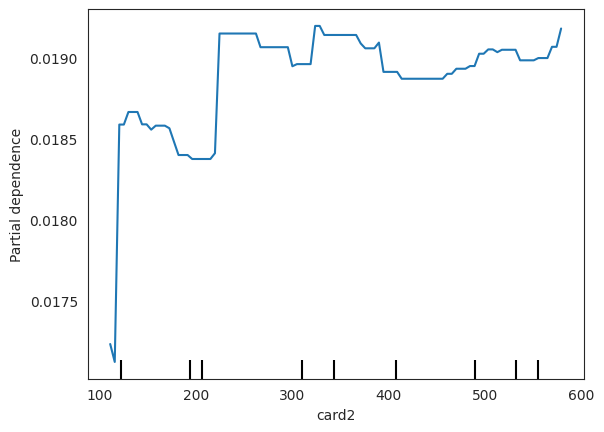

In [180]:
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

# Plot partial dependence for 'card2'
fig = plt.figure(figsize=(16, 12))
PartialDependenceDisplay.from_estimator(lgbmclassifier, X, ['card2'])
plt.show()


__Individual Conditional Expectation (ICE) Plot - card2__

[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [

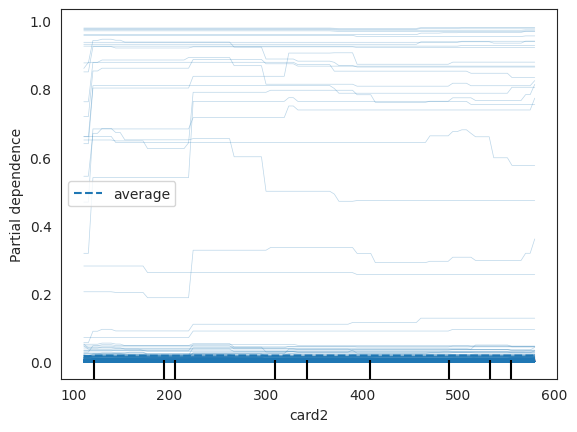

In [182]:
PartialDependenceDisplay.from_estimator(
    lgbmclassifier,       # your trained model
    X,                    # your dataset (should be a DataFrame)
    features=['card2'],   # feature to plot
    kind='both'           # plots both partial dependence and ICE lines
)


__Partial Dependence  and ICE Plot - C13__

[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [

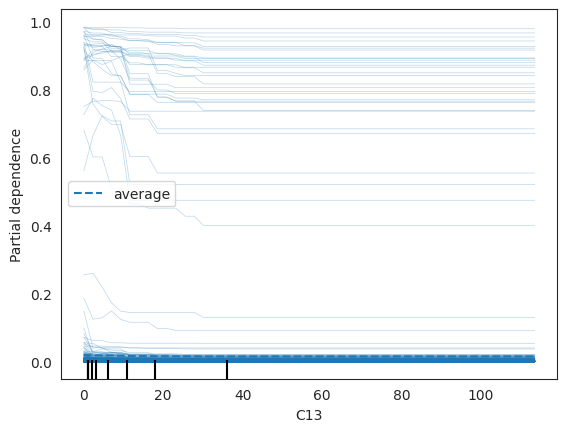

In [184]:
PartialDependenceDisplay.from_estimator(
    lgbmclassifier,     # your fitted model
    X,                  # your feature DataFrame
    features=['C13'],   # feature to analyze
    kind='both',        # both PDP and ICE lines
    grid_resolution=50  # optional, controls the smoothness
)

plt.show()


[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [Warning] Unknown parameter: n_estimator
[LightGBM] [

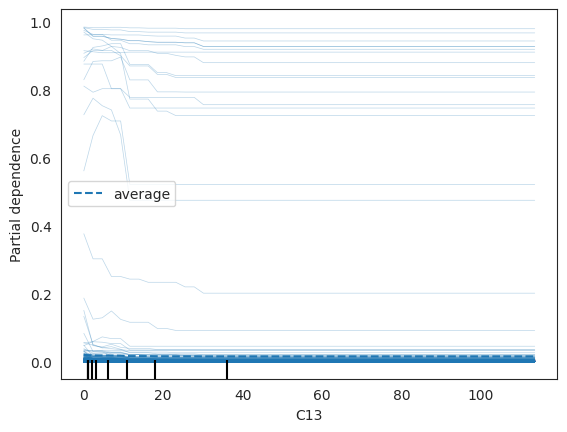

In [186]:
PartialDependenceDisplay.from_estimator(
    lgbmclassifier,     # your fitted model
    X,                  # your feature DataFrame
    features=['C13'],   # feature to analyze
    kind='both',        # both PDP and ICE lines
    grid_resolution=50  # optional, controls the smoothness
)

plt.show()


## 23. SHAP Values

SHAP values is used to reverse engineer the output of the prediction model and quantify the contribution of each predictor for a given prediction.

In [187]:
import shap
shap_model = shap.TreeExplainer(lgbmclassifier)
shap_values = shap_model.shap_values(X_train)

You can make a partial dependence plot using `shap.dependence_plot`. This shows the relationship between the feature and the Y. This also automatically includes another feature that your feature interacts frequently with.



In [190]:
import shap

# Create a SHAP explainer for tree-based models
explainer = shap.TreeExplainer(lgbmclassifier)

# Compute SHAP values
shap_values = explainer.shap_values(X_train)


In [193]:
explainer = shap.TreeExplainer(lgbmclassifier)
shap_values = explainer.shap_values(X_train)

print(type(shap_values))
print(np.array(shap_values).shape)


<class 'numpy.ndarray'>
(4821, 477)


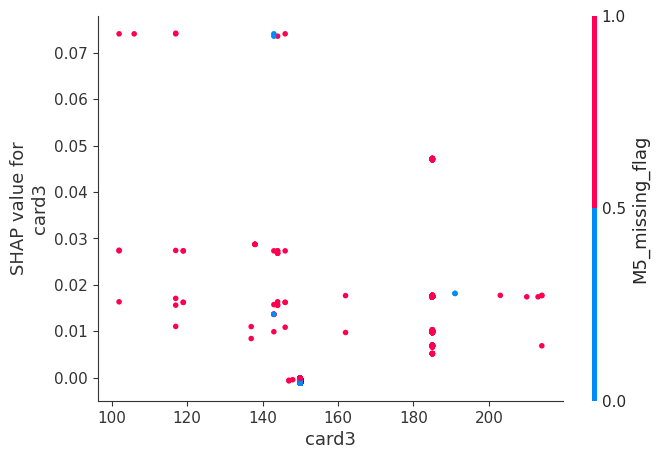

In [194]:
shap.dependence_plot("card3", shap_values, X_train)


**Explain a single observation.**

In [196]:
shap.initjs()
shap.force_plot(shap_model.expected_value, shap_values[14], X_train.iloc[14, :])


Add link = "logit"**bold text**

In [198]:
shap.initjs()
shap.force_plot(shap_model.expected_value, shap_values[14], X_train.iloc[14, :], link='logit')


In [200]:
y_pred_calib[14]          # Predicted class (e.g. 0 or 1)
# or
y_prob_pred_calib[14]     # Predicted probability of class 1


np.float64(0.014596507774605435)

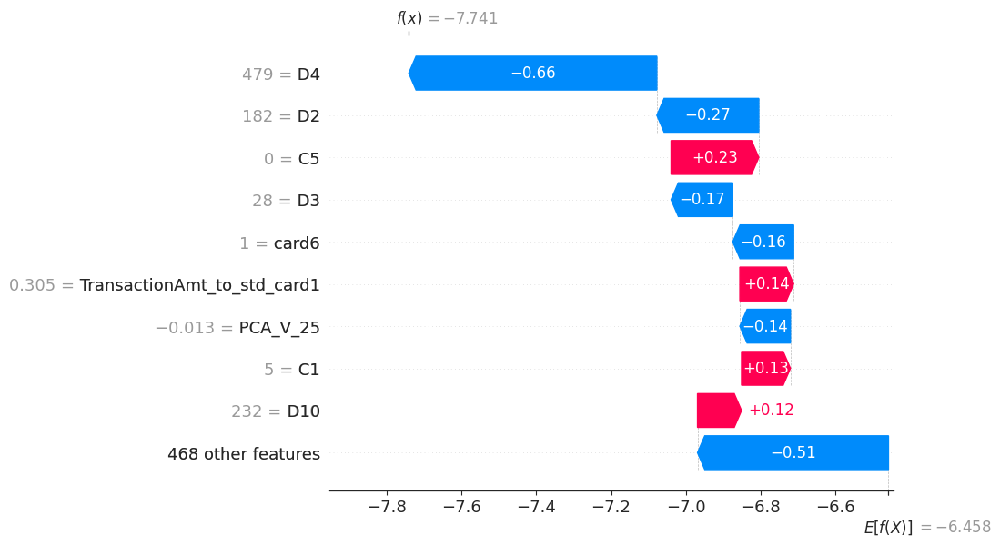

In [201]:
# compute SHAP values
explainer = shap.Explainer(lgbmclassifier, X_train) # , link=shap.links.logit)
shap_values_waterfall = explainer(X_train[:100])

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values_waterfall[0])

## Final Words

0. __Problem Understanding__
1. __Data Overview__
2. __Optimize memory__
3. __Data Stats and Exploratory Data Analysis__
4. __Significance Tests__
5. __Feature Engineering, Encoding, PCA__
6. __XGBoost__
7. __Evaluation Metrics for Fraud classification__
8. __Calibration__
9. __Handling class imbalance with oversampling__
10. __Cost sensitive Learning__
11. __Model Tuning__
12. __Feature Importance__
13. __Partial Dependence and ICE__
14. __SHAP values__

The model has been trained and tested, so now you can use it to predict if any transaction would be fraud or not.

One very important thing to note is that you need monitor the performance of the model as you gather new data. If it deteriorates, re-train the model with new training data and use it for making detecting fraud transactions.